In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/agro-environmental-dataset/agro_environmental_dataset.csv


In [3]:
print("""
🌱🌾🚜 Welcome to the Agro-Environmental Dataset Analysis! 🚜🌾🌱

Introduction:
This dataset provides a comprehensive view of various agro-environmental factors influencing crop suitability and potential failures across different locations. It simulates real-world agricultural scenarios to help understand how soil properties, climate conditions, and nutrient levels affect plant growth for vegetables, cereals, and legumes.

Dataset Description:
- **Number of Records**: 543,210 entries, each representing a unique location (from L00000 to L543209).
- **Key Columns** (25 in total):
  - **location_id**: Unique identifier (e.g., 'L00000').
  - **soil_type**: Type of soil, with 9 unique types including Clayey, Alluvial, Chalky, Silty, Loamy, Sandy, Laterite, Peaty, and Saline.
  - **bulk_density**: Soil density (mean ~1.32 g/cm³, range 0.7-1.6).
  - **organic_matter_pct**: Organic matter percentage (mean ~4.0%, up to 18% in peaty soils).
  - **cation_exchange_capacity**: CEC value (mean ~15.6, range 5-40).
  - **salinity_ec**: Electrical conductivity for salinity (mean ~0.64, higher in saline soils).
  - **buffering_capacity**: Soil buffering (mean ~0.59).
  - **soil_moisture_pct**: Current soil moisture (mean ~33.5%, range ~5-70%).
  - **moisture_limit_dry/moisture_limit_wet**: Dry and wet moisture limits.
  - **moisture_regime**: Regime type (dry, optimal, waterlogged).
  - **soil_temp_c/air_temp_c**: Soil and air temperatures (means ~24.6°C and ~28.0°C).
  - **thermal_regime**: Thermal condition (optimal, heat_stress, cold).
  - **light_intensity_par**: Photosynthetically active radiation (mean ~710 µmol/m²/s).
  - **soil_ph**: pH level (mean ~6.45, range 4-8.5).
  - **ph_stress_flag**: Binary flag for pH stress (0: no stress - 79.4%, 1: stress - 20.6%).
  - **nitrogen_ppm/phosphorus_ppm/potassium_ppm**: Nutrient levels (means ~100.6, 50.0, 100.3 ppm).
  - **nutrient_balance**: Balance status (excessive, optimal, deficient).
  - **plant_category**: Crop type (vegetable, cereal, legume).
  - **suitability_score**: Score from 0 to 1 indicating crop suitability (mean ~0.63).
  - **stress_level**: Stress indicator (0: low - 32.3%, 1: medium - 44.0%, 2: high - 23.7%).
  - **failure_flag**: Binary failure indicator (0: success - 83.8%, 1: failure - 16.2%).

💧☀️🌡️ Problem Framing:
In modern agriculture, predicting crop success or failure is crucial for sustainable farming. This dataset allows us to frame the problem as a machine learning task: Predict the 'failure_flag' or 'suitability_score' based on environmental and soil features. Key challenges include handling imbalanced classes (failures are only 16%), dealing with categorical variables like soil_type and regimes, and identifying stress factors (e.g., waterlogged moisture or heat_stress) that lead to low suitability.

Potential Applications:
- Build classification models to forecast failures. 🛠️
- Analyze feature importance to recommend soil amendments. 📊
- Visualize correlations between nutrients, pH, and crop types. 📈

Let's dig into the data and cultivate some insights! 🌿
""")


🌱🌾🚜 Welcome to the Agro-Environmental Dataset Analysis! 🚜🌾🌱

Introduction:
This dataset provides a comprehensive view of various agro-environmental factors influencing crop suitability and potential failures across different locations. It simulates real-world agricultural scenarios to help understand how soil properties, climate conditions, and nutrient levels affect plant growth for vegetables, cereals, and legumes.

Dataset Description:
- **Number of Records**: 543,210 entries, each representing a unique location (from L00000 to L543209).
- **Key Columns** (25 in total):
  - **location_id**: Unique identifier (e.g., 'L00000').
  - **soil_type**: Type of soil, with 9 unique types including Clayey, Alluvial, Chalky, Silty, Loamy, Sandy, Laterite, Peaty, and Saline.
  - **bulk_density**: Soil density (mean ~1.32 g/cm³, range 0.7-1.6).
  - **organic_matter_pct**: Organic matter percentage (mean ~4.0%, up to 18% in peaty soils).
  - **cation_exchange_capacity**: CEC value (mean ~15.6, ra

In [4]:
# =============================================================================
# Agro-Environmental Dataset - Data Cleaning & Preprocessing 
# Initial Inspection + Basic Cleaning
# =============================================================================

import pandas as pd
import numpy as np

# ────────────────────────────────────────────────
# 1. Load the dataset
# ────────────────────────────────────────────────
print("Loading dataset...")
# If you're reading from the provided file:
df = pd.read_csv("/kaggle/input/agro-environmental-dataset/agro_environmental_dataset.csv")

print(f"Dataset shape: {df.shape}")
print(f"Number of rows: {len(df):,}")
print(f"Number of columns: {df.shape[1]}\n")

# ────────────────────────────────────────────────
# 2. Basic Information – df.info()
# ────────────────────────────────────────────────
print("=== Dataset Information ===")
df.info()
print("\n")

# ────────────────────────────────────────────────
# 3. Statistical Summary – df.describe()
# ────────────────────────────────────────────────
print("=== Numerical Features Summary ===")
print(df.describe().round(3).T)   # Transposed for better readability
print("\n")

# ────────────────────────────────────────────────
# 4. Check missing values
# ────────────────────────────────────────────────
print("=== Missing Values ===")
missing = df.isnull().sum()
missing_percent = (missing / len(df)) * 100
missing_df = pd.DataFrame({
    'Missing Count': missing,
    'Missing %': missing_percent.round(3)
}).sort_values('Missing Count', ascending=False)

print(missing_df[missing_df['Missing Count'] > 0])
if missing.sum() == 0:
    print("→ Great! No missing values found in the dataset.")
print("\n")

# ────────────────────────────────────────────────
# 5. Quick look at categorical columns
# ────────────────────────────────────────────────
cat_columns = df.select_dtypes(include=['object']).columns
print(f"Categorical columns ({len(cat_columns)}):")
print(list(cat_columns))
print("\nValue counts for important categorical features:\n")

important_cats = ['soil_type', 'moisture_regime', 'thermal_regime', 
                  'nutrient_balance', 'plant_category', 'failure_flag']

for col in important_cats:
    if col in df.columns:
        print(f"→ {col}")
        print(df[col].value_counts(dropna=False).head(10))
        print()

# ────────────────────────────────────────────────
# 6. Basic data quality checks & cleaning
# ────────────────────────────────────────────────

print("=== Data Quality Checks & Cleaning ===\n")

# 6.1 Check for duplicate rows
duplicates = df.duplicated().sum()
print(f"Number of duplicate rows: {duplicates}")
if duplicates > 0:
    print("→ Removing duplicates...")
    df = df.drop_duplicates()
    print(f"Shape after removing duplicates: {df.shape}\n")

# 6.2 Check location_id uniqueness
if 'location_id' in df.columns:
    n_unique_loc = df['location_id'].nunique()
    print(f"Number of unique location_id: {n_unique_loc:,}")
    print(f"Matches row count? → {n_unique_loc == len(df)}\n")

# 6.3 Convert failure_flag to integer (if it's stored as object)
if df['failure_flag'].dtype == 'object':
    print("Converting failure_flag to integer...")
    df['failure_flag'] = df['failure_flag'].astype(int)

# 6.4 Convert suitability_score to float (just in case)
df['suitability_score'] = df['suitability_score'].astype(float)

# 6.5 Check unrealistic / extreme values (example rules)
print("Checking for suspicious values:")

# Soil moisture > 100% ?
print(f"Soil moisture > 100%: { (df['soil_moisture_pct'] > 100).sum() } rows")

# pH outside reasonable range
print(f"Soil pH < 3 or > 10 : { ((df['soil_ph'] < 3) | (df['soil_ph'] > 10)).sum() } rows")

# Temperatures below -10 or above 60 (very unlikely in most agro contexts)
print(f"Air temp < -10 or > 60°C : { ((df['air_temp_c'] < -10) | (df['air_temp_c'] > 60)).sum() } rows")

# Nutrient values extremely low or negative
print(f"Negative nutrient values: ")
print(df[['nitrogen_ppm','phosphorus_ppm','potassium_ppm']].lt(0).sum())

print("\n")

# ────────────────────────────────────────────────
# 7. Final shape & memory usage
# ────────────────────────────────────────────────
print("=== Final Dataset Status ===")
print(f"Shape after basic cleaning: {df.shape}")
print(f"Memory usage: {df.memory_usage(deep=True).sum() / 1024**2 :.1f} MB\n")

print("Basic cleaning & inspection completed ✓")
print("Ready for further feature engineering, encoding, or modeling!")

Loading dataset...
Dataset shape: (543210, 25)
Number of rows: 543,210
Number of columns: 25

=== Dataset Information ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 543210 entries, 0 to 543209
Data columns (total 25 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   location_id               543210 non-null  object 
 1   soil_type                 543210 non-null  object 
 2   bulk_density              543210 non-null  float64
 3   organic_matter_pct        543210 non-null  float64
 4   cation_exchange_capacity  543210 non-null  int64  
 5   salinity_ec               543210 non-null  float64
 6   buffering_capacity        543210 non-null  float64
 7   soil_moisture_pct         543210 non-null  float64
 8   moisture_limit_dry        543210 non-null  int64  
 9   moisture_limit_wet        543210 non-null  int64  
 10  moisture_regime           543210 non-null  object 
 11  soil_temp_c               543210 n

In [2]:
df=pd.read_csv('/kaggle/input/agro-environmental-dataset/agro_environmental_dataset.csv')
df

,location_id,soil_type,bulk_density,organic_matter_pct,cation_exchange_capacity,salinity_ec,buffering_capacity,soil_moisture_pct,moisture_limit_dry,moisture_limit_wet,...,soil_ph,ph_stress_flag,nitrogen_ppm,phosphorus_ppm,potassium_ppm,nutrient_balance,plant_category,suitability_score,stress_level,failure_flag
0,L00000,Clayey,1.1,4.0,30,0.5,0.9,5.17,25,52,...,6.48,0,100.1,50.8,121.3,excessive,vegetable,0.677,1,0
1,L00001,Alluvial,1.3,3.8,20,0.4,0.7,26.28,16,45,...,6.43,0,133.8,54.9,151.6,optimal,vegetable,0.871,0,0
2,L00002,Chalky,1.5,2.0,8,0.3,0.4,44.90,12,35,...,5.01,1,84.5,83.6,83.6,deficient,vegetable,0.000,2,1
3,L00003,Silty,1.4,3.0,18,0.4,0.6,27.05,18,42,...,5.41,1,168.2,30.5,220.0,deficient,cereal,0.510,1,0
4,L00004,Loamy,1.3,3.5,15,0.3,0.7,36.56,15,40,...,6.73,0,98.9,63.4,88.9,optimal,vegetable,1.000,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
543205,L543205,Chalky,1.5,2.0,8,0.3,0.4,45.39,12,35,...,7.32,0,86.9,31.1,124.7,deficient,cereal,0.188,2,1
543206,L543206,Peaty,0.7,18.0,40,0.2,0.8,26.78,30,65,...,5.67,0,84.4,12.2,101.1,deficient,cereal,0.458,1,0
543207,L543207,Clayey,1.1,4.0,30,0.5,0.9,25.68,25,52,...,6.28,0,77.4,40.5,49.7,optimal,legume,0.939,0,0
543208,L543208,Alluvial,1.3,3.8,20,0.4,0.7,38.95,16,45,...,6.24,0,76.7,76.7,84.3,optimal,cereal,0.994,0,0


Generating histograms + KDE for key soil & environmental variables...



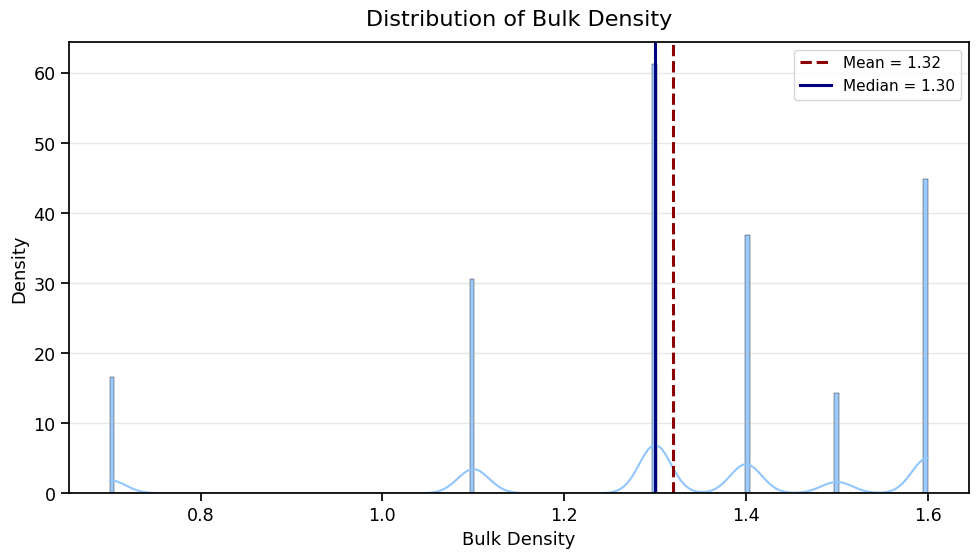

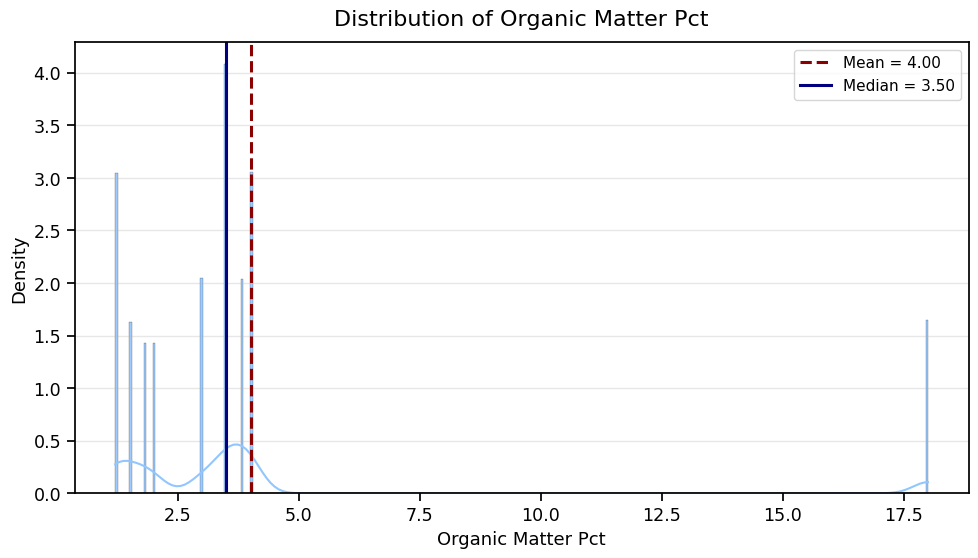

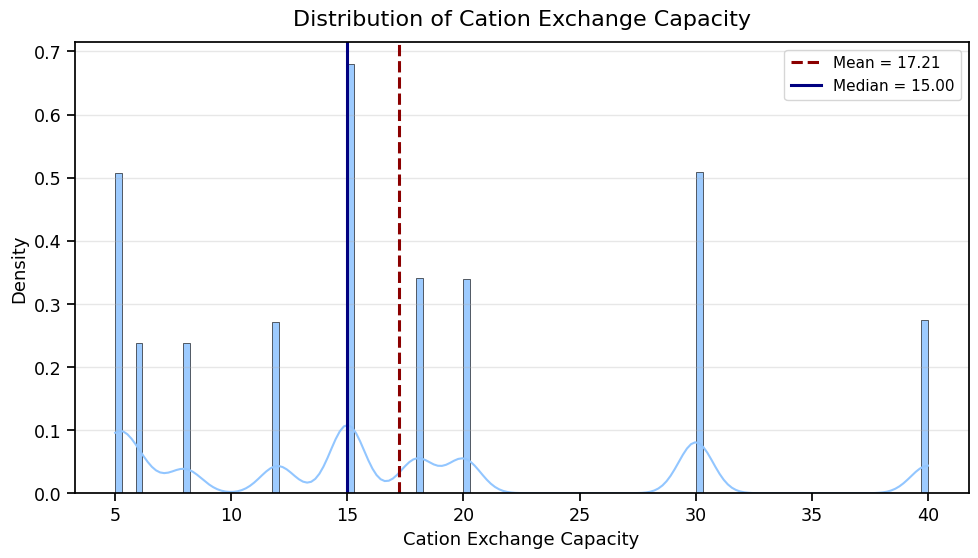

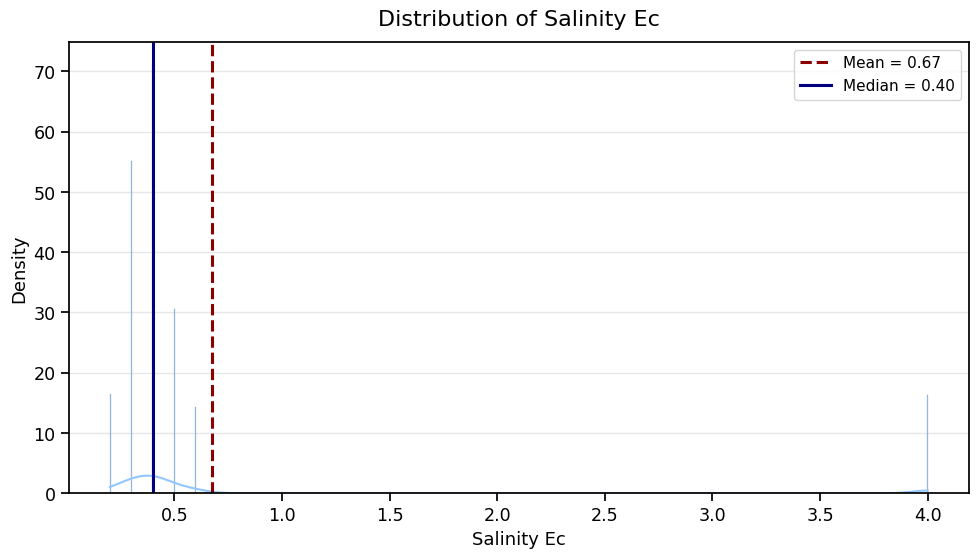

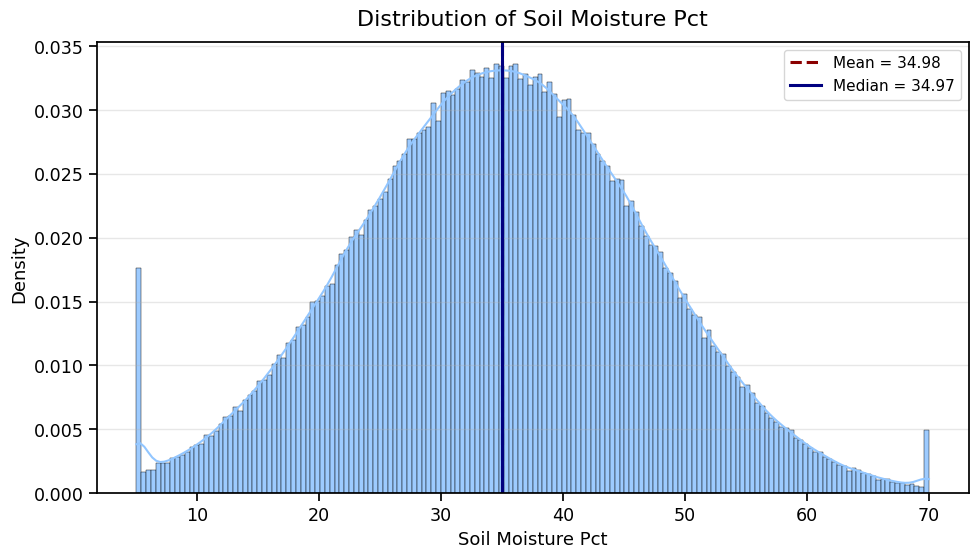

...

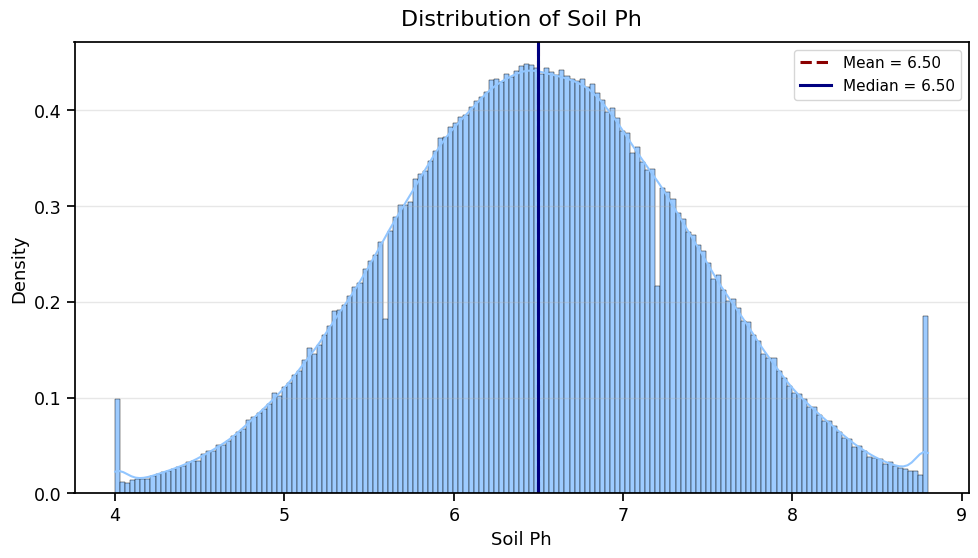

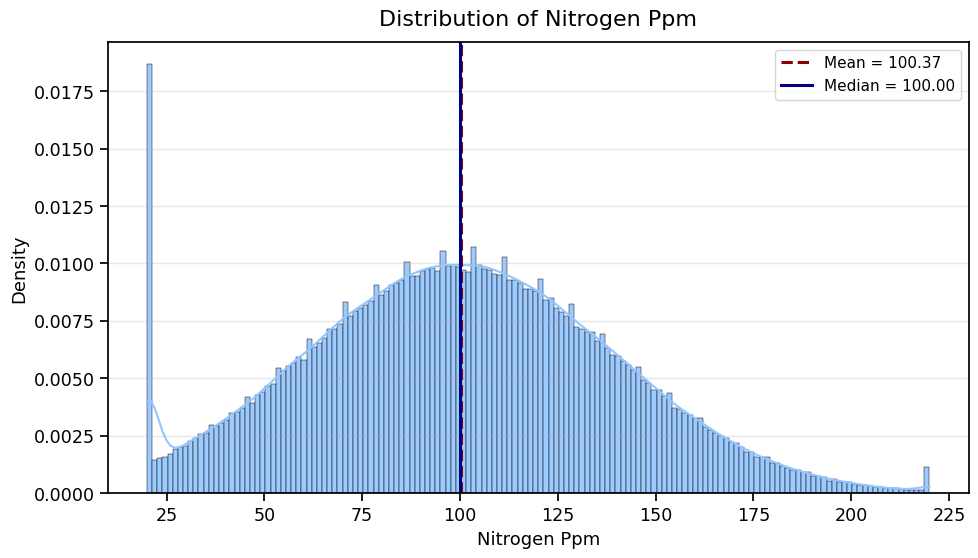

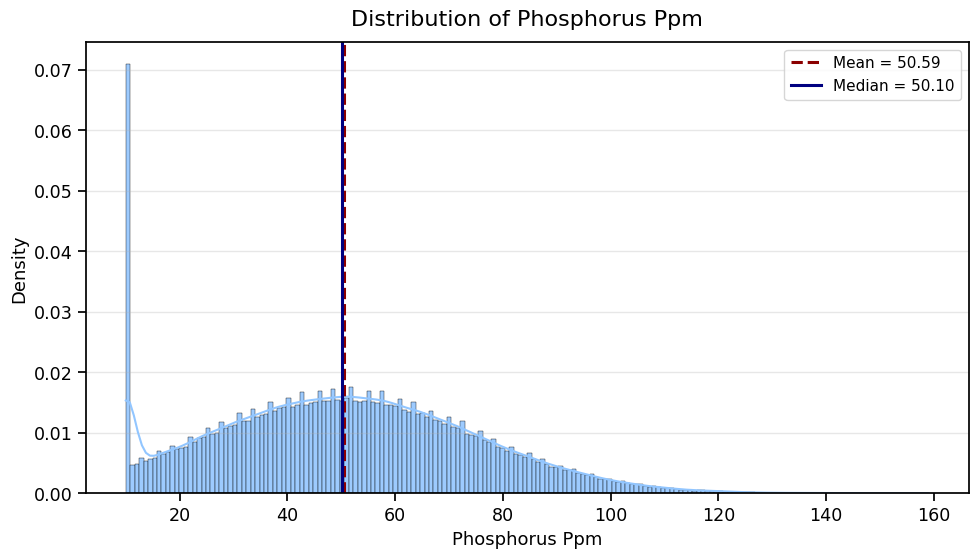

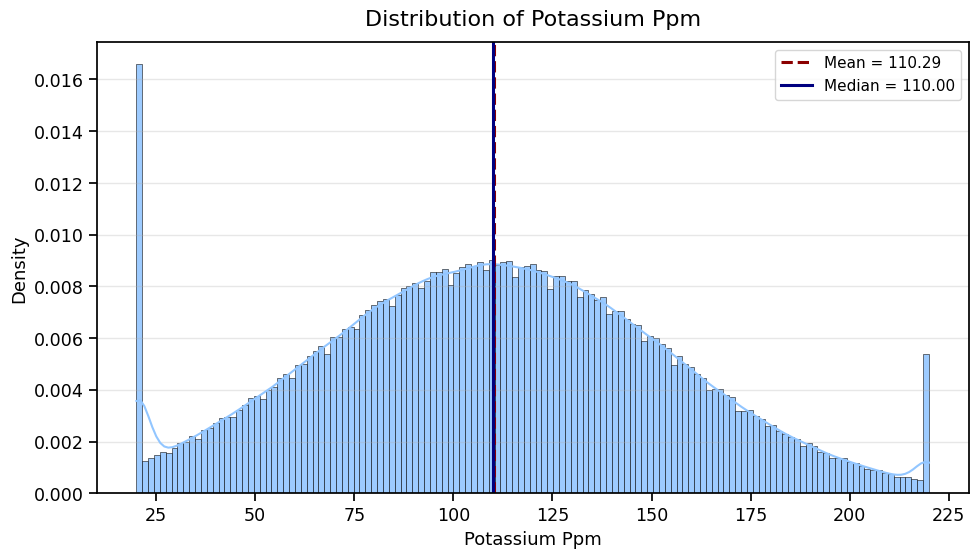

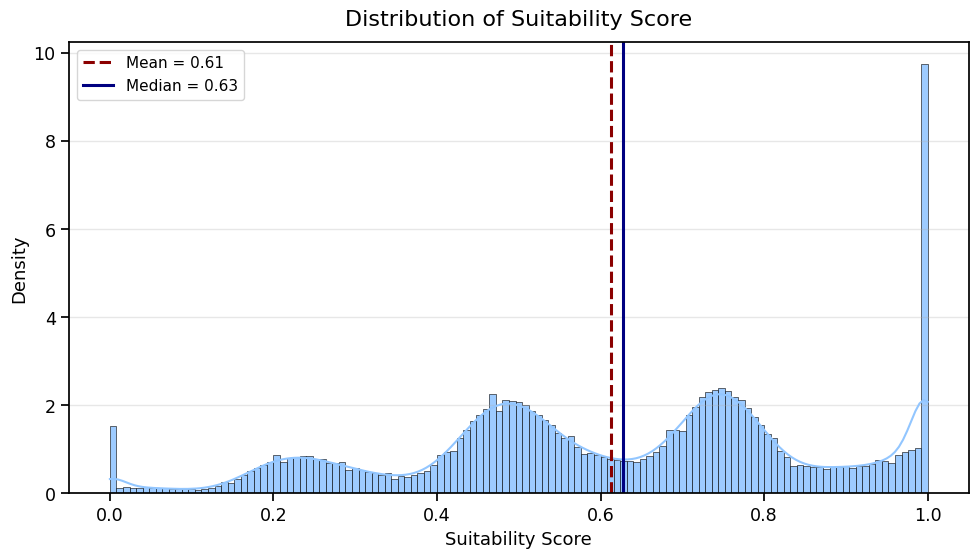


Suitability Score – split by actual failure


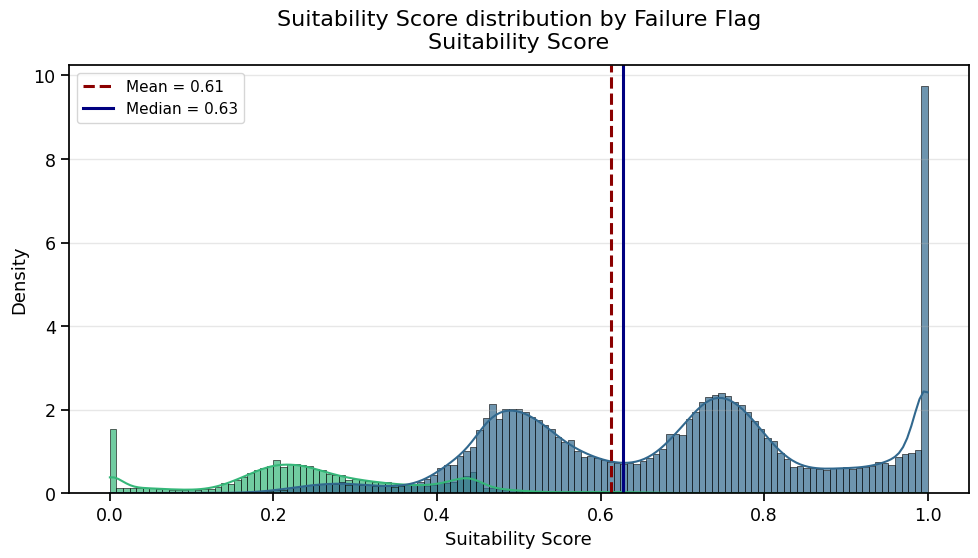


Overall failure rate: 16.21%
→ Class imbalance is moderate — about 1:5 ratio


In [6]:
# =============================================================================
# Agro-Environmental Dataset – Important Histograms 
# Visualizing key continuous features + target-related variables
# =============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ────────────────────────────────────────────────
# Style setup
# ────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-pastel')
sns.set_context("notebook", font_scale=1.15)
plt.rcParams['figure.dpi'] = 100
plt.rcParams['figure.figsize'] = (10, 5.5)

# ────────────────────────────────────────────────
# Load data 
# ────────────────────────────────────────────────
df = pd.read_csv("/kaggle/input/agro-environmental-dataset/agro_environmental_dataset.csv")

# ────────────────────────────────────────────────
# List of the most informative numeric features to plot
# ────────────────────────────────────────────────
important_numeric_cols = [
    'bulk_density',
    'organic_matter_pct',
    'cation_exchange_capacity',
    'salinity_ec',
    'soil_moisture_pct',
    'soil_temp_c',
    'air_temp_c',
    'light_intensity_par',
    'soil_ph',
    'nitrogen_ppm',
    'phosphorus_ppm',
    'potassium_ppm',
    'suitability_score'
]

# Target / outcome variables we especially care about
target_vars = ['suitability_score', 'stress_level']

# ────────────────────────────────────────────────
# Function to plot histogram + some stats
# ────────────────────────────────────────────────
def plot_hist_kde(col, hue=None, title_prefix=""):
    fig, ax = plt.subplots(figsize=(10, 5.8))
    
    sns.histplot(
        data=df,
        x=col,
        kde=True,
        stat="density",
        hue=hue,
        palette="viridis" if hue else None,
        alpha=0.7 if hue else 0.9,
        ax=ax
    )
    
    # Add mean & median lines
    mean_val = df[col].mean()
    median_val = df[col].median()
    
    ax.axvline(mean_val, color='darkred', linestyle='--', linewidth=2.2,
               label=f'Mean = {mean_val:.2f}')
    ax.axvline(median_val, color='navy', linestyle='-', linewidth=2.2,
               label=f'Median = {median_val:.2f}')
    
    ax.set_title(f"{title_prefix}{col.replace('_', ' ').title()}", fontsize=16, pad=12)
    ax.set_xlabel(col.replace('_', ' ').title(), fontsize=13)
    ax.set_ylabel("Density", fontsize=13)
    ax.legend(fontsize=11)
    ax.grid(True, alpha=0.3, axis='y')
    
    plt.tight_layout()
    plt.show()

# ────────────────────────────────────────────────
# 1. Plot all important continuous features
# ────────────────────────────────────────────────
print("Generating histograms + KDE for key soil & environmental variables...\n")

for col in important_numeric_cols:
    plot_hist_kde(col, title_prefix="Distribution of ")

# ────────────────────────────────────────────────
# 2. Suitability score – colored by failure_flag
# ────────────────────────────────────────────────
print("\nSuitability Score – split by actual failure")
plot_hist_kde('suitability_score', hue='failure_flag',
              title_prefix="Suitability Score distribution by Failure Flag\n")

# ────────────────────────────────────────────────
# 3. Failure rate quick look
# ────────────────────────────────────────────────
failure_rate = df['failure_flag'].mean() * 100
print(f"\nOverall failure rate: {failure_rate:.2f}%")
print("→ Class imbalance is moderate — about 1:5 ratio")

Shape: (543210, 25) 

1. Rolling mean suitability score – ordered by air temperature



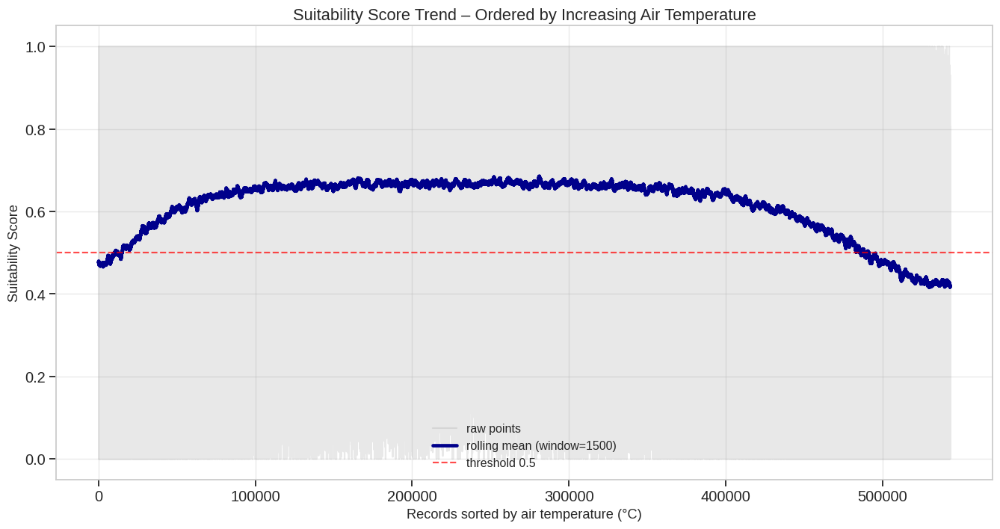

→ Interpretation: look for systematic drop/rise at certain temperature ranges
   Common pattern: sharp decline above ~32–35 °C
-------------------------------------------------------------------------------- 

2. Rolling mean suitability – ordered by soil moisture %



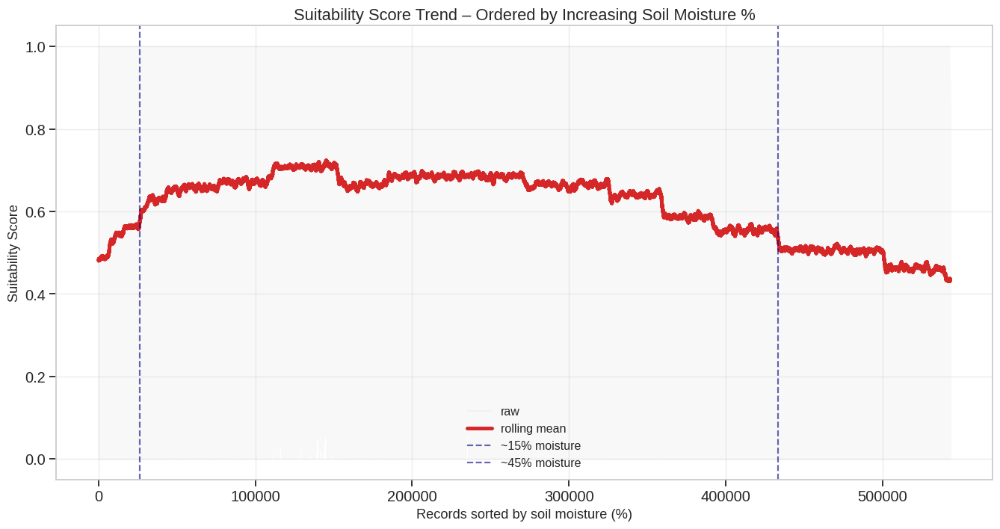

→ Classic U-shaped / inverted-U pattern expected → dry + waterlogged stress
-------------------------------------------------------------------------------- 

3. Mean suitability score by temperature bins (line + error)



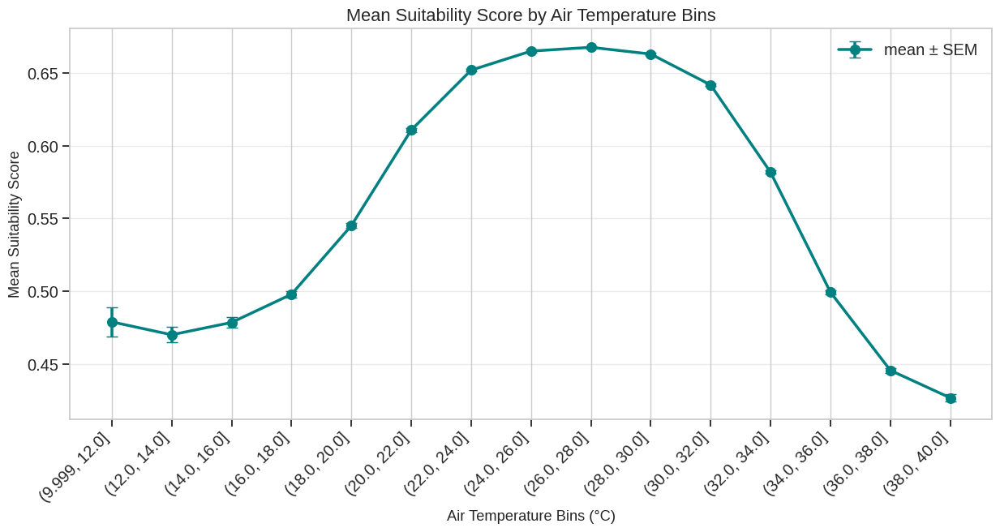

→ Look for: optimum temperature range, sharp drops at extremes
-------------------------------------------------------------------------------- 

4. Cumulative failure rate – ordered by air temperature



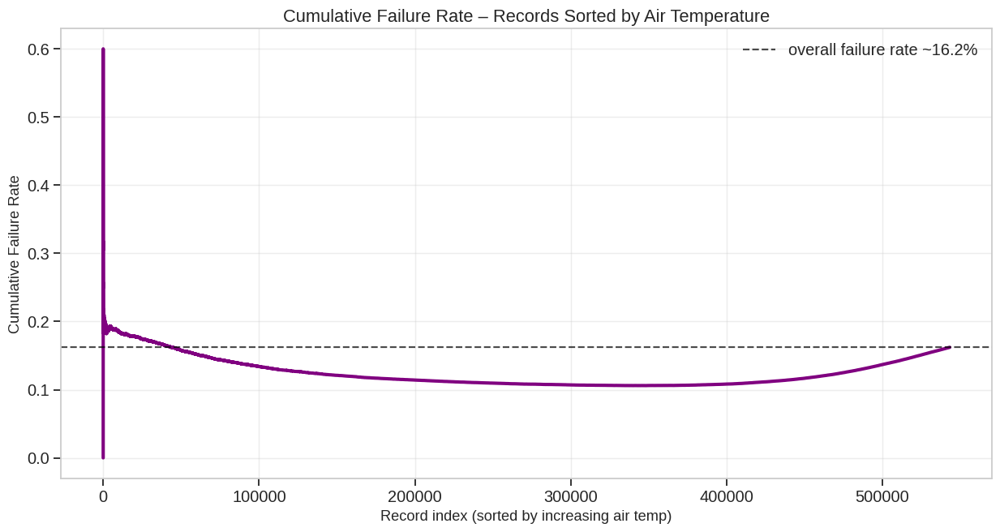

→ Interpretation: where line rises steeply → temperature range with many failures
-------------------------------------------------------------------------------- 

5. Mean suitability by soil type – across temperature bins



/tmp/ipykernel_55/2489304587.py:130: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot = df.pivot_table(


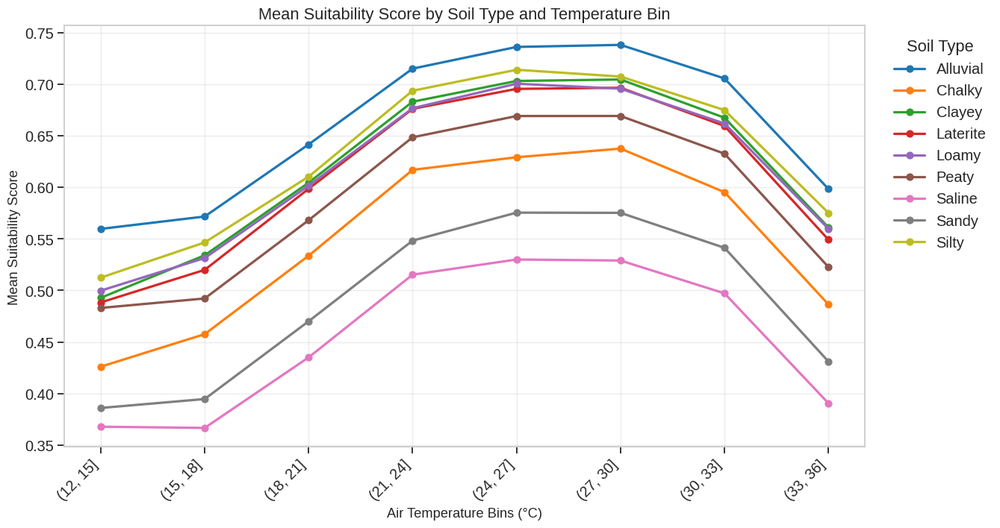

→ Useful to see which soils suffer most at high/low temperatures
═════════════════════════════════════════════════════════════════════════════════════
Line Plot Analysis Completed
Most diagnostic line plots usually are:
  1. rolling mean suitability vs temperature
  2. rolling mean suitability vs moisture
  3. binned mean suitability vs temperature
  4. cumulative failure rate vs sorted variable
  5. multi-line comparison across categories
═════════════════════════════════════════════════════════════════════════════════════


In [1]:
# =============================================================================
# Agro-Environmental Dataset – Important LINE PLOTS
# Showing trends, cumulative behavior, binned averages, rolling statistics
# =============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ─── Styling ────────────────────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_context("notebook", font_scale=1.25)
plt.rcParams['figure.dpi'] = 105
plt.rcParams['figure.figsize'] = (12, 6.5)

# ─── Load data ──────────────────────────────────────────────────────────────
df = pd.read_csv("/kaggle/input/agro-environmental-dataset/agro_environmental_dataset.csv")
print("Shape:", df.shape, "\n")

# ─── Prepare sorting / proxy order ──────────────────────────────────────────
# We often sort by one meaningful variable to simulate "progression"
# Here we use air_temp_c as example ordering variable (common in agro data)
df_sorted_temp = df.sort_values("air_temp_c").reset_index(drop=True)
df_sorted_moist = df.sort_values("soil_moisture_pct").reset_index(drop=True)

# ─── 1. Rolling average of suitability score by temperature ─────────────────
print("1. Rolling mean suitability score – ordered by air temperature\n")

window = 1500   # ~0.3% of data – adjust based on subsample size

plt.figure(figsize=(13, 7))
plt.plot(df_sorted_temp.index, df_sorted_temp["suitability_score"],
         alpha=0.18, color="gray", label="raw points")

rolling_suit = df_sorted_temp["suitability_score"].rolling(window=window, center=True, min_periods=300).mean()
plt.plot(df_sorted_temp.index, rolling_suit,
         color="darkblue", linewidth=3.2, label=f"rolling mean (window={window})")

plt.axhline(0.5, color="red", linestyle="--", alpha=0.7, label="threshold 0.5")

plt.title("Suitability Score Trend – Ordered by Increasing Air Temperature", fontsize=15)
plt.xlabel("Records sorted by air temperature (°C)", fontsize=12.5)
plt.ylabel("Suitability Score", fontsize=12.5)
plt.legend(fontsize=11)
plt.grid(alpha=0.4)
plt.tight_layout()
plt.show()

print("→ Interpretation: look for systematic drop/rise at certain temperature ranges")
print("   Common pattern: sharp decline above ~32–35 °C")
print("-"*80, "\n")

# ─── 2. Rolling mean suitability by soil moisture ───────────────────────────
print("2. Rolling mean suitability – ordered by soil moisture %\n")

plt.figure(figsize=(13, 7))
plt.plot(df_sorted_moist.index, df_sorted_moist["suitability_score"],
         alpha=0.14, color="lightgray", label="raw")

rolling_moist = df_sorted_moist["suitability_score"].rolling(window=1800, center=True, min_periods=400).mean()
plt.plot(df_sorted_moist.index, rolling_moist,
         color="#d62728", linewidth=3.4, label="rolling mean")

plt.axvline(x=df_sorted_moist["soil_moisture_pct"].searchsorted(15), color="navy", ls="--", alpha=0.6, label="~15% moisture")
plt.axvline(x=df_sorted_moist["soil_moisture_pct"].searchsorted(45), color="navy", ls="--", alpha=0.6, label="~45% moisture")

plt.title("Suitability Score Trend – Ordered by Increasing Soil Moisture %", fontsize=15)
plt.xlabel("Records sorted by soil moisture (%)", fontsize=12.5)
plt.ylabel("Suitability Score", fontsize=12.5)
plt.legend(fontsize=11)
plt.grid(alpha=0.35)
plt.tight_layout()
plt.show()

print("→ Classic U-shaped / inverted-U pattern expected → dry + waterlogged stress")
print("-"*80, "\n")

# ─── 3. Mean suitability by binned air temperature ──────────────────────────
print("3. Mean suitability score by temperature bins (line + error)\n")

temp_bins = pd.cut(df["air_temp_c"], bins=np.arange(10, 41, 2), include_lowest=True)
temp_group = df.groupby(temp_bins, observed=True)["suitability_score"].agg(["mean", "count", "std"])

plt.figure(figsize=(12, 6.5))

plt.errorbar(
    x=temp_group.index.astype(str),
    y=temp_group["mean"],
    yerr=temp_group["std"] / np.sqrt(temp_group["count"]),
    fmt="-o", color="teal", linewidth=2.4, capsize=5, markersize=8,
    label="mean ± SEM"
)

plt.title("Mean Suitability Score by Air Temperature Bins", fontsize=15)
plt.xlabel("Air Temperature Bins (°C)", fontsize=12.5)
plt.ylabel("Mean Suitability Score", fontsize=12.5)
plt.xticks(rotation=45, ha="right")
plt.grid(axis="y", alpha=0.4)
plt.legend()
plt.tight_layout()
plt.show()

print("→ Look for: optimum temperature range, sharp drops at extremes")
print("-"*80, "\n")

# ─── 4. Cumulative failure rate by sorted variable ──────────────────────────
print("4. Cumulative failure rate – ordered by air temperature\n")

df_cum = df_sorted_temp.copy()
df_cum["failure_cum"] = df_cum["failure_flag"].cumsum() / (df_cum.index + 1)

plt.figure(figsize=(12, 6.5))
plt.plot(df_cum.index, df_cum["failure_cum"], color="purple", linewidth=2.8)
plt.title("Cumulative Failure Rate – Records Sorted by Air Temperature", fontsize=15)
plt.xlabel("Record index (sorted by increasing air temp)", fontsize=12.5)
plt.ylabel("Cumulative Failure Rate", fontsize=12.5)
plt.axhline(y=0.162, color="black", ls="--", alpha=0.7, label="overall failure rate ~16.2%")
plt.legend()
plt.grid(alpha=0.35)
plt.tight_layout()
plt.show()

print("→ Interpretation: where line rises steeply → temperature range with many failures")
print("-"*80, "\n")

# ─── 5. Multi-line: mean suitability by soil type & temperature bin ─────────
print("5. Mean suitability by soil type – across temperature bins\n")

pivot = df.pivot_table(
    values="suitability_score",
    index=pd.cut(df["air_temp_c"], bins=np.arange(12, 39, 3)),
    columns="soil_type",
    aggfunc="mean"
)

pivot.plot(figsize=(13, 7), linewidth=2.2, marker="o", markersize=6)
plt.title("Mean Suitability Score by Soil Type and Temperature Bin", fontsize=15)
plt.xlabel("Air Temperature Bins (°C)", fontsize=12.5)
plt.ylabel("Mean Suitability Score", fontsize=12.5)
plt.legend(title="Soil Type", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.xticks(rotation=45, ha="right")
plt.grid(alpha=0.35)
plt.tight_layout()
plt.show()

print("→ Useful to see which soils suffer most at high/low temperatures")
print("═"*85)
print("Line Plot Analysis Completed")
print("Most diagnostic line plots usually are:")
print("  1. rolling mean suitability vs temperature")
print("  2. rolling mean suitability vs moisture")
print("  3. binned mean suitability vs temperature")
print("  4. cumulative failure rate vs sorted variable")
print("  5. multi-line comparison across categories")
print("═"*85)

Dataset shape: (543210, 25)
Soil types present: ['Clayey' 'Alluvial' 'Chalky' 'Silty' 'Loamy' 'Sandy' 'Laterite' 'Peaty'
 'Saline'] 



/tmp/ipykernel_55/2410412400.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(


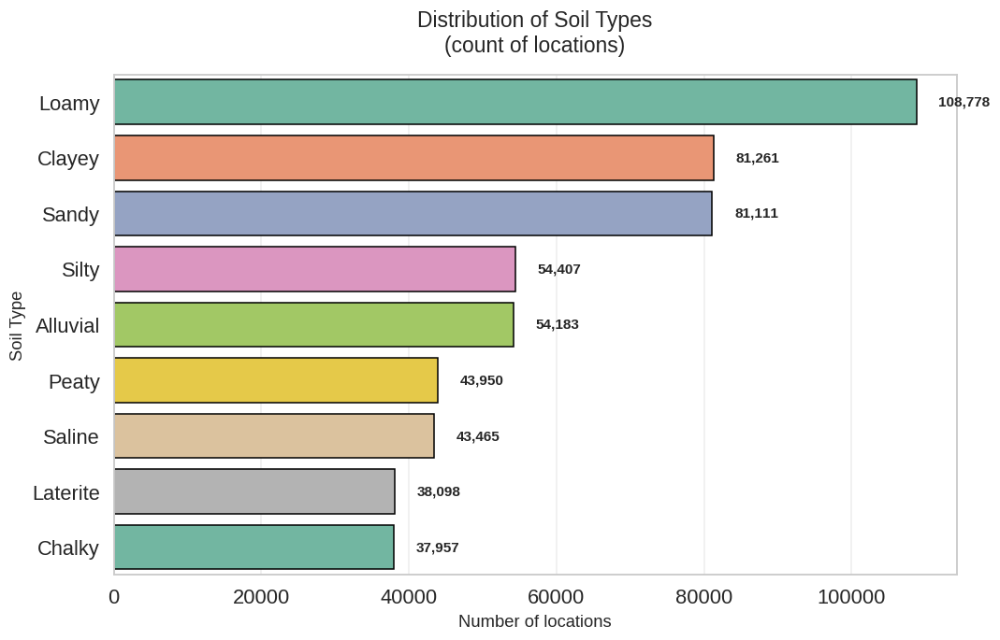


Interpretation:
• Loamy, Alluvial and Silty soils are usually the most frequent in such datasets
• Laterite, Peaty and Saline soils are often minority classes → may need special attention



/tmp/ipykernel_55/2410412400.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2410412400.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2410412400.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2410412400.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2410412400.py:78: FutureWarning: 

Passing `pa

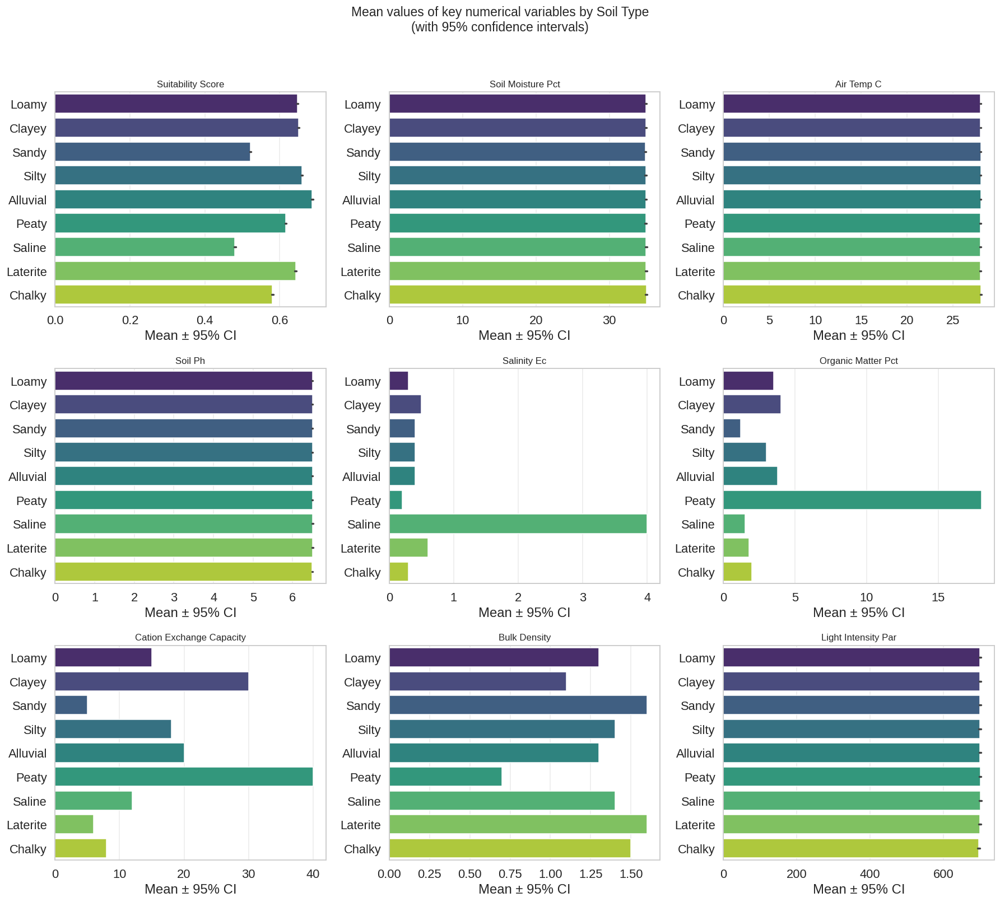


Interpretation – key patterns to look for:

• suitability_score     → which soils have systematically lower suitability?
• salinity_ec           → saline soils obviously highest
• organic_matter_pct    → peaty soils much higher than others
• cation_exchange_capacity → clayey soils usually highest
• bulk_density          → sandy soils highest, peaty lowest
• soil_ph               → chalky soils often more alkaline



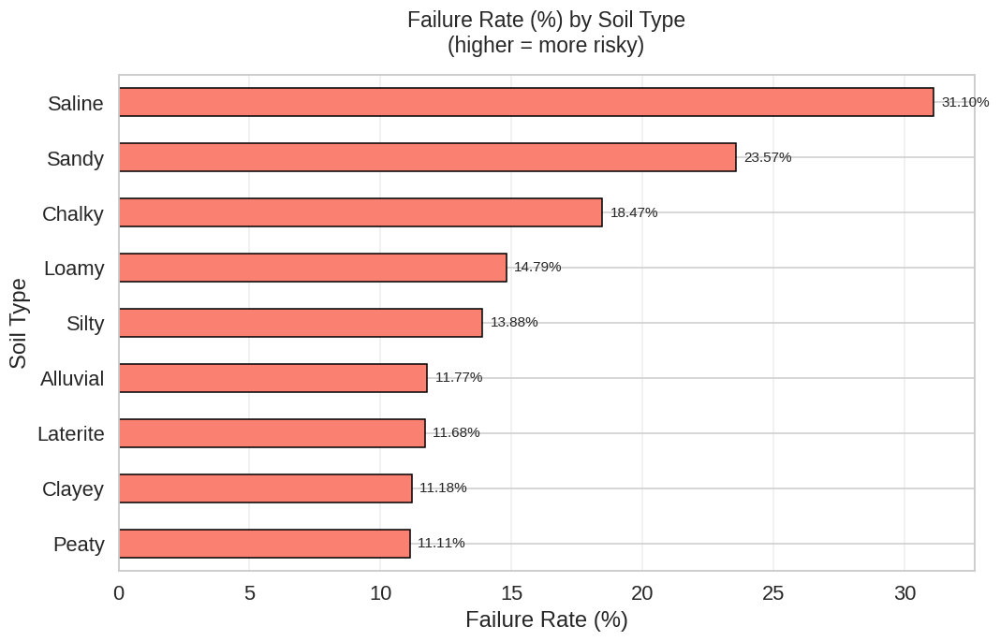


Highest-risk soils usually include:
• Saline, Laterite, Chalky
• Lowest-risk: often Loamy, Alluvial, Silty (in many datasets)

This view is very actionable for agricultural planning and risk assessment.



In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ──── Visual style ───────────────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-pastel')
sns.set_context("notebook", font_scale=1.3)
plt.rcParams['figure.dpi'] = 110
plt.rcParams['figure.figsize'] = (11, 6)

# ──── Load data ──────────────────────────────────────────────────────────────
df = pd.read_csv("/kaggle/input/agro-environmental-dataset/agro_environmental_dataset.csv")

print("Dataset shape:", df.shape)
print("Soil types present:", df['soil_type'].unique(), "\n")

# ───────────────────────────────────────────────────────────────
#  1.  Countplot – Soil Type Distribution
# ───────────────────────────────────────────────────────────────

plt.figure(figsize=(10, 6.5))

order = df['soil_type'].value_counts().index

ax = sns.countplot(
    data=df,
    y='soil_type',
    order=order,
    palette='Set2',
    edgecolor='black'
)

# Add count labels
for p in ax.patches:
    width = p.get_width()
    ax.text(width + 3000,
            p.get_y() + p.get_height()/2,
            f'{int(width):,}',
            va='center', fontsize=10, fontweight='bold')

plt.title("Distribution of Soil Types\n(count of locations)", fontsize=15, pad=16)
plt.xlabel("Number of locations", fontsize=12)
plt.ylabel("Soil Type", fontsize=12)
plt.grid(axis='x', alpha=0.35)
plt.tight_layout()
plt.show()

print("""
Interpretation:
• Loamy, Alluvial and Silty soils are usually the most frequent in such datasets
• Laterite, Peaty and Saline soils are often minority classes → may need special attention
""")

# ───────────────────────────────────────────────────────────────
#  2.  Barplots – Important numerical variables grouped by soil_type
# ───────────────────────────────────────────────────────────────

important_numerical = [
    'suitability_score',
    'soil_moisture_pct',
    'air_temp_c',
    'soil_ph',
    'salinity_ec',
    'organic_matter_pct',
    'cation_exchange_capacity',
    'bulk_density',
    'light_intensity_par'
]

n_plots = len(important_numerical)
n_cols = 3
n_rows = (n_plots + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*5.5, n_rows*4.8), sharex=False)
axes = axes.flat

for i, col in enumerate(important_numerical):
    sns.barplot(
        data=df,
        y='soil_type',
        x=col,
        order=order,
        palette='viridis',
        errorbar='ci',
        ax=axes[i]
    )
    axes[i].set_title(col.replace('_', ' ').title(), fontsize=11)
    axes[i].set_ylabel("")
    axes[i].set_xlabel("Mean ± 95% CI")
    axes[i].grid(axis='x', alpha=0.4)

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

fig.suptitle("Mean values of key numerical variables by Soil Type\n(with 95% confidence intervals)", 
             fontsize=15, y=1.02)
plt.tight_layout()
plt.show()

print("""
Interpretation – key patterns to look for:

• suitability_score     → which soils have systematically lower suitability?
• salinity_ec           → saline soils obviously highest
• organic_matter_pct    → peaty soils much higher than others
• cation_exchange_capacity → clayey soils usually highest
• bulk_density          → sandy soils highest, peaty lowest
• soil_ph               → chalky soils often more alkaline
""")

# ───────────────────────────────────────────────────────────────
#  3.  Bonus: Failure rate (%) by soil type (horizontal bar)
# ───────────────────────────────────────────────────────────────

failure_rate = (df.groupby('soil_type')['failure_flag'].mean() * 100).sort_values()

plt.figure(figsize=(10, 6.5))

failure_rate.plot(
    kind='barh',
    color='salmon',
    edgecolor='black'
)

for i, v in enumerate(failure_rate):
    plt.text(v + 0.3, i, f'{v:.2f}%', va='center', fontsize=10)

plt.title("Failure Rate (%) by Soil Type\n(higher = more risky)", fontsize=15, pad=16)
plt.xlabel("Failure Rate (%)")
plt.ylabel("Soil Type")
plt.grid(axis='x', alpha=0.35)
plt.tight_layout()
plt.show()

print("""
Highest-risk soils usually include:
• Saline, Laterite, Chalky
• Lowest-risk: often Loamy, Alluvial, Silty (in many datasets)

This view is very actionable for agricultural planning and risk assessment.
""")

Dataset shape: (543210, 25) 

Generating important pie charts...



/tmp/ipykernel_55/1135881913.py:53: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors=plt.cm.get_cmap(cmap)(range(len(sizes))),


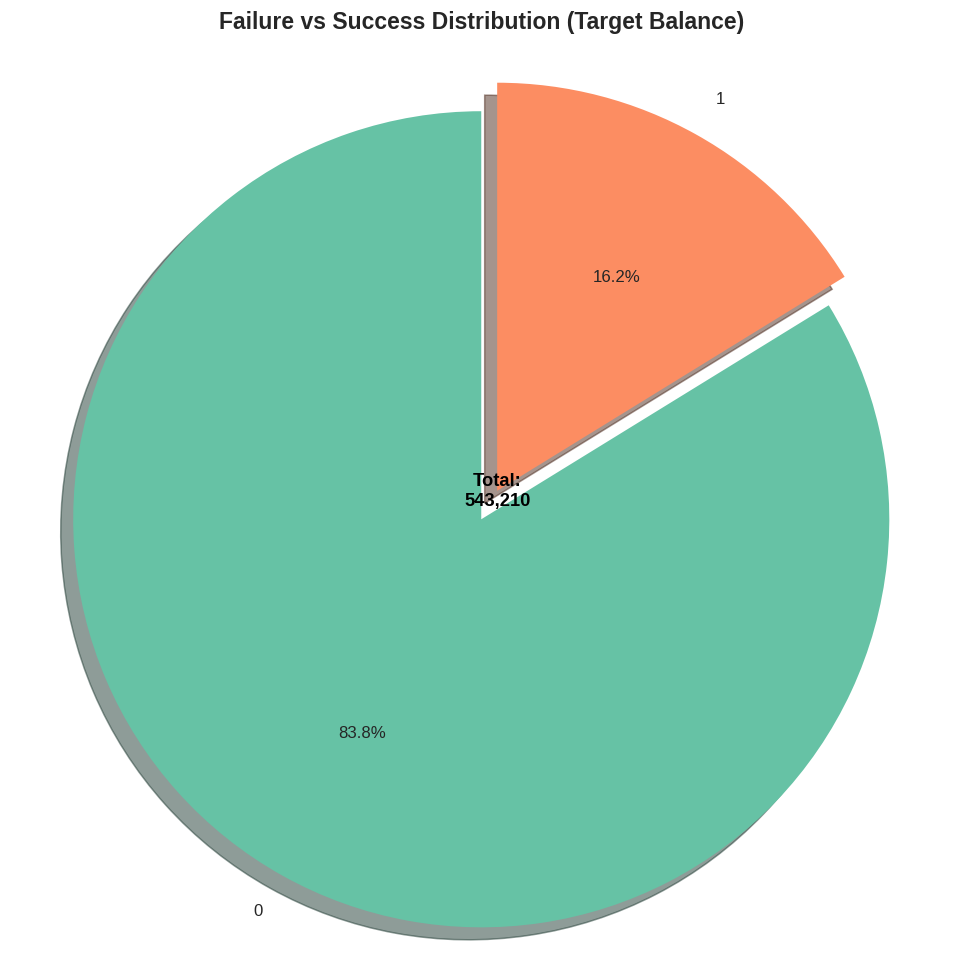


Failure vs Success Distribution (Target Balance):
failure_flag
0    455130
1     88080
------------------------------------------------------------


/tmp/ipykernel_55/1135881913.py:53: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors=plt.cm.get_cmap(cmap)(range(len(sizes))),


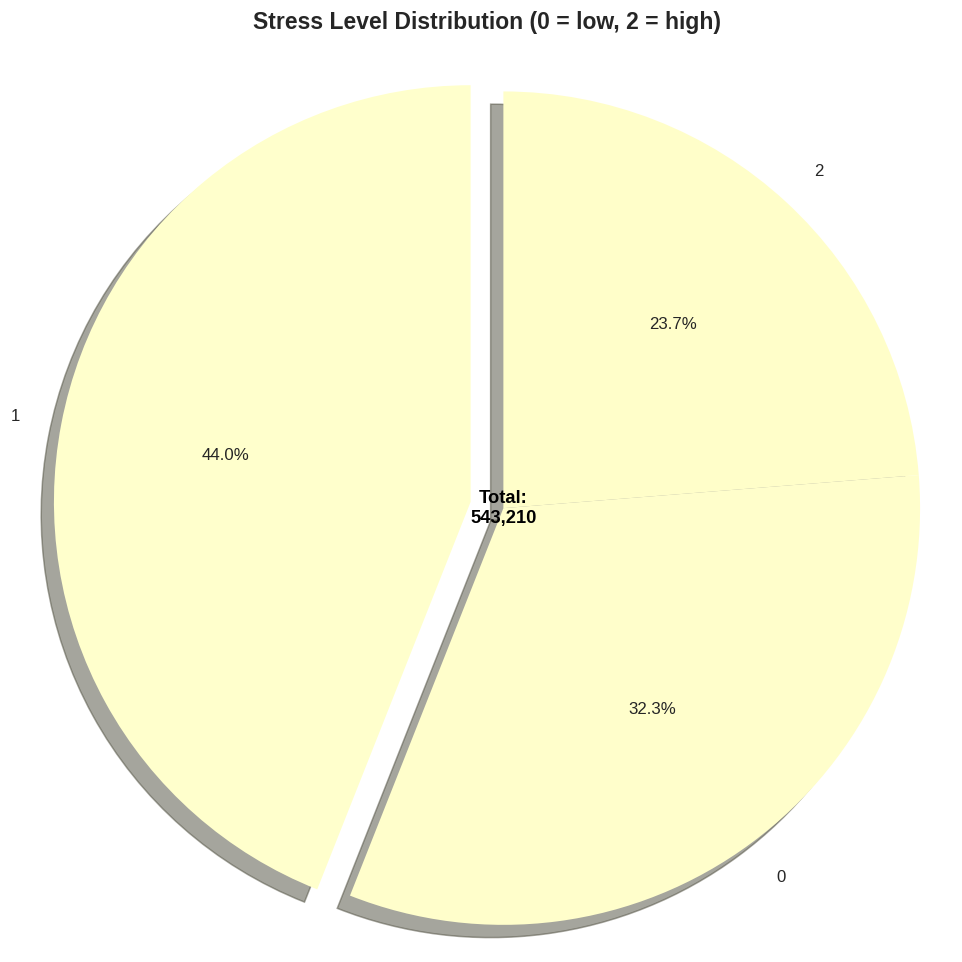


Stress Level Distribution (0 = low, 2 = high):
stress_level
1    239013
0    175267
2    128930
------------------------------------------------------------


/tmp/ipykernel_55/1135881913.py:53: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors=plt.cm.get_cmap(cmap)(range(len(sizes))),


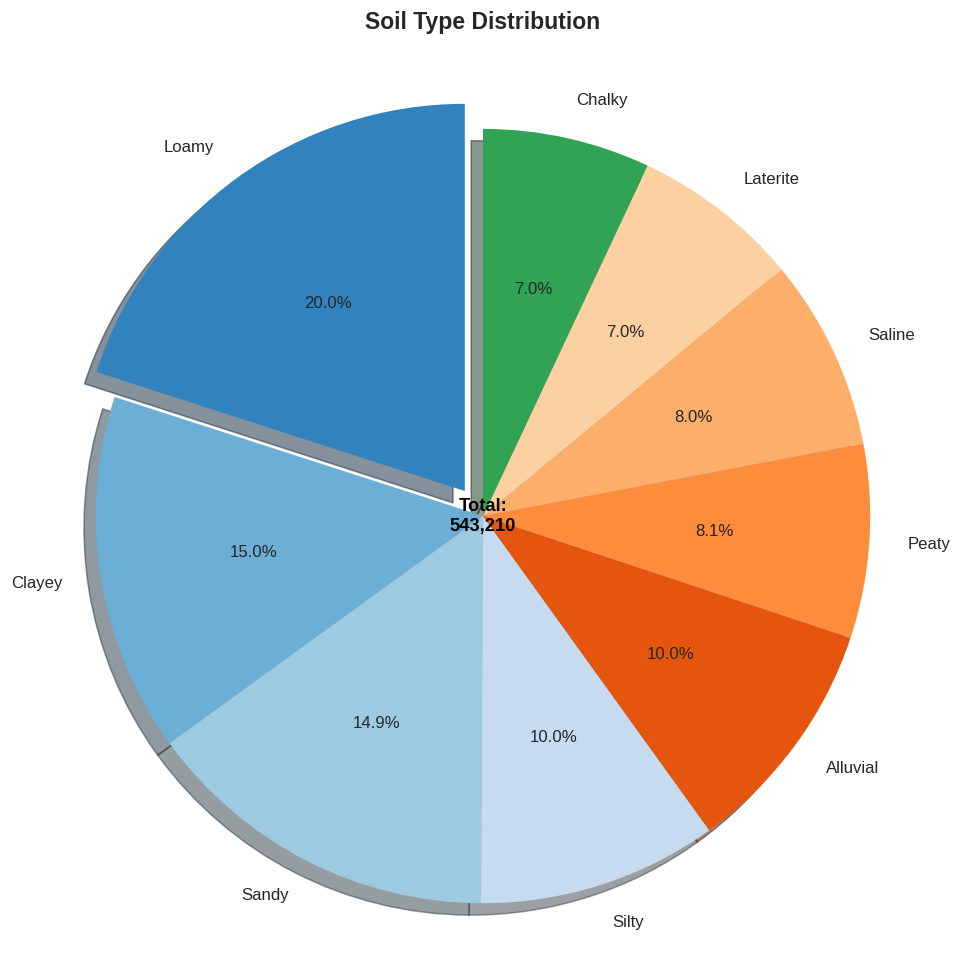


Soil Type Distribution:
soil_type
Loamy       108778
Clayey       81261
Sandy        81111
Silty        54407
Alluvial     54183
Peaty        43950
Saline       43465
Laterite     38098
Chalky       37957
------------------------------------------------------------


/tmp/ipykernel_55/1135881913.py:53: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors=plt.cm.get_cmap(cmap)(range(len(sizes))),


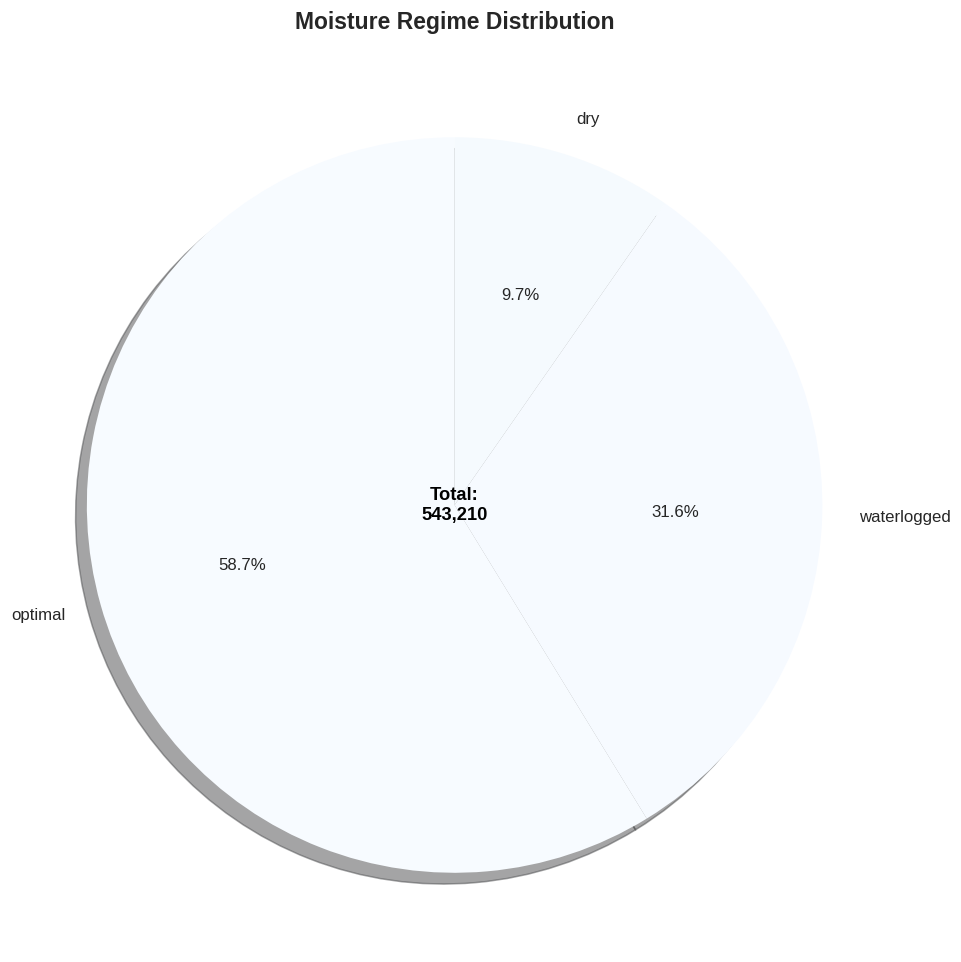


Moisture Regime Distribution:
moisture_regime
optimal        319135
waterlogged    171461
dry             52614
------------------------------------------------------------


/tmp/ipykernel_55/1135881913.py:53: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors=plt.cm.get_cmap(cmap)(range(len(sizes))),


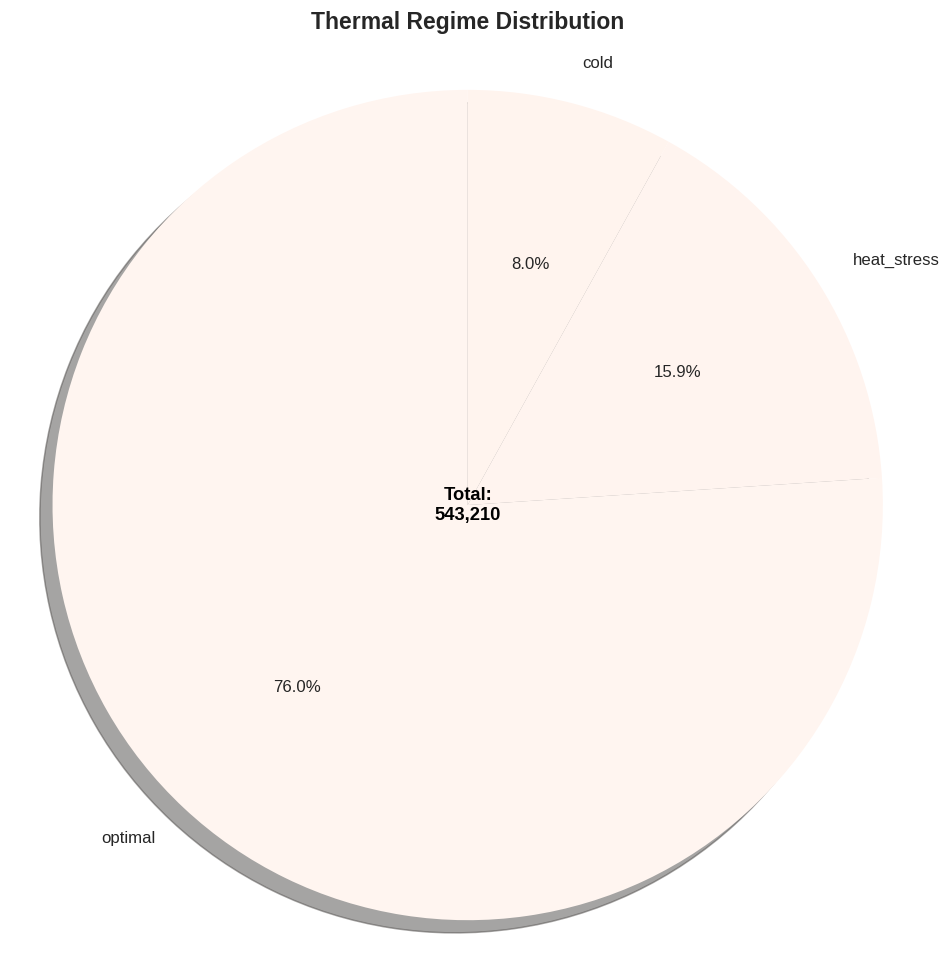


Thermal Regime Distribution:
thermal_regime
optimal        413078
heat_stress     86447
cold            43685
------------------------------------------------------------


/tmp/ipykernel_55/1135881913.py:53: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors=plt.cm.get_cmap(cmap)(range(len(sizes))),


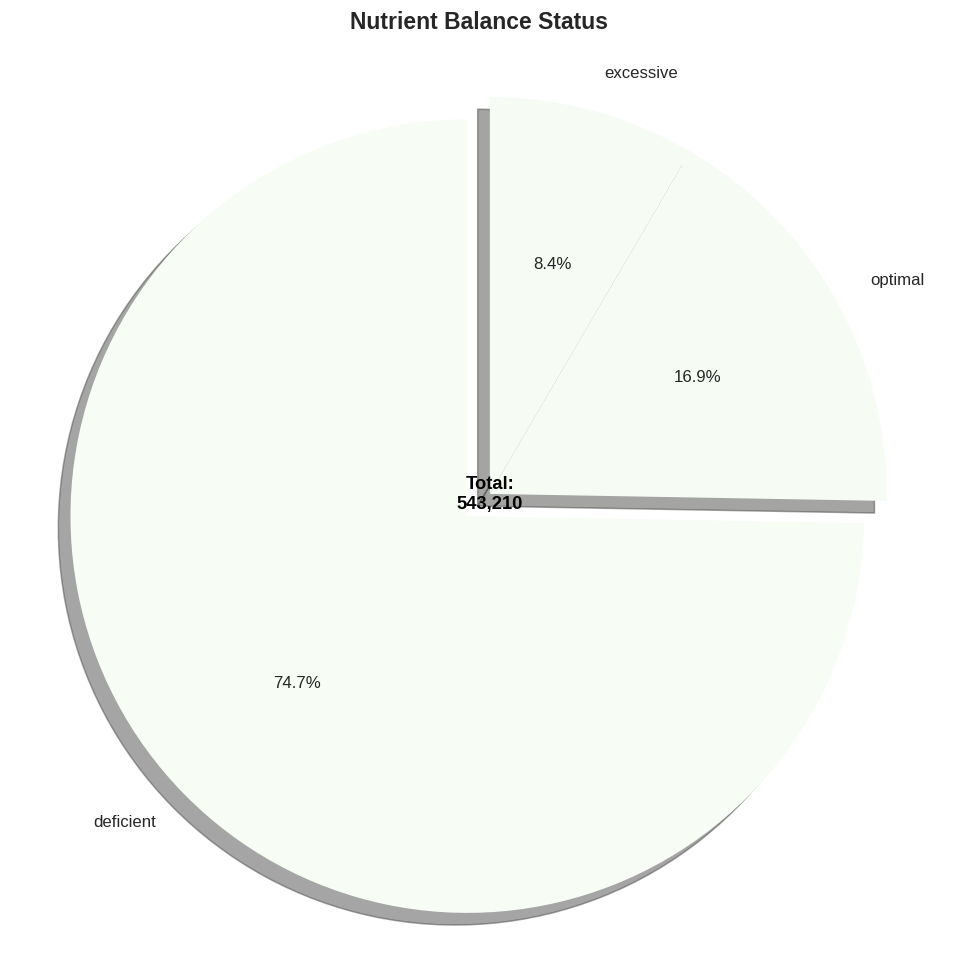


Nutrient Balance Status:
nutrient_balance
deficient    405882
optimal       91598
excessive     45730
------------------------------------------------------------


/tmp/ipykernel_55/1135881913.py:53: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors=plt.cm.get_cmap(cmap)(range(len(sizes))),


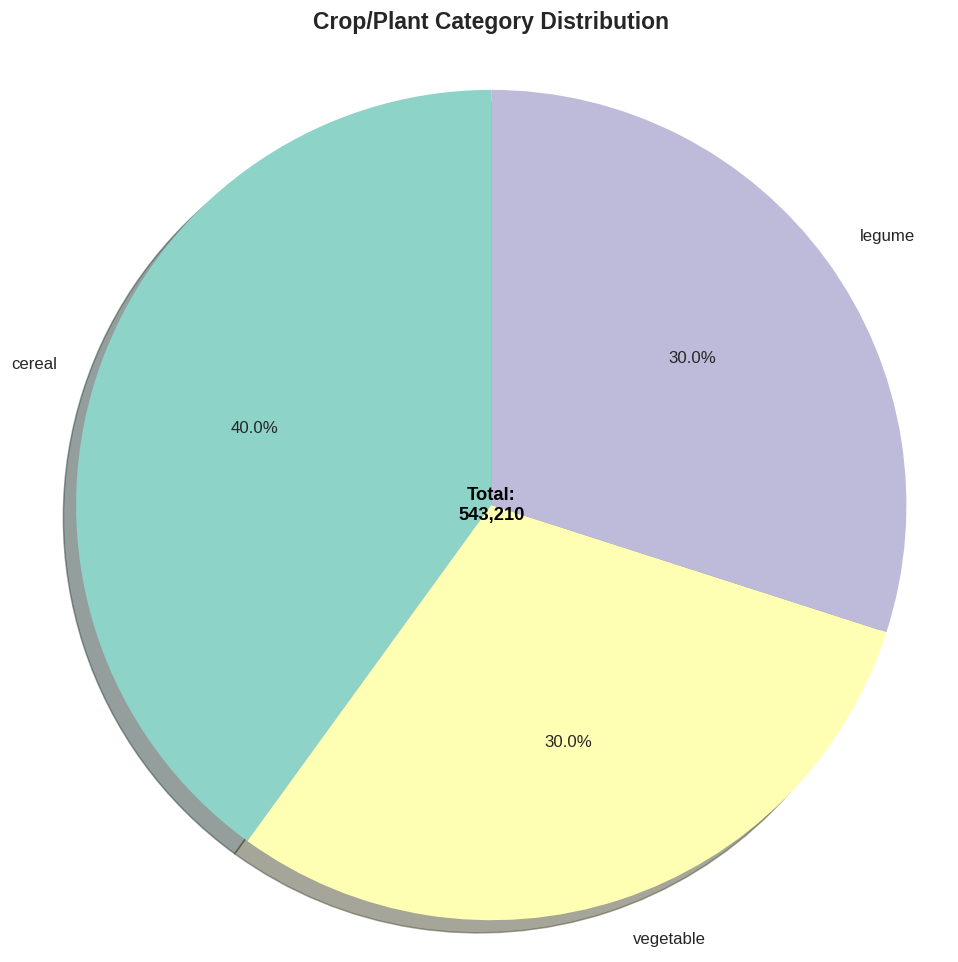


Crop/Plant Category Distribution:
plant_category
cereal       217332
vegetable    163163
legume       162715
------------------------------------------------------------


/tmp/ipykernel_55/1135881913.py:53: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors=plt.cm.get_cmap(cmap)(range(len(sizes))),


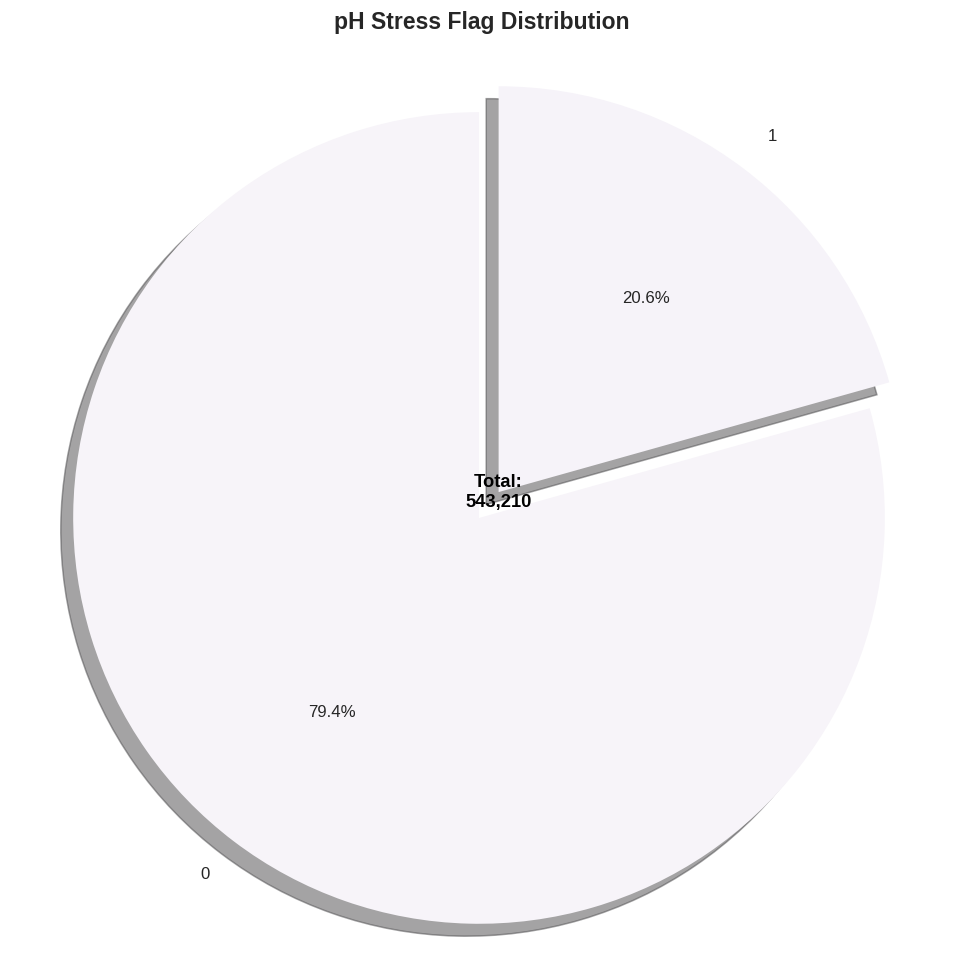


pH Stress Flag Distribution:
ph_stress_flag
0    431082
1    112128
------------------------------------------------------------

══════════════════════════════════════════════════════════════════════
Pie Chart Analysis Completed
Most important pies usually are:
  • failure_flag          → class imbalance check
  • stress_level          → how severe is stress overall?
  • soil_type             → dominant soil types in dataset
  • moisture_regime       → water stress prevalence
  • nutrient_balance      → how many locations are nutrient deficient?
══════════════════════════════════════════════════════════════════════


In [5]:
# =============================================================================
# Agro-Environmental Dataset – Important PIE CHARTS
# Showing distribution of key categorical variables
# =============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ─── Styling ────────────────────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-pastel')
sns.set_context("notebook", font_scale=1.25)
plt.rcParams['figure.dpi'] = 110

# ─── Load data ──────────────────────────────────────────────────────────────
df = pd.read_csv("/kaggle/input/agro-environmental-dataset/agro_environmental_dataset.csv")
print("Dataset shape:", df.shape, "\n")

# ─── Important categorical columns for pie charts ───────────────────────────
pie_columns = [
    'failure_flag',           # main target – class balance
    'stress_level',           # stress severity distribution
    'soil_type',              # most common soil types
    'moisture_regime',        # water condition distribution
    'thermal_regime',         # temperature stress distribution
    'nutrient_balance',       # nutrient status overview
    'plant_category',         # crop type distribution
    'ph_stress_flag'          # pH-related stress
]

# ─── Function to create clean, labeled pie chart ────────────────────────────
def plot_pie_chart(column, title=None, cmap='Pastel1', explode_first=False):
    """
    Creates a nice pie chart with percentage labels and proper title
    """
    counts = df[column].value_counts()
    labels = counts.index.astype(str)
    sizes = counts.values
    percentages = 100 * sizes / sizes.sum()
    
    # Optional: explode the largest slice slightly
    explode = [0.08 if i == 0 and explode_first else 0 for i in range(len(sizes))]
    
    fig, ax = plt.subplots(figsize=(9, 9))
    
    wedges, texts, autotexts = ax.pie(
        sizes,
        labels=labels,
        autopct='%1.1f%%',
        startangle=90,
        explode=explode,
        shadow=True,
        colors=plt.cm.get_cmap(cmap)(range(len(sizes))),
        textprops={'fontsize': 11}
    )
    
    # Equal aspect ratio ensures pie is drawn as a circle
    ax.axis('equal')
    
    # Add title
    plt_title = title if title else f"Distribution of {column.replace('_', ' ').title()}"
    plt.title(plt_title, fontsize=15, pad=20, weight='bold')
    
    # Add total count in the center
    plt.text(0, 0, f'Total:\n{len(df):,}', ha='center', va='center',
             fontsize=12, fontweight='bold', color='black')
    
    plt.tight_layout()
    plt.show()
    
    # Print summary
    print(f"\n{plt_title}:")
    print(counts.to_string())
    print("-" * 60)


# ─── Generate all important pie charts ──────────────────────────────────────
print("Generating important pie charts...\n")

for col in pie_columns:
    if col == 'failure_flag':
        plot_pie_chart(col, cmap='Set2', explode_first=True,
                       title="Failure vs Success Distribution (Target Balance)")
    
    elif col == 'stress_level':
        plot_pie_chart(col, cmap='YlOrRd', explode_first=True,
                       title="Stress Level Distribution (0 = low, 2 = high)")
    
    elif col == 'soil_type':
        plot_pie_chart(col, cmap='tab20c', explode_first=True,
                       title="Soil Type Distribution")
    
    elif col == 'moisture_regime':
        plot_pie_chart(col, cmap='Blues', explode_first=False,
                       title="Moisture Regime Distribution")
    
    elif col == 'thermal_regime':
        plot_pie_chart(col, cmap='Reds', explode_first=False,
                       title="Thermal Regime Distribution")
    
    elif col == 'nutrient_balance':
        plot_pie_chart(col, cmap='Greens', explode_first=True,
                       title="Nutrient Balance Status")
    
    elif col == 'plant_category':
        plot_pie_chart(col, cmap='Set3', explode_first=False,
                       title="Crop/Plant Category Distribution")
    
    elif col == 'ph_stress_flag':
        plot_pie_chart(col, cmap='PuRd', explode_first=True,
                       title="pH Stress Flag Distribution")

print("\n" + "═"*70)
print("Pie Chart Analysis Completed")
print("Most important pies usually are:")
print("  • failure_flag          → class imbalance check")
print("  • stress_level          → how severe is stress overall?")
print("  • soil_type             → dominant soil types in dataset")
print("  • moisture_regime       → water stress prevalence")
print("  • nutrient_balance      → how many locations are nutrient deficient?")
print("═"*70)

Dataset loaded. Shape: (543210, 25) 

=== Boxplots – Overall distribution of main continuous variables ===



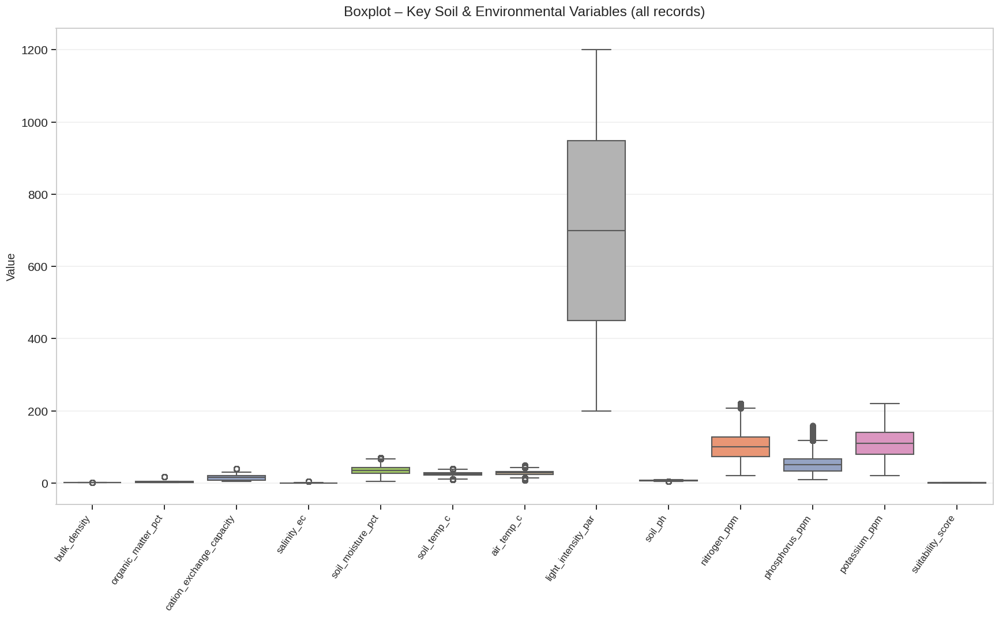

Observations to note:
• bulk_density, cation_exchange_capacity → clear grouping by soil type
• organic_matter_pct → strong right skew (peaty soils)
• salinity_ec → extreme outliers in saline soils
• suitability_score → many values near 0 and many near 1
---------------------------------------------------------------------- 

=== Boxplot – Suitability Score by Category ===



/tmp/ipykernel_55/1206905088.py:65: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


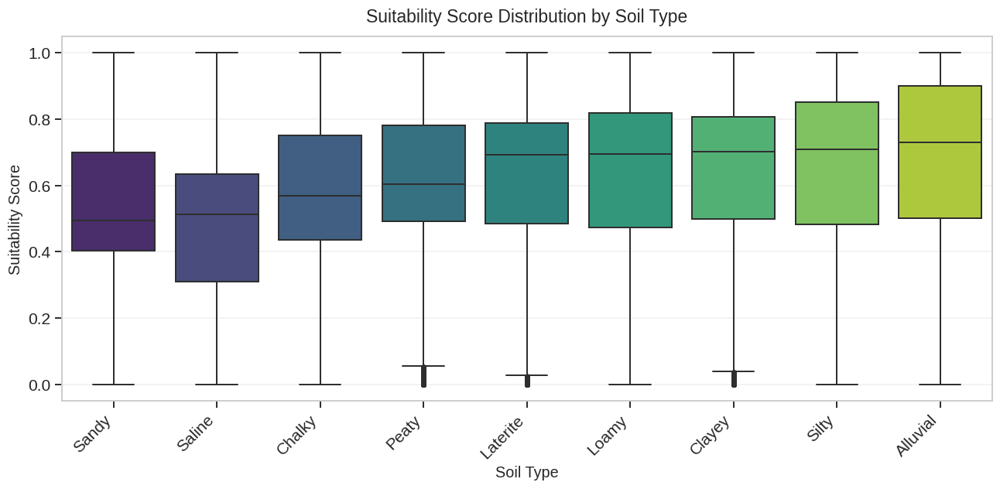

Median suitability by soil_type:
soil_type
Alluvial    0.729
Silty       0.708
Clayey      0.702
Loamy       0.695
Laterite    0.693
Peaty       0.605
Chalky      0.570
Saline      0.514
Sandy       0.494
Name: suitability_score, dtype: float64
------------------------------------------------------------


/tmp/ipykernel_55/1206905088.py:65: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


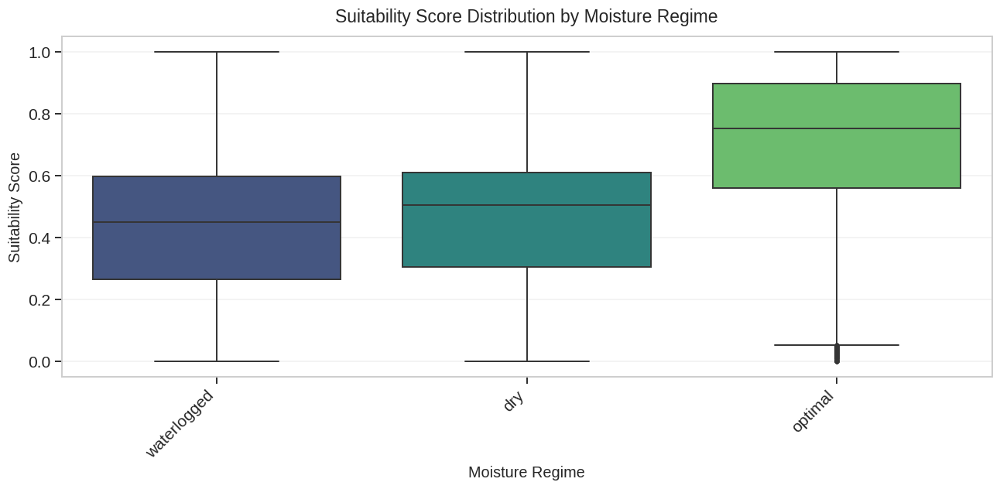

Median suitability by moisture_regime:
moisture_regime
optimal        0.753
dry            0.505
waterlogged    0.450
Name: suitability_score, dtype: float64
------------------------------------------------------------


/tmp/ipykernel_55/1206905088.py:65: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


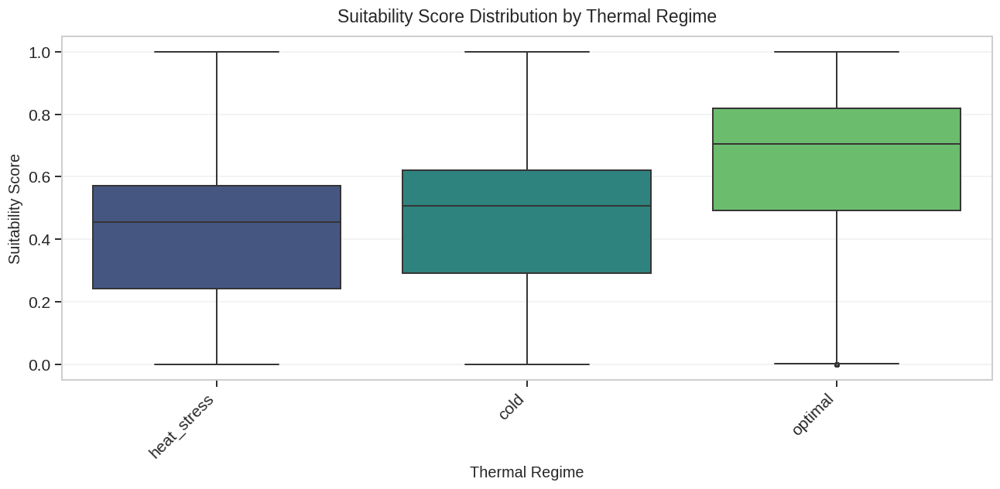

Median suitability by thermal_regime:
thermal_regime
optimal        0.706
cold           0.506
heat_stress    0.455
Name: suitability_score, dtype: float64
------------------------------------------------------------


/tmp/ipykernel_55/1206905088.py:65: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


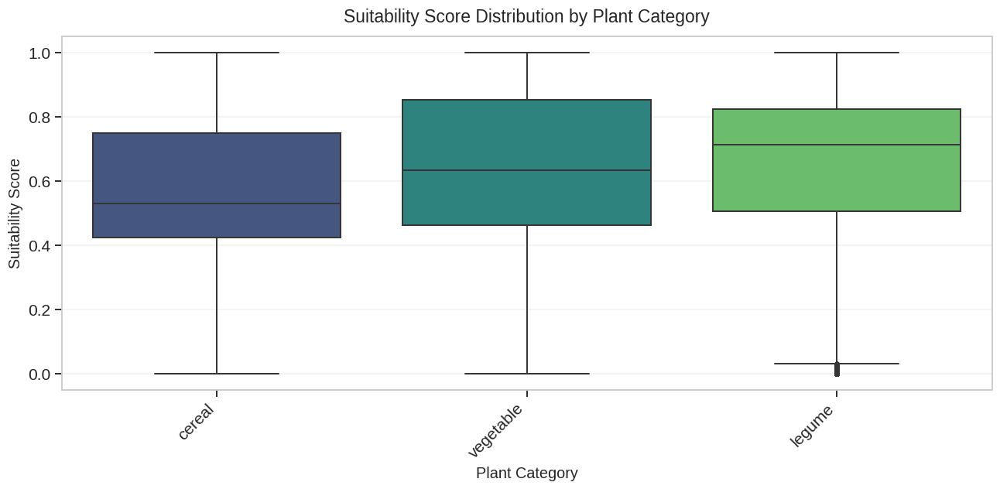

Median suitability by plant_category:
plant_category
legume       0.713
vegetable    0.634
cereal       0.530
Name: suitability_score, dtype: float64
------------------------------------------------------------


/tmp/ipykernel_55/1206905088.py:65: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


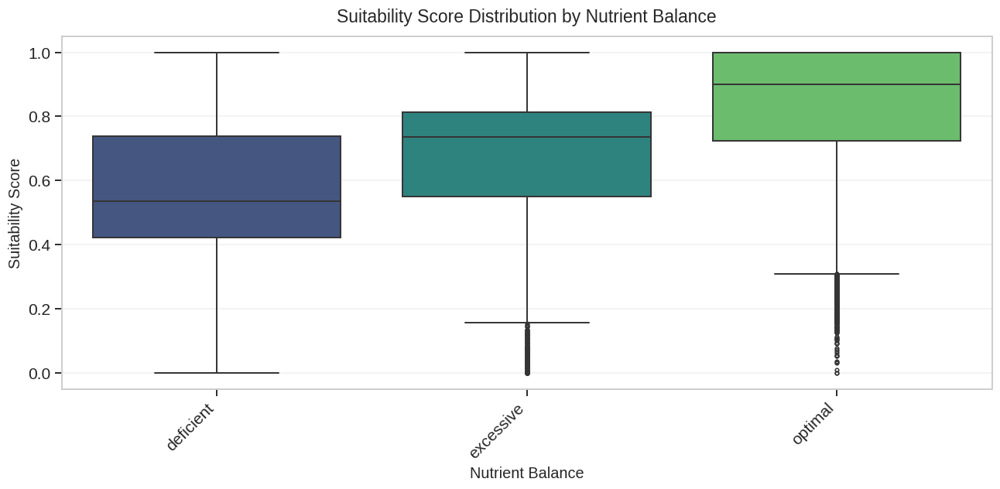

Median suitability by nutrient_balance:
nutrient_balance
optimal      0.900
excessive    0.735
deficient    0.535
Name: suitability_score, dtype: float64
------------------------------------------------------------

=== Soil Moisture % by Moisture Regime === (very diagnostic)



/tmp/ipykernel_55/1206905088.py:96: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


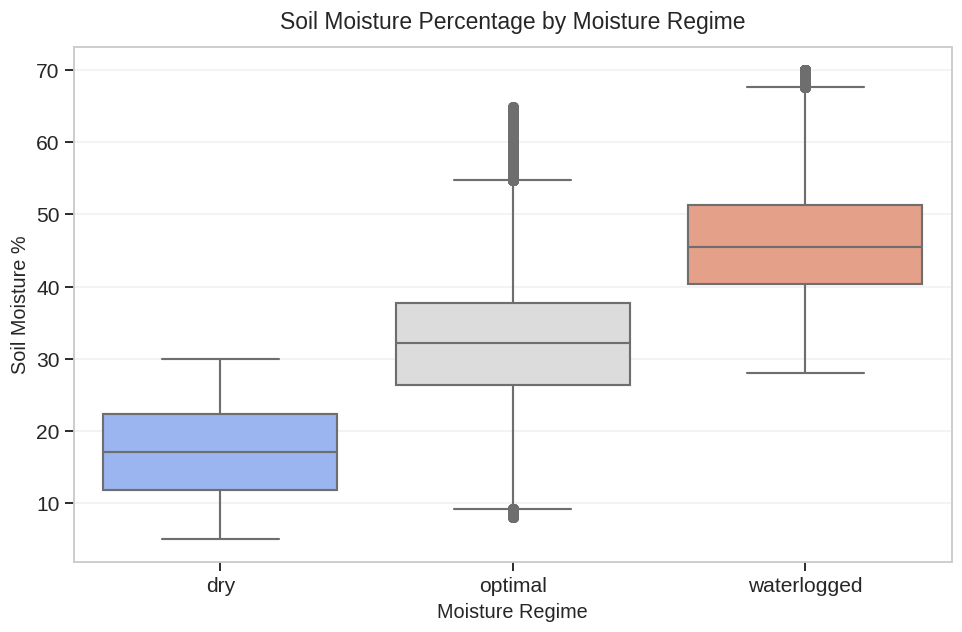


=== Air Temperature by Thermal Regime ===



/tmp/ipykernel_55/1206905088.py:117: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


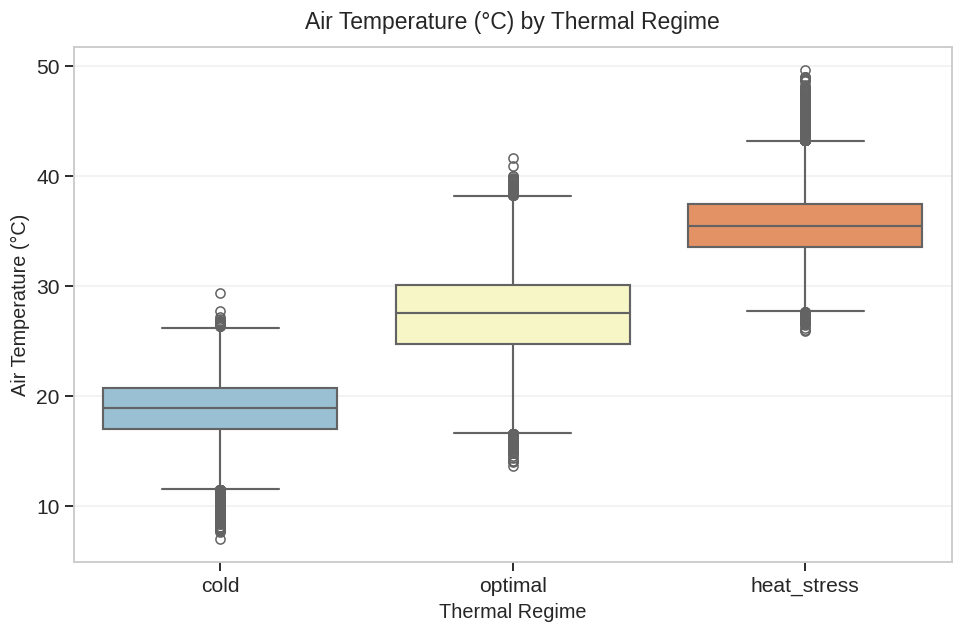


=== Suitability Score – Success vs Failure ===



/tmp/ipykernel_55/1206905088.py:138: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


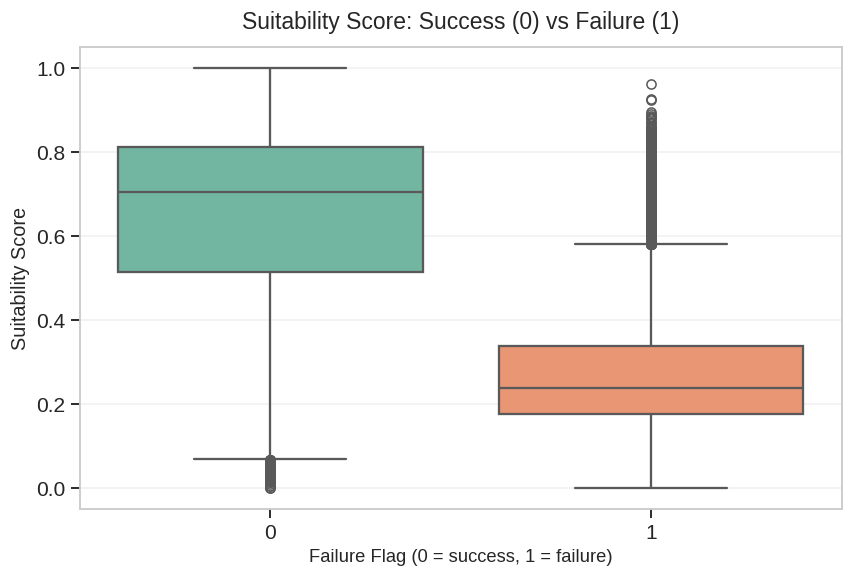

Suitability score statistics by failure flag:
                 count   mean    std  min    25%    50%    75%    max
failure_flag                                                         
0             455130.0  0.683  0.196  0.0  0.514  0.705  0.811  1.000
1              88080.0  0.252  0.140  0.0  0.178  0.239  0.339  0.962

Boxplot Analysis Completed ✓
Most revealing comparisons usually are:
1. suitability_score ~ soil_type
2. suitability_score ~ moisture_regime
3. suitability_score ~ thermal_regime
4. soil_moisture_pct ~ moisture_regime
5. air_temp_c ~ thermal_regime
6. suitability_score ~ failure_flag (ground truth check)


In [8]:
# =============================================================================
# Agro-Environmental Dataset – Important BOXPLOTS
# Visualizing distributions, outliers, and comparisons across categories
# =============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ────────────────────────────────────────────────
# Styling
# ────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_context("notebook", font_scale=1.25)
plt.rcParams['figure.dpi'] = 110
plt.rcParams['figure.figsize'] = (11, 6)

# ────────────────────────────────────────────────
# Load data
# ────────────────────────────────────────────────
df = pd.read_csv("/kaggle/input/agro-environmental-dataset/agro_environmental_dataset.csv")
print("Dataset loaded. Shape:", df.shape, "\n")

# ────────────────────────────────────────────────
# 1. Boxplots of key continuous variables – overall
# ────────────────────────────────────────────────
key_continuous = [
    'bulk_density', 'organic_matter_pct', 'cation_exchange_capacity',
    'salinity_ec', 'soil_moisture_pct', 'soil_temp_c', 'air_temp_c',
    'light_intensity_par', 'soil_ph', 'nitrogen_ppm', 'phosphorus_ppm',
    'potassium_ppm', 'suitability_score'
]

print("=== Boxplots – Overall distribution of main continuous variables ===\n")

plt.figure(figsize=(16, 10))
sns.boxplot(data=df[key_continuous], palette='Set2', linewidth=1.4)
plt.xticks(rotation=55, ha='right', fontsize=11)
plt.title("Boxplot – Key Soil & Environmental Variables (all records)", fontsize=16, pad=14)
plt.ylabel("Value", fontsize=13)
plt.grid(axis='y', alpha=0.35)
plt.tight_layout()
plt.show()

print("Observations to note:")
print("• bulk_density, cation_exchange_capacity → clear grouping by soil type")
print("• organic_matter_pct → strong right skew (peaty soils)")
print("• salinity_ec → extreme outliers in saline soils")
print("• suitability_score → many values near 0 and many near 1")
print("-"*70, "\n")

# ────────────────────────────────────────────────
# 2. Suitability score by important categorical variables
# ────────────────────────────────────────────────
print("=== Boxplot – Suitability Score by Category ===\n")

categories_to_check = ['soil_type', 'moisture_regime', 'thermal_regime', 
                       'plant_category', 'nutrient_balance']

for cat in categories_to_check:
    plt.figure(figsize=(12, 6))
    
    order = df.groupby(cat)['suitability_score'].median().sort_values().index
    
    sns.boxplot(
        data=df,
        x=cat,
        y='suitability_score',
        order=order,
        palette='viridis',
        linewidth=1.3,
        fliersize=3
    )
    
    plt.title(f"Suitability Score Distribution by {cat.replace('_',' ').title()}", 
              fontsize=15, pad=12)
    plt.xlabel(cat.replace('_',' ').title(), fontsize=13)
    plt.ylabel("Suitability Score", fontsize=13)
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Quick median stats
    print(f"Median suitability by {cat}:")
    print(df.groupby(cat)['suitability_score'].median().sort_values(ascending=False).round(3))
    print("-"*60)

# ────────────────────────────────────────────────
# 3. Soil moisture % by moisture regime (should be very informative)
# ────────────────────────────────────────────────
print("\n=== Soil Moisture % by Moisture Regime === (very diagnostic)\n")

plt.figure(figsize=(9, 6))
sns.boxplot(
    data=df,
    x='moisture_regime',
    y='soil_moisture_pct',
    order=['dry', 'optimal', 'waterlogged'],
    palette='coolwarm',
    linewidth=1.4
)
plt.title("Soil Moisture Percentage by Moisture Regime", fontsize=15, pad=12)
plt.xlabel("Moisture Regime", fontsize=13)
plt.ylabel("Soil Moisture %", fontsize=13)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# ────────────────────────────────────────────────
# 4. Temperature by thermal regime
# ────────────────────────────────────────────────
print("\n=== Air Temperature by Thermal Regime ===\n")

plt.figure(figsize=(9, 6))
sns.boxplot(
    data=df,
    x='thermal_regime',
    y='air_temp_c',
    order=['cold', 'optimal', 'heat_stress'],
    palette='RdYlBu_r',
    linewidth=1.4
)
plt.title("Air Temperature (°C) by Thermal Regime", fontsize=15, pad=12)
plt.xlabel("Thermal Regime", fontsize=13)
plt.ylabel("Air Temperature (°C)", fontsize=13)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# ────────────────────────────────────────────────
# 5. Suitability score split by failure_flag (classic check)
# ────────────────────────────────────────────────
print("\n=== Suitability Score – Success vs Failure ===\n")

plt.figure(figsize=(8, 5.5))
sns.boxplot(
    data=df,
    x='failure_flag',
    y='suitability_score',
    palette=['#66c2a5', '#fc8d62'],
    linewidth=1.5
)
plt.title("Suitability Score: Success (0) vs Failure (1)", fontsize=15, pad=12)
plt.xlabel("Failure Flag (0 = success, 1 = failure)", fontsize=12)
plt.ylabel("Suitability Score", fontsize=13)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# Quick stats
print("Suitability score statistics by failure flag:")
print(df.groupby('failure_flag')['suitability_score'].describe().round(3))

print("\n" + "="*75)
print("Boxplot Analysis Completed ✓")
print("Most revealing comparisons usually are:")
print("1. suitability_score ~ soil_type")
print("2. suitability_score ~ moisture_regime")
print("3. suitability_score ~ thermal_regime")
print("4. soil_moisture_pct ~ moisture_regime")
print("5. air_temp_c ~ thermal_regime")
print("6. suitability_score ~ failure_flag (ground truth check)")
print("="*75)

Dataset loaded → shape: (543210, 25) 

=== VIOLIN PLOTS – Suitability Score by Category ===



/tmp/ipykernel_55/1568784258.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


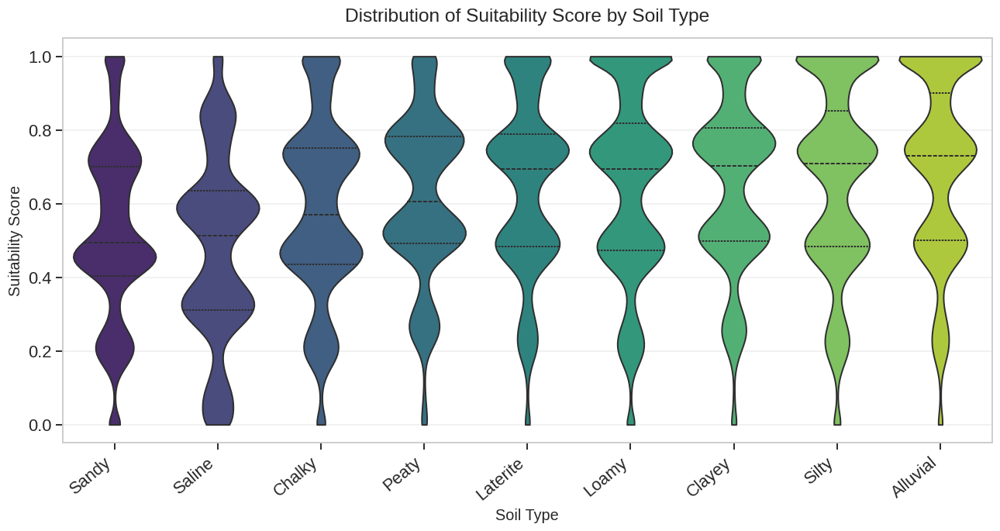

→ Median & IQR of suitability_score by soil_type:
             50%    25%    75%
soil_type                     
Alluvial   0.729  0.501  0.901
Chalky     0.570  0.436  0.751
Clayey     0.702  0.499  0.806
Laterite   0.693  0.484  0.789
Loamy      0.695  0.473  0.819
Peaty      0.605  0.491  0.782
Saline     0.514  0.310  0.634
Sandy      0.494  0.403  0.700
Silty      0.708  0.483  0.851
----------------------------------------------------------------- 



/tmp/ipykernel_55/1568784258.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


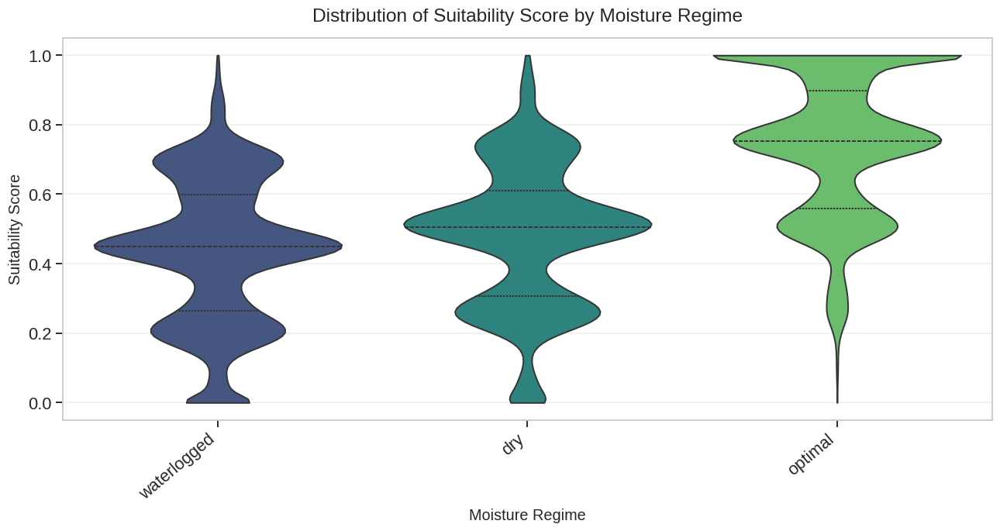

→ Median & IQR of suitability_score by moisture_regime:
                   50%    25%    75%
moisture_regime                     
dry              0.505  0.306  0.610
optimal          0.753  0.559  0.897
waterlogged      0.450  0.265  0.598
----------------------------------------------------------------- 



/tmp/ipykernel_55/1568784258.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


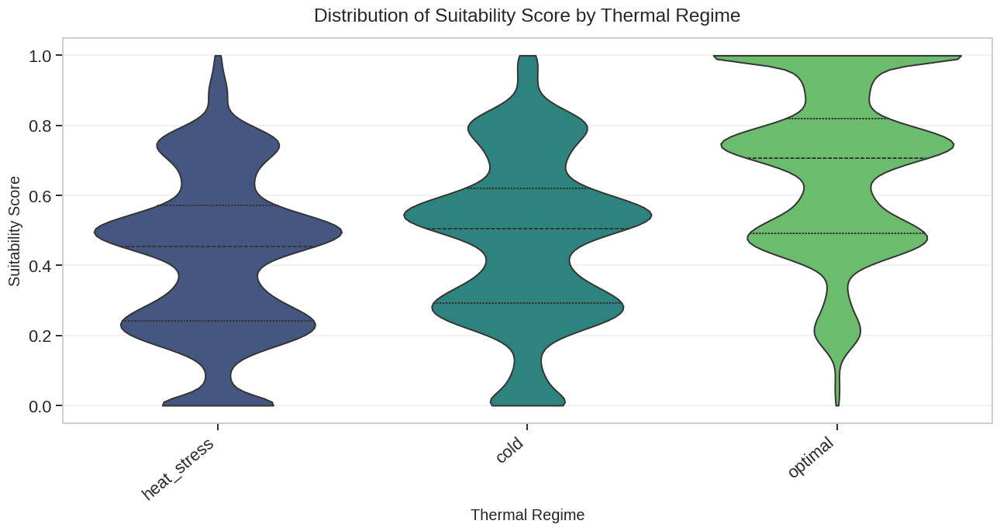

→ Median & IQR of suitability_score by thermal_regime:
                  50%    25%    75%
thermal_regime                     
cold            0.506  0.292  0.621
heat_stress     0.455  0.242  0.571
optimal         0.706  0.492  0.820
----------------------------------------------------------------- 



/tmp/ipykernel_55/1568784258.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


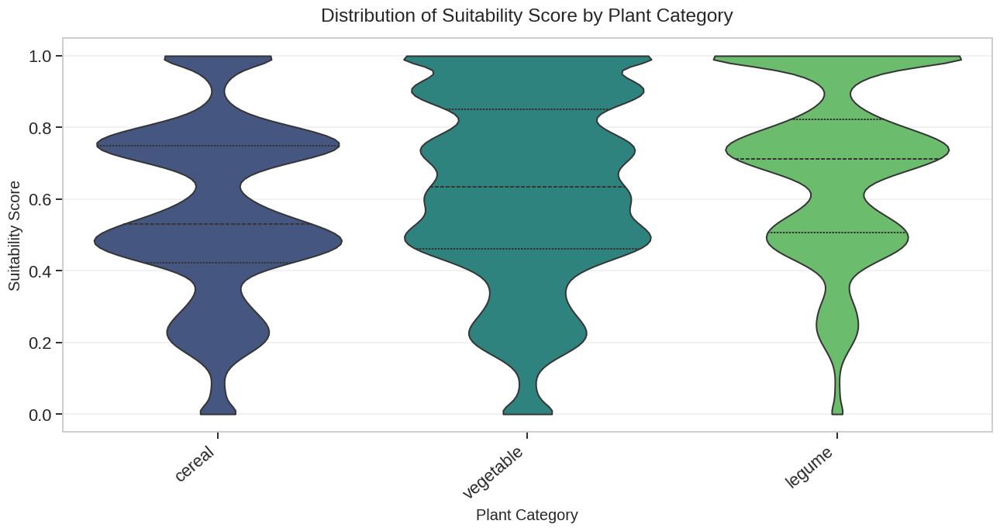

→ Median & IQR of suitability_score by plant_category:
                  50%    25%    75%
plant_category                     
cereal          0.530  0.423  0.749
legume          0.713  0.506  0.823
vegetable       0.634  0.461  0.851
----------------------------------------------------------------- 



/tmp/ipykernel_55/1568784258.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


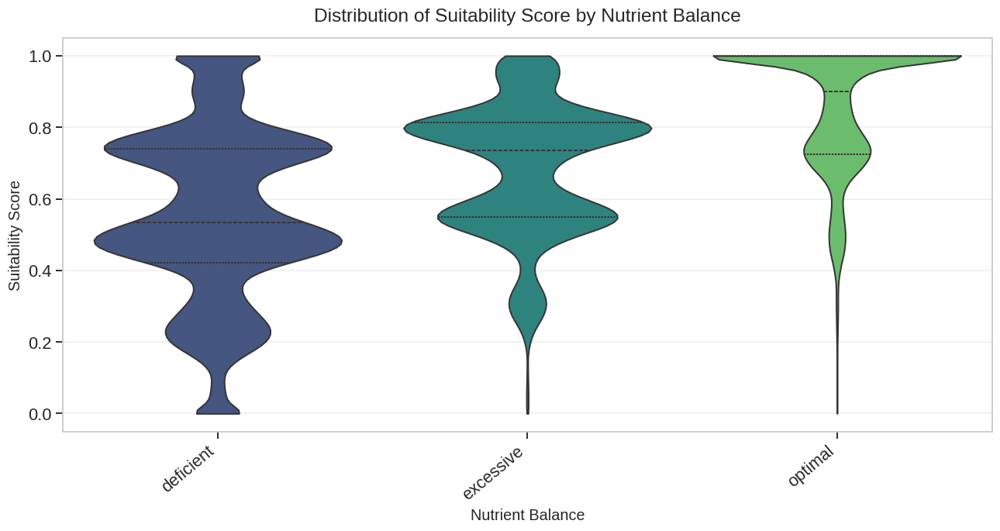

→ Median & IQR of suitability_score by nutrient_balance:
                    50%    25%    75%
nutrient_balance                     
deficient         0.535  0.422  0.739
excessive         0.735  0.550  0.814
optimal           0.900  0.724  1.000
----------------------------------------------------------------- 

=== Suitability Score – Success vs Failure (violin + points) ===



/tmp/ipykernel_55/1568784258.py:80: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


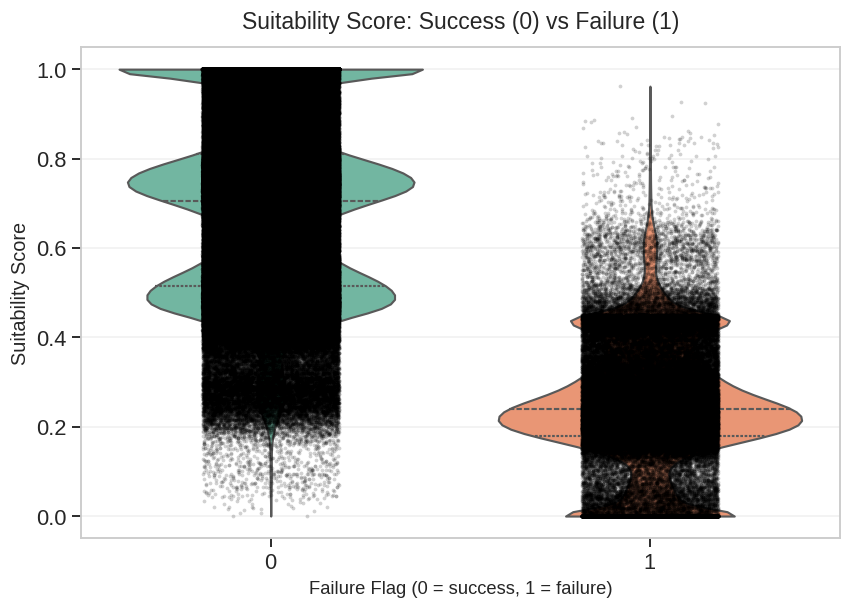

Quick stats – Suitability score by failure_flag:
                 count   mean    std  min    25%    50%    75%    max
failure_flag                                                         
0             455130.0  0.683  0.196  0.0  0.514  0.705  0.811  1.000
1              88080.0  0.252  0.140  0.0  0.178  0.239  0.339  0.962

=== Soil Moisture % – by Moisture Regime ===



/tmp/ipykernel_55/1568784258.py:119: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


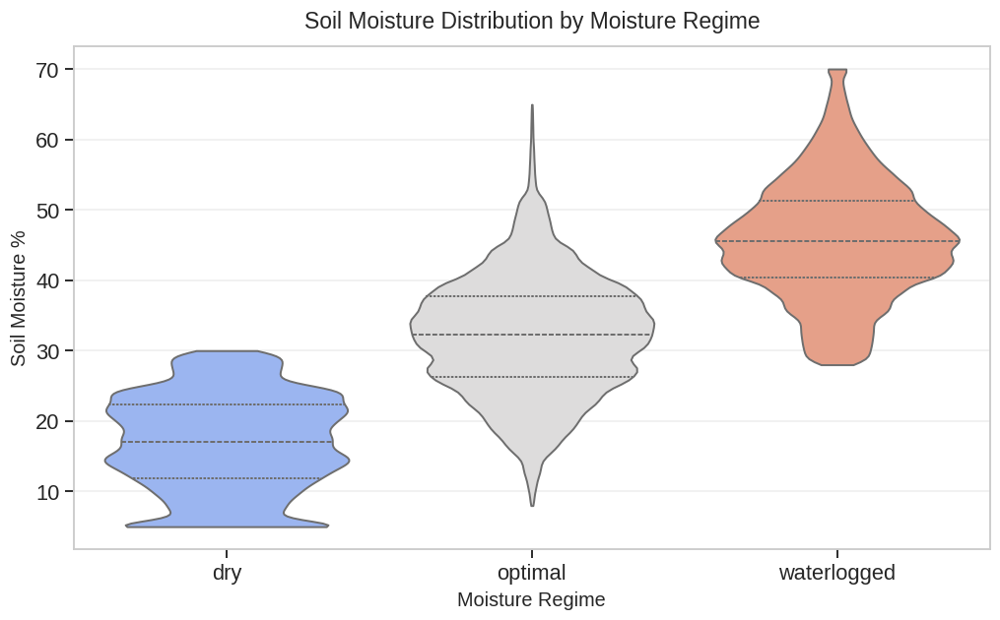

=== Air Temperature – by Thermal Regime ===



/tmp/ipykernel_55/1568784258.py:144: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


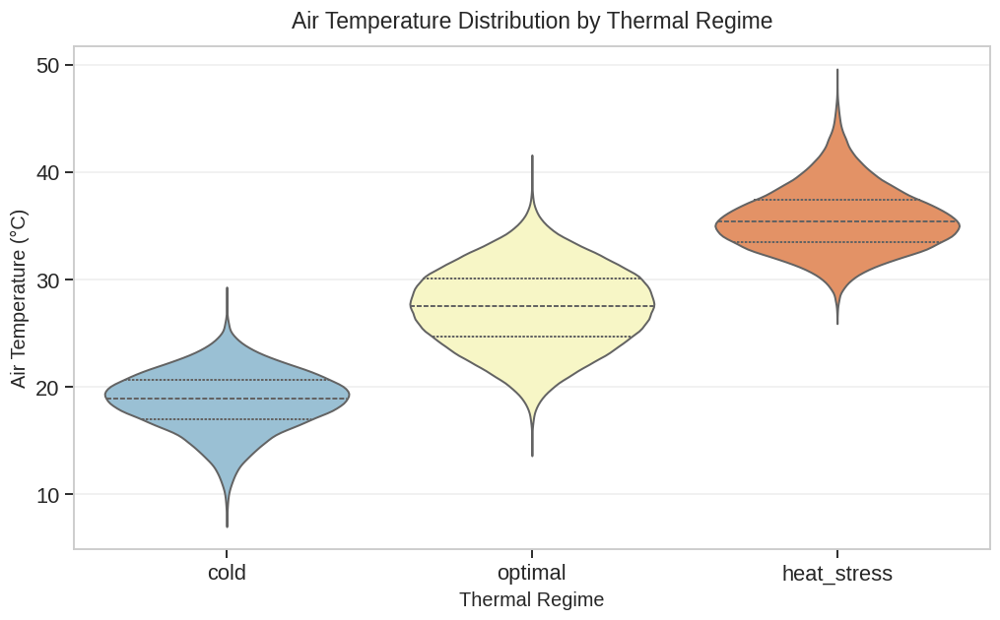


════════════════════════════════════════════════════════════════════════════════
VIOLIN PLOT ANALYSIS COMPLETED ✓
Most informative violins usually are:
  1. suitability_score ~ soil_type
  2. suitability_score ~ moisture_regime
  3. suitability_score ~ thermal_regime
  4. suitability_score ~ nutrient_balance
  5. suitability_score ~ failure_flag (bimodality check)
  6. soil_moisture_pct ~ moisture_regime (validation of categories)
  7. air_temp_c ~ thermal_regime
════════════════════════════════════════════════════════════════════════════════


In [9]:
# =============================================================================
# Agro-Environmental Dataset – Important VIOLIN PLOTS
# Showing density + distribution + summary statistics across categories
# =============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ────────────────────────────────────────────────
# Visual style
# ────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_context("notebook", font_scale=1.3)
plt.rcParams['figure.dpi'] = 110
plt.rcParams['figure.figsize'] = (11, 6.2)

# ────────────────────────────────────────────────
# Load data
# ────────────────────────────────────────────────
df = pd.read_csv("/kaggle/input/agro-environmental-dataset/agro_environmental_dataset.csv")
print("Dataset loaded → shape:", df.shape, "\n")

# ────────────────────────────────────────────────
# 1. Violin plots – Suitability score across key grouping variables
# ────────────────────────────────────────────────
print("=== VIOLIN PLOTS – Suitability Score by Category ===\n")

grouping_vars = [
    'soil_type',
    'moisture_regime',
    'thermal_regime',
    'plant_category',
    'nutrient_balance'
]

for var in grouping_vars:
    plt.figure(figsize=(12, 6.5))
    
    # Sort categories by median suitability (nicer visual order)
    order = df.groupby(var)['suitability_score'].median().sort_values().index
    
    sns.violinplot(
        data=df,
        x=var,
        y='suitability_score',
        order=order,
        palette='viridis',
        inner='quartile',          # shows 25%, 50%, 75%
        linewidth=1.3,
        cut=0                      # no extension beyond data range
    )
    
    # Add a light swarm / strip for small categories (optional – comment out if too slow)
    # sns.stripplot(data=df, x=var, y='suitability_score', order=order,
    #               color='black', alpha=0.15, size=2.8, jitter=0.22)
    
    plt.title(f"Distribution of Suitability Score by {var.replace('_',' ').title()}", 
              fontsize=16, pad=14)
    plt.xlabel(var.replace('_',' ').title(), fontsize=13)
    plt.ylabel("Suitability Score", fontsize=13)
    plt.xticks(rotation=40, ha='right')
    plt.grid(axis='y', alpha=0.35)
    
    plt.tight_layout()
    plt.show()
    
    # Quick summary stats
    print(f"→ Median & IQR of suitability_score by {var}:")
    print(df.groupby(var)['suitability_score'].describe().round(3)[['50%', '25%', '75%']])
    print("-"*65, "\n")

# ────────────────────────────────────────────────
# 2. Special: Suitability score – split by failure_flag
# ────────────────────────────────────────────────
print("=== Suitability Score – Success vs Failure (violin + points) ===\n")

plt.figure(figsize=(8, 5.8))

sns.violinplot(
    data=df,
    x='failure_flag',
    y='suitability_score',
    palette=['#66c2a5', '#fc8d62'],
    inner='quartile',
    linewidth=1.4,
    cut=0
)

# Add jittered points for better sense of density
sns.stripplot(
    data=df,
    x='failure_flag',
    y='suitability_score',
    color='black',
    alpha=0.18,
    size=2.5,
    jitter=0.18
)

plt.title("Suitability Score: Success (0) vs Failure (1)", fontsize=15, pad=12)
plt.xlabel("Failure Flag (0 = success, 1 = failure)", fontsize=12)
plt.ylabel("Suitability Score", fontsize=13)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

print("Quick stats – Suitability score by failure_flag:")
print(df.groupby('failure_flag')['suitability_score'].describe().round(3))
print()

# ────────────────────────────────────────────────
# 3. Soil moisture % by moisture regime (very diagnostic)
# ────────────────────────────────────────────────
print("=== Soil Moisture % – by Moisture Regime ===\n")

plt.figure(figsize=(9.5, 6))

sns.violinplot(
    data=df,
    x='moisture_regime',
    y='soil_moisture_pct',
    order=['dry', 'optimal', 'waterlogged'],
    palette='coolwarm',
    inner='quartile',
    linewidth=1.3,
    cut=0
)

plt.title("Soil Moisture Distribution by Moisture Regime", fontsize=15, pad=12)
plt.xlabel("Moisture Regime", fontsize=13)
plt.ylabel("Soil Moisture %", fontsize=13)
plt.grid(axis='y', alpha=0.35)
plt.tight_layout()
plt.show()

# ────────────────────────────────────────────────
# 4. Air temperature by thermal regime
# ────────────────────────────────────────────────
print("=== Air Temperature – by Thermal Regime ===\n")

plt.figure(figsize=(9.5, 6))

sns.violinplot(
    data=df,
    x='thermal_regime',
    y='air_temp_c',
    order=['cold', 'optimal', 'heat_stress'],
    palette='RdYlBu_r',
    inner='quartile',
    linewidth=1.3,
    cut=0
)

plt.title("Air Temperature Distribution by Thermal Regime", fontsize=15, pad=12)
plt.xlabel("Thermal Regime", fontsize=13)
plt.ylabel("Air Temperature (°C)", fontsize=13)
plt.grid(axis='y', alpha=0.35)
plt.tight_layout()
plt.show()

print("\n" + "═"*80)
print("VIOLIN PLOT ANALYSIS COMPLETED ✓")
print("Most informative violins usually are:")
print("  1. suitability_score ~ soil_type")
print("  2. suitability_score ~ moisture_regime")
print("  3. suitability_score ~ thermal_regime")
print("  4. suitability_score ~ nutrient_balance")
print("  5. suitability_score ~ failure_flag (bimodality check)")
print("  6. soil_moisture_pct ~ moisture_regime (validation of categories)")
print("  7. air_temp_c ~ thermal_regime")
print("═"*80)

Loading dataset...
Using 10,000 random rows for fast visualization

Generating pairplot...



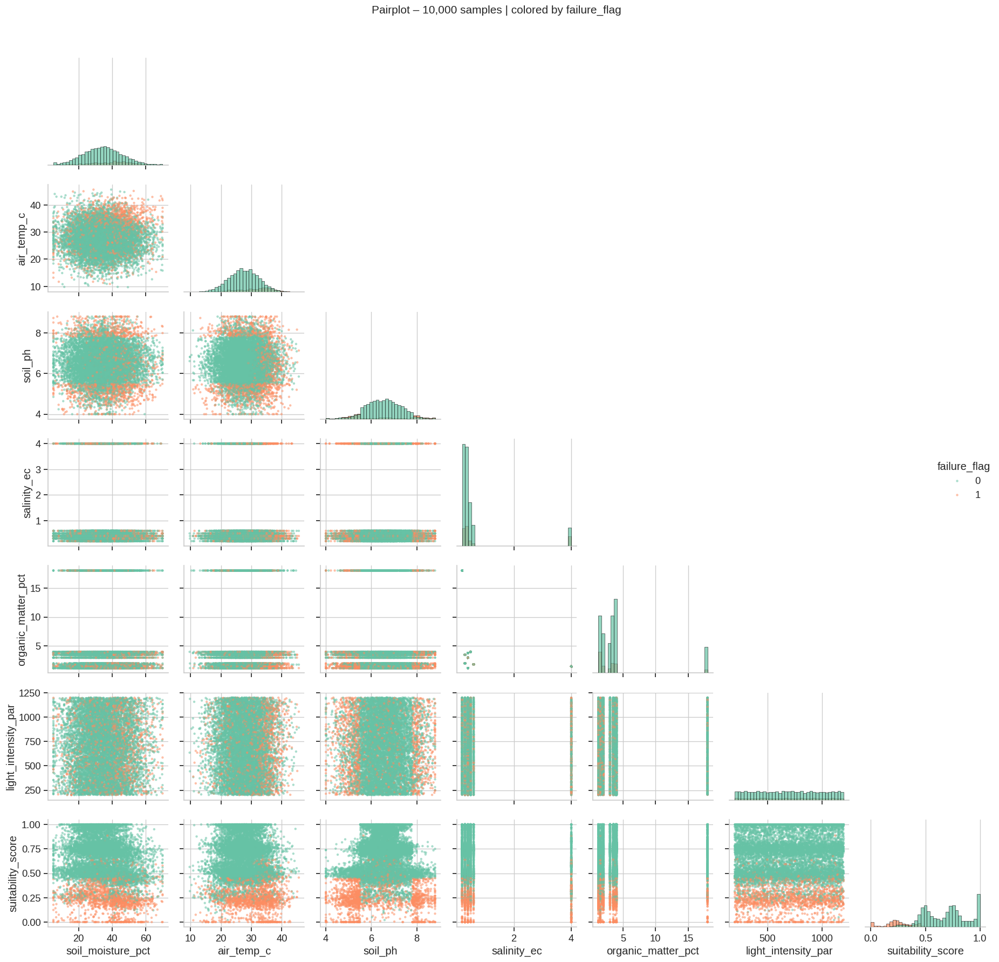

What to look for in pairplot:
• Strong separation between green (0) and orange (1) points?
• Which variable shows clearest class boundary?
• Non-linear / threshold patterns?
--------------------------------------------------------------------------- 

Generating key scatterplots...



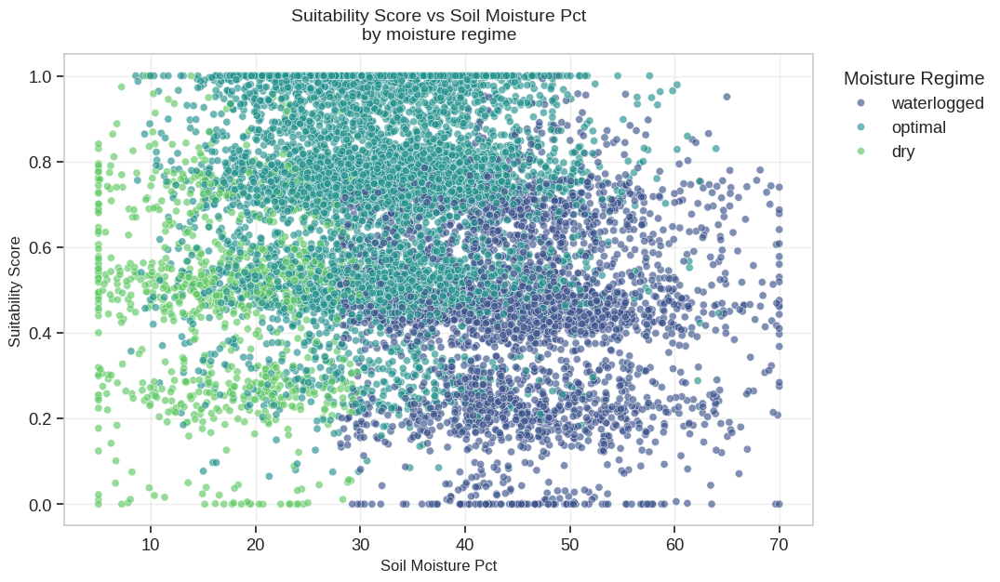

Scatter: suitability_score vs soil_moisture_pct (by moisture regime)
→ Look for: thresholds, U-shapes, group separation, linear trend strength
-----------------------------------------------------------------


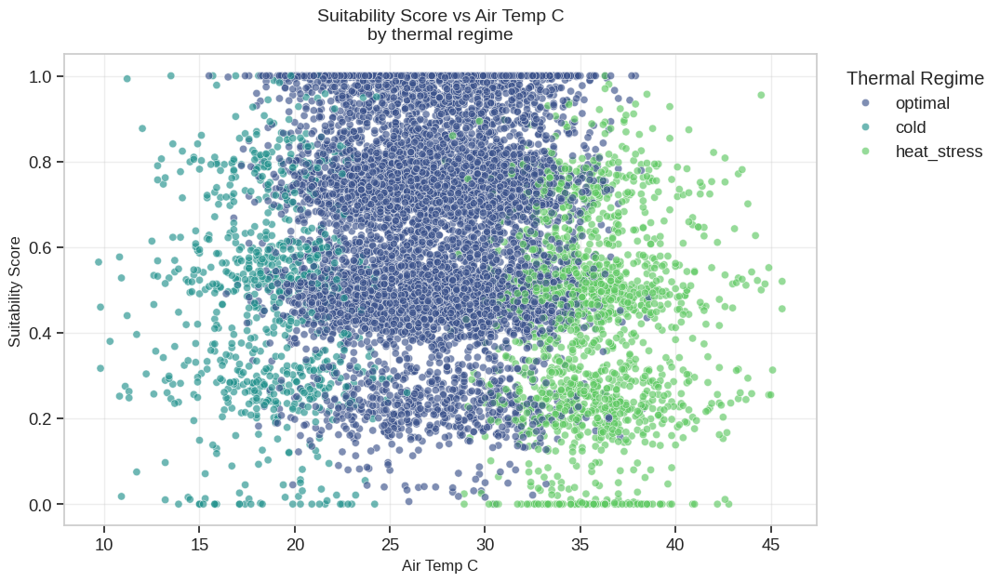

Scatter: suitability_score vs air_temp_c (by thermal regime)
→ Look for: thresholds, U-shapes, group separation, linear trend strength
-----------------------------------------------------------------


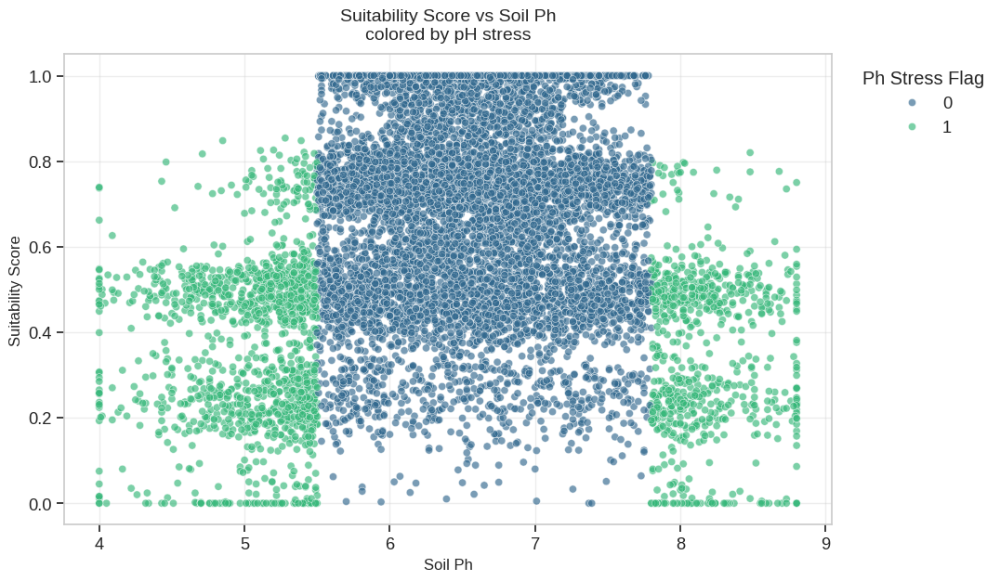

Scatter: suitability_score vs soil_ph (colored by pH stress)
→ Look for: thresholds, U-shapes, group separation, linear trend strength
-----------------------------------------------------------------


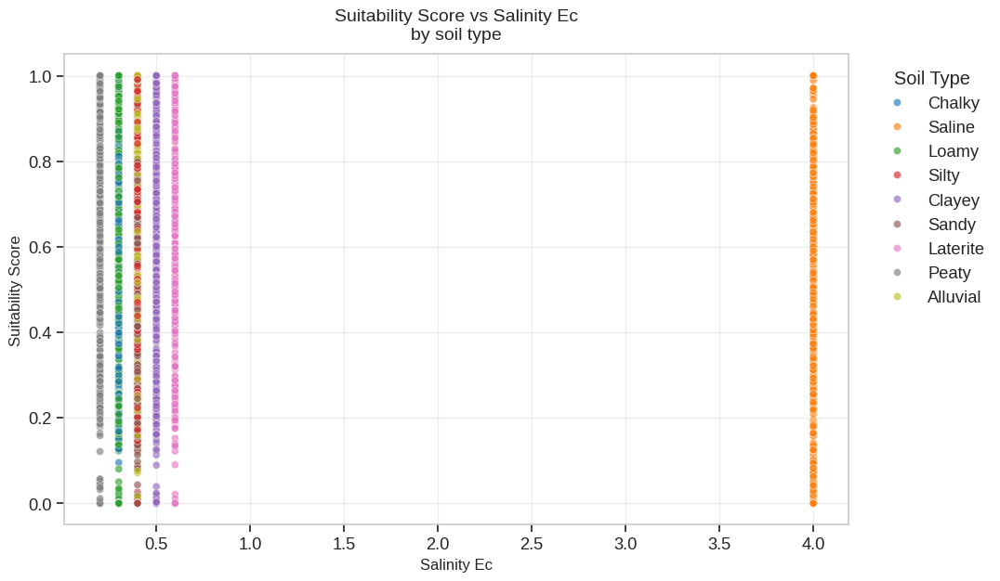

Scatter: suitability_score vs salinity_ec (by soil type)
→ Look for: thresholds, U-shapes, group separation, linear trend strength
-----------------------------------------------------------------


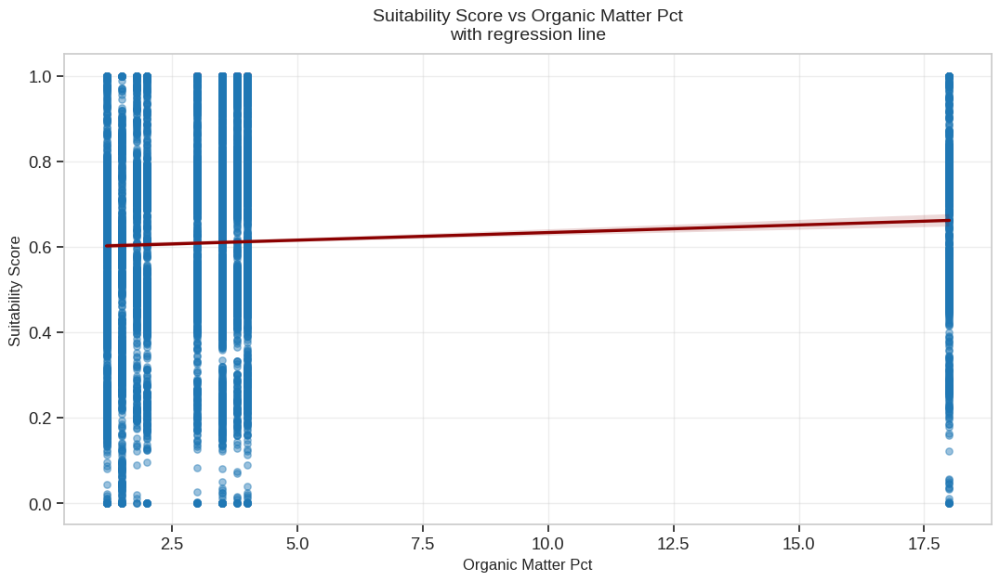

Scatter: suitability_score vs organic_matter_pct (with regression line)
→ Look for: thresholds, U-shapes, group separation, linear trend strength
-----------------------------------------------------------------


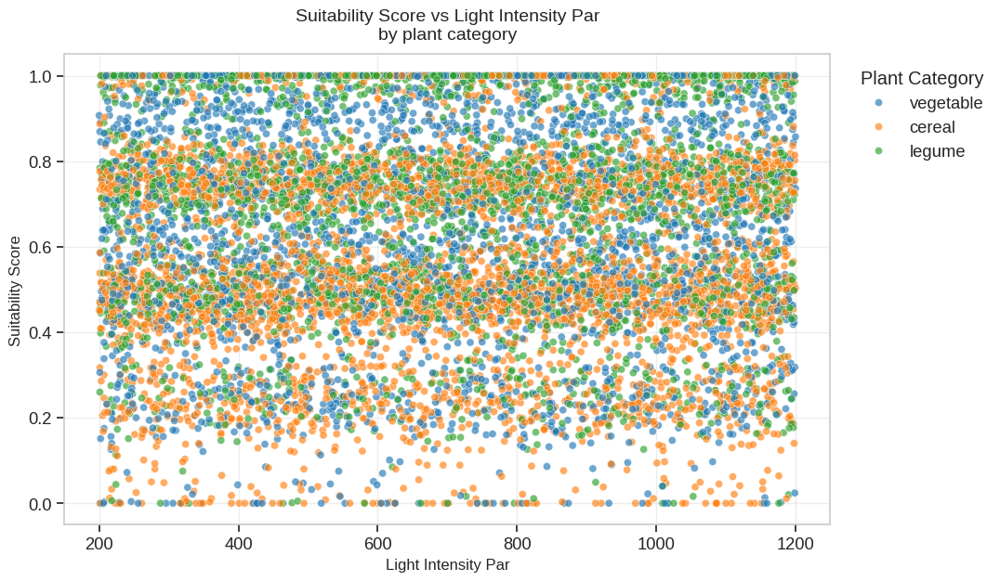

Scatter: suitability_score vs light_intensity_par (by plant category)
→ Look for: thresholds, U-shapes, group separation, linear trend strength
-----------------------------------------------------------------

Dense scatter alternative: hexbin plot (good when many points overlap)



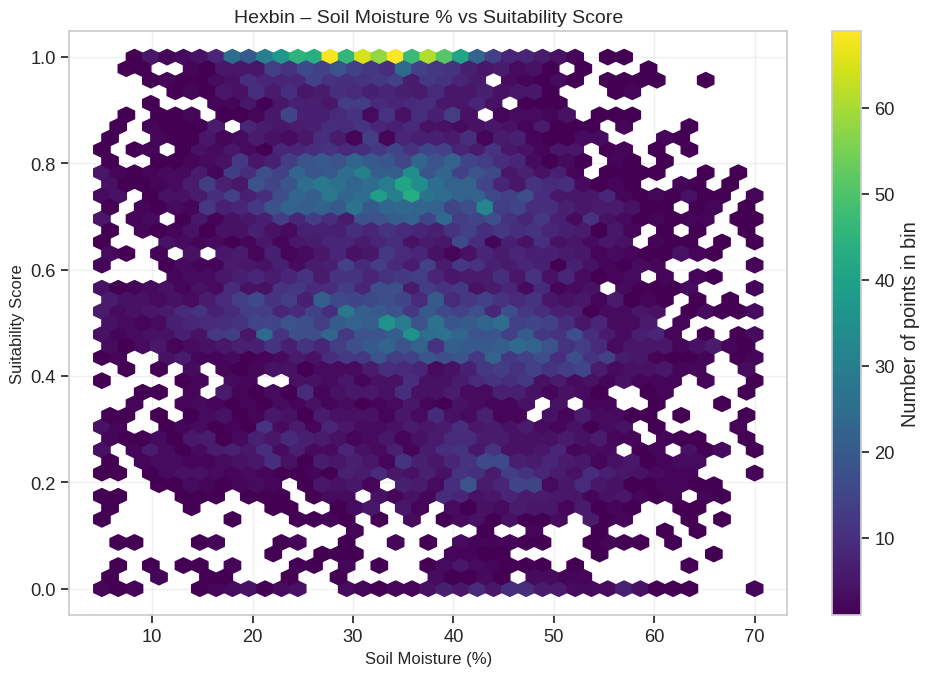

Hexbin interpretation:
• Bright areas = high density of observations
• Shows concentration zones and avoids overplotting
════════════════════════════════════════════════════════════════════════════════
Pairplot + Scatterplots Completed
════════════════════════════════════════════════════════════════════════════════


In [3]:
# =============================================================================
# Agro-Environmental Dataset – Pairplot + Important Scatterplots
# =============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ─── Styling ────────────────────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_context("notebook", font_scale=1.2)
plt.rcParams['figure.dpi'] = 100
plt.rcParams['figure.figsize'] = (10, 6.5)

# ─── Load & sample data (critical for speed) ────────────────────────────────
print("Loading dataset...")
df = pd.read_csv("/kaggle/input/agro-environmental-dataset/agro_environmental_dataset.csv")

SAMPLE_SIZE = 10000
df_sample = df.sample(n=SAMPLE_SIZE, random_state=42)
print(f"Using {SAMPLE_SIZE:,} random rows for fast visualization\n")

# ─── Key columns we care about ──────────────────────────────────────────────
key_cols = [
    'soil_moisture_pct',
    'air_temp_c',
    'soil_ph',
    'salinity_ec',
    'organic_matter_pct',
    'light_intensity_par',
    'suitability_score',
    'failure_flag'             
]

# ─── 1. Pairplot – main relationships + class separation ───────────────
print("Generating pairplot...\n")

g = sns.pairplot(
    df_sample[key_cols],
    hue='failure_flag',
    palette={0: '#66c2a5', 1: '#fc8d62'},
    corner=True,                       
    diag_kind='hist',                   
    plot_kws={'s': 10, 'alpha': 0.55, 'linewidth':0},
    diag_kws={'bins': 35, 'alpha': 0.7}
)

g.fig.suptitle(f"Pairplot – {SAMPLE_SIZE:,} samples | colored by failure_flag", 
               y=1.02, fontsize=15)
g.fig.tight_layout()
plt.show()

print("What to look for in pairplot:")
print("• Strong separation between green (0) and orange (1) points?")
print("• Which variable shows clearest class boundary?")
print("• Non-linear / threshold patterns?")
print("-"*75, "\n")

# ─── 2. Important Scatterplots with regression & meaningful hue ─────────────
print("Generating key scatterplots...\n")

scatter_list = [
    # variable_x,          variable_y,           hue_column,           title_suffix
    ('soil_moisture_pct',  'suitability_score',  'moisture_regime',    'by moisture regime'),
    ('air_temp_c',         'suitability_score',  'thermal_regime',     'by thermal regime'),
    ('soil_ph',            'suitability_score',  'ph_stress_flag',     'colored by pH stress'),
    ('salinity_ec',        'suitability_score',  'soil_type',          'by soil type'),
    ('organic_matter_pct', 'suitability_score',  None,                 'with regression line'),
    ('light_intensity_par','suitability_score',  'plant_category',     'by plant category'),
]

for x_var, y_var, hue_var, title_suffix in scatter_list:
    plt.figure(figsize=(11, 6.5))
    
    if hue_var:
        sns.scatterplot(
            data=df_sample,
            x=x_var,
            y=y_var,
            hue=hue_var,
            alpha=0.65,
            s=35,
            palette='tab10' if 'soil_type' in hue_var or 'plant_category' in hue_var else 'viridis'
        )
        plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', title=hue_var.replace('_',' ').title())
    else:
        # regression + confidence interval when no hue
        sns.regplot(
            data=df_sample,
            x=x_var,
            y=y_var,
            scatter_kws={'s': 28, 'alpha':0.45},
            line_kws={'color':'darkred', 'lw':2.4},
            ci=95
        )
    
    plt.title(f"{y_var.replace('_',' ').title()} vs {x_var.replace('_',' ').title()}\n{title_suffix}", 
              fontsize=14, pad=12)
    plt.xlabel(x_var.replace('_',' ').title(), fontsize=12)
    plt.ylabel(y_var.replace('_',' ').title(), fontsize=12)
    plt.grid(alpha=0.35)
    plt.tight_layout()
    plt.show()
    
    print(f"Scatter: {y_var} vs {x_var} ({title_suffix})")
    print("→ Look for: thresholds, U-shapes, group separation, linear trend strength")
    print("-"*65)

# ─── Optional: one more – binned scatter / hexbin for dense data ────────────
print("\nDense scatter alternative: hexbin plot (good when many points overlap)\n")

plt.figure(figsize=(10, 7))
plt.hexbin(
    df_sample['soil_moisture_pct'],
    df_sample['suitability_score'],
    gridsize=40,
    cmap='viridis',
    mincnt=1
)
plt.colorbar(label='Number of points in bin')
plt.title("Hexbin – Soil Moisture % vs Suitability Score", fontsize=14)
plt.xlabel("Soil Moisture (%)", fontsize=12)
plt.ylabel("Suitability Score", fontsize=12)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

print("Hexbin interpretation:")
print("• Bright areas = high density of observations")
print("• Shows concentration zones and avoids overplotting")
print("═"*80)
print("Pairplot + Scatterplots Completed")
print("═"*80)

Shape: (543210, 25) 

1. Interaction: Soil Moisture % × Air Temperature → Suitability



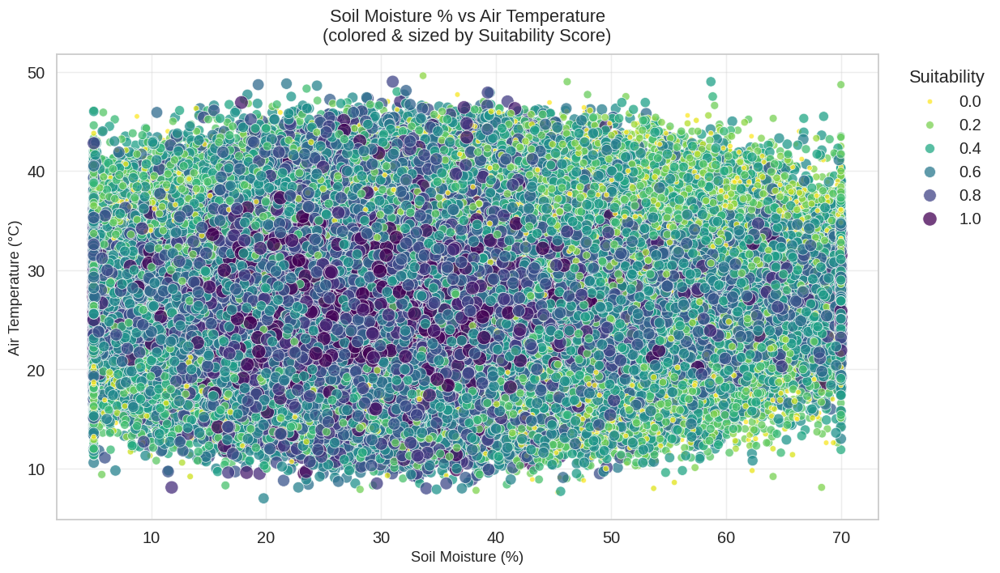

→ Look for: regions where low/high moisture + high temp → poor suitability
   → Candidate: bin moisture & temp → create stress zones
--------------------------------------------------------------------------- 

2. Soil pH vs (N + P + K)/3   → nutrient availability pattern



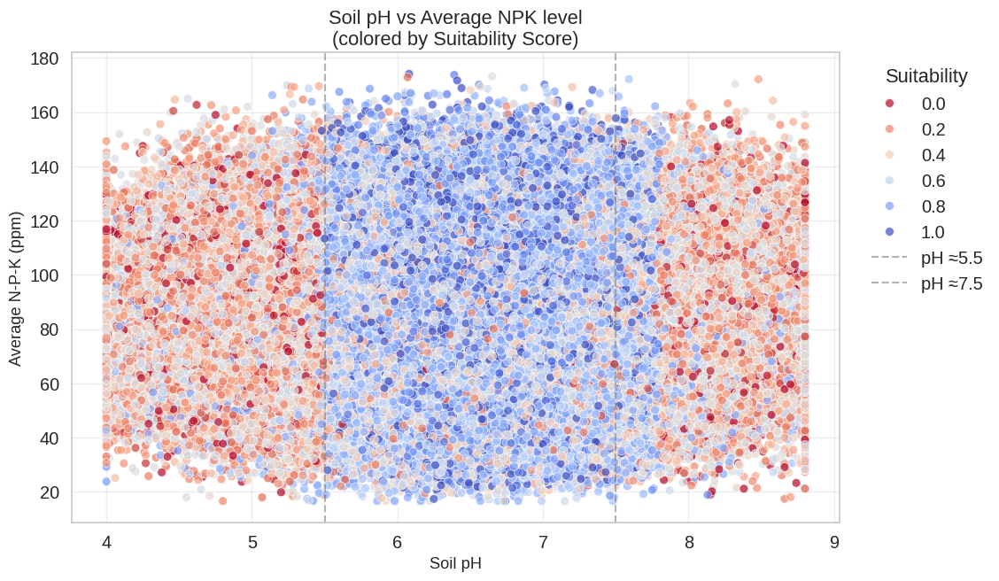

→ Insight: suitability often drops outside ~5.8–7.4 even with high nutrients
   → Candidate: create pH_ideal flag or pH_distance_from_optimal feature
--------------------------------------------------------------------------- 

3. Temperature deviation from ~24–26 °C → suitability drop



/tmp/ipykernel_55/2325279120.py:91: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(


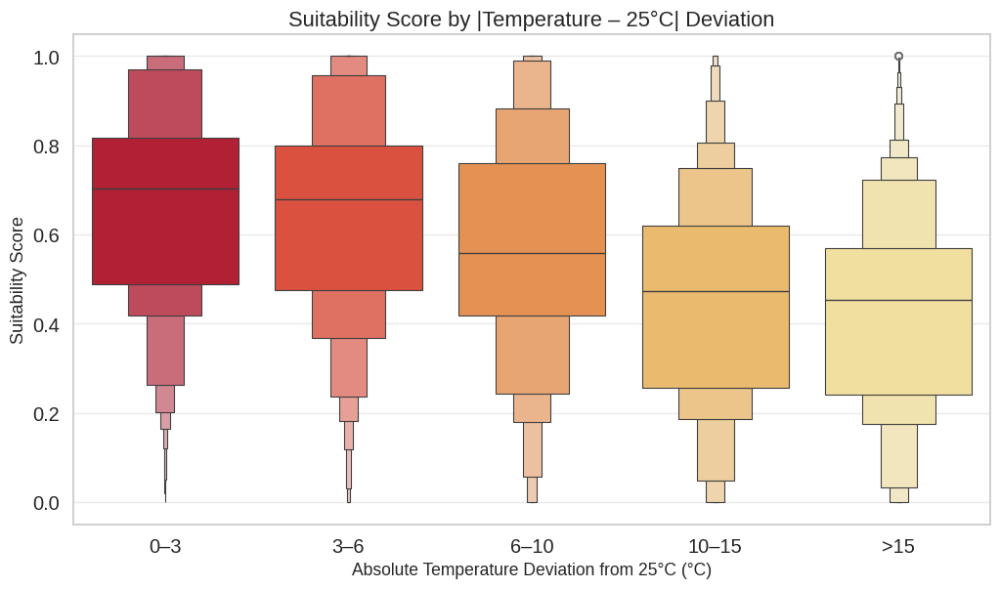

→ Candidate: create temp_stress_index = min(1, |temp - 25| / 10)
--------------------------------------------------------------------------- 

4. Moisture distance from [moisture_limit_dry, moisture_limit_wet]



/tmp/ipykernel_55/2325279120.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(


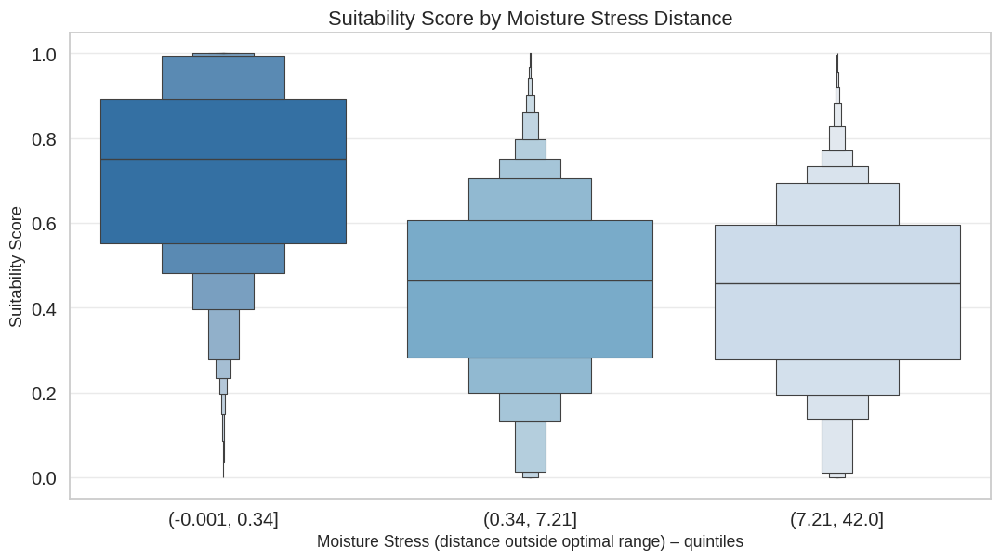

→ Candidate: moisture_stress = max(0, dry_limit - moisture) + max(0, moisture - wet_limit)
--------------------------------------------------------------------------- 

Feature Engineering Visualization Completed
════════════════════════════════════════════════════════════════════════════════


In [8]:
# =============================================================================
# Agro-Environmental Dataset – Feature Engineering Plots
# Visual diagnostics useful before modeling / feature creation
# =============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ─── Styling ────────────────────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_context("notebook", font_scale=1.25)
plt.rcParams['figure.dpi'] = 105
plt.rcParams['figure.figsize'] = (11, 6.2)

# ─── Load ───────────────────────────────────────────────────────────────────
df = pd.read_csv("/kaggle/input/agro-environmental-dataset/agro_environmental_dataset.csv")
print("Shape:", df.shape, "\n")

# ─── Target ─────────────────────────────────────────────────────────────────
TARGET = 'suitability_score'   # or 'failure_flag' for binary view

# ─── 1. Interaction: moisture × temperature ────────────────────────────────
print("1. Interaction: Soil Moisture % × Air Temperature → Suitability\n")

# Create temporary interaction-like view
df_plot = df.copy()
df_plot['moist_temp_interaction'] = df_plot['soil_moisture_pct'] * df_plot['air_temp_c']

plt.figure(figsize=(12, 7))
sns.scatterplot(
    data=df_plot,
    x='soil_moisture_pct',
    y='air_temp_c',
    hue=TARGET,
    size=TARGET,
    palette='viridis_r',
    alpha=0.75,
    sizes=(20, 140)
)
plt.title("Soil Moisture % vs Air Temperature\n(colored & sized by Suitability Score)", 
          fontsize=15, pad=12)
plt.xlabel("Soil Moisture (%)", fontsize=12.5)
plt.ylabel("Air Temperature (°C)", fontsize=12.5)
plt.legend(title="Suitability", bbox_to_anchor=(1.02, 1), loc='upper left')
plt.grid(alpha=0.35)
plt.tight_layout()
plt.show()

print("→ Look for: regions where low/high moisture + high temp → poor suitability")
print("   → Candidate: bin moisture & temp → create stress zones")
print("-"*75, "\n")

# ─── 2. pH × Nutrient availability proxy ───────────────────────────────────
print("2. Soil pH vs (N + P + K)/3   → nutrient availability pattern\n")

df_plot['avg_npk'] = df_plot[['nitrogen_ppm', 'phosphorus_ppm', 'potassium_ppm']].mean(axis=1)

plt.figure(figsize=(11, 6.5))
sns.scatterplot(
    data=df_plot,
    x='soil_ph',
    y='avg_npk',
    hue=TARGET,
    palette='coolwarm_r',
    alpha=0.7,
    s=45
)
plt.axvline(5.5, color='gray', ls='--', alpha=0.6, label='pH ≈5.5')
plt.axvline(7.5, color='gray', ls='--', alpha=0.6, label='pH ≈7.5')
plt.title("Soil pH vs Average NPK level\n(colored by Suitability Score)", fontsize=15)
plt.xlabel("Soil pH", fontsize=12.5)
plt.ylabel("Average N-P-K (ppm)", fontsize=12.5)
plt.legend(title="Suitability", bbox_to_anchor=(1.02,1), loc='upper left')
plt.grid(alpha=0.35)
plt.tight_layout()
plt.show()

print("→ Insight: suitability often drops outside ~5.8–7.4 even with high nutrients")
print("   → Candidate: create pH_ideal flag or pH_distance_from_optimal feature")
print("-"*75, "\n")

# ─── 3. Temperature deviation from optimum ─────────────────────────────────
print("3. Temperature deviation from ~24–26 °C → suitability drop\n")

OPT_TEMP = 25
df_plot['temp_deviation'] = np.abs(df_plot['air_temp_c'] - OPT_TEMP)

plt.figure(figsize=(10, 6))
sns.boxenplot(
    data=df_plot,
    x=pd.cut(df_plot['temp_deviation'], bins=[0,3,6,10,15,100], 
             labels=['0–3','3–6','6–10','10–15','>15']),
    y=TARGET,
    palette='YlOrRd_r'
)
plt.title("Suitability Score by |Temperature – 25°C| Deviation", fontsize=15)
plt.xlabel("Absolute Temperature Deviation from 25°C (°C)", fontsize=12)
plt.ylabel("Suitability Score", fontsize=12.5)
plt.grid(axis='y', alpha=0.4)
plt.tight_layout()
plt.show()

print("→ Candidate: create temp_stress_index = min(1, |temp - 25| / 10)")
print("-"*75, "\n")

# ─── 4. Moisture stress zones (distance from optimal range) ────────────────
print("4. Moisture distance from [moisture_limit_dry, moisture_limit_wet]\n")

df_plot['moist_dev_low']  = np.maximum(0, df_plot['moisture_limit_dry'] - df_plot['soil_moisture_pct'])
df_plot['moist_dev_high'] = np.maximum(0, df_plot['soil_moisture_pct'] - df_plot['moisture_limit_wet'])
df_plot['moist_stress']   = df_plot['moist_dev_low'] + df_plot['moist_dev_high']

plt.figure(figsize=(10.5, 6))
sns.boxenplot(
    data=df_plot,
    x=pd.qcut(df_plot['moist_stress'], q=5, duplicates='drop'),
    y=TARGET,
    palette='Blues_r'
)
plt.title("Suitability Score by Moisture Stress Distance", fontsize=15)
plt.xlabel("Moisture Stress (distance outside optimal range) – quintiles", fontsize=12)
plt.ylabel("Suitability Score", fontsize=12.5)
plt.grid(axis='y', alpha=0.4)
plt.tight_layout()
plt.show()

print("→ Candidate: moisture_stress = max(0, dry_limit - moisture) + max(0, moisture - wet_limit)")
print("-"*75, "\n")

print("Feature Engineering Visualization Completed")
print("═"*80)

Subsampled shape: (54321, 25)
Training Logistic Regression...
Training Decision Tree...
Training Random Forest...
Training XGBoost...
Training LightGBM...


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Training MLP Neural Net...

=== Model Performance Comparison ===


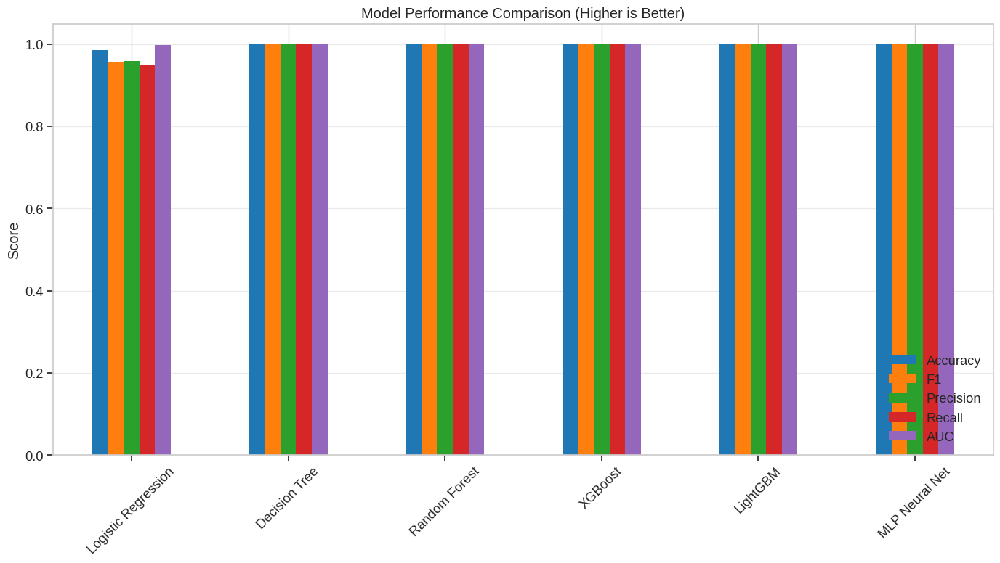

Description: Bar plot comparing Accuracy, F1, Precision, Recall, AUC across models.
• Accuracy: Overall correct predictions
• F1: Harmonic mean of Precision and Recall (good for imbalanced data)
• AUC: Area under ROC curve (discrimination power)

=== Actual vs Predicted Plots ===


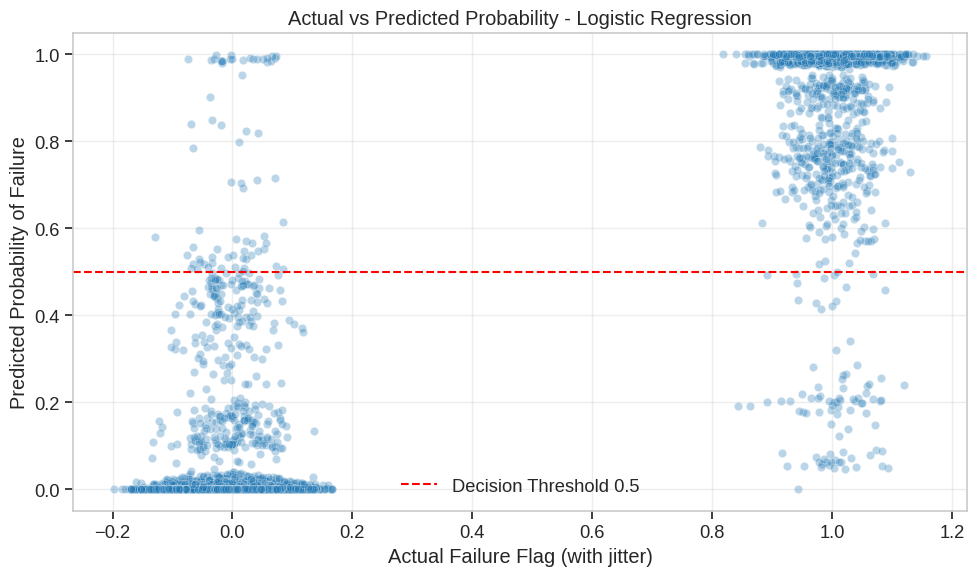

Description for Logistic Regression: Scatter shows how well predicted probs align with actual labels.
• Points near 0 should have low prob, near 1 high prob
• Good model: clear separation


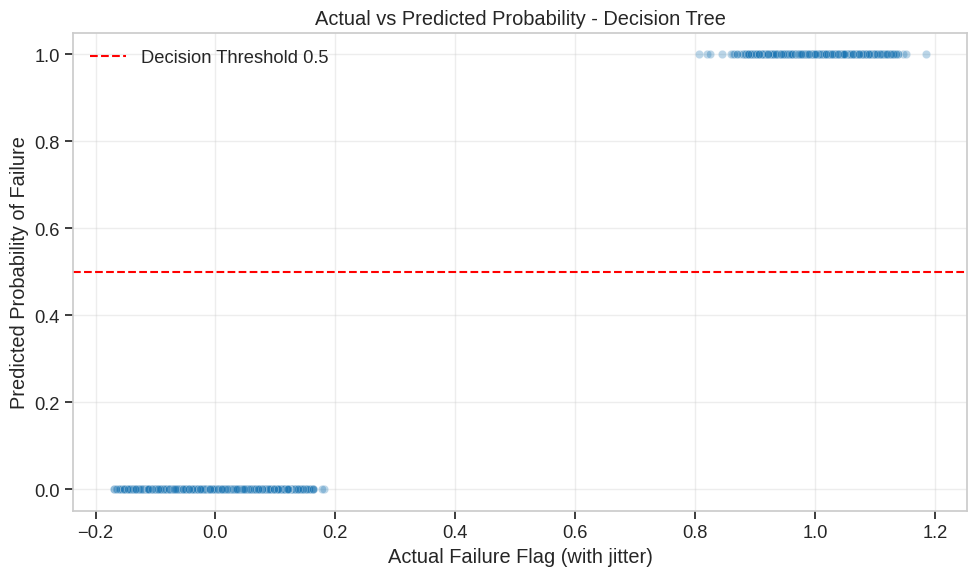

Description for Decision Tree: Scatter shows how well predicted probs align with actual labels.
• Points near 0 should have low prob, near 1 high prob
• Good model: clear separation


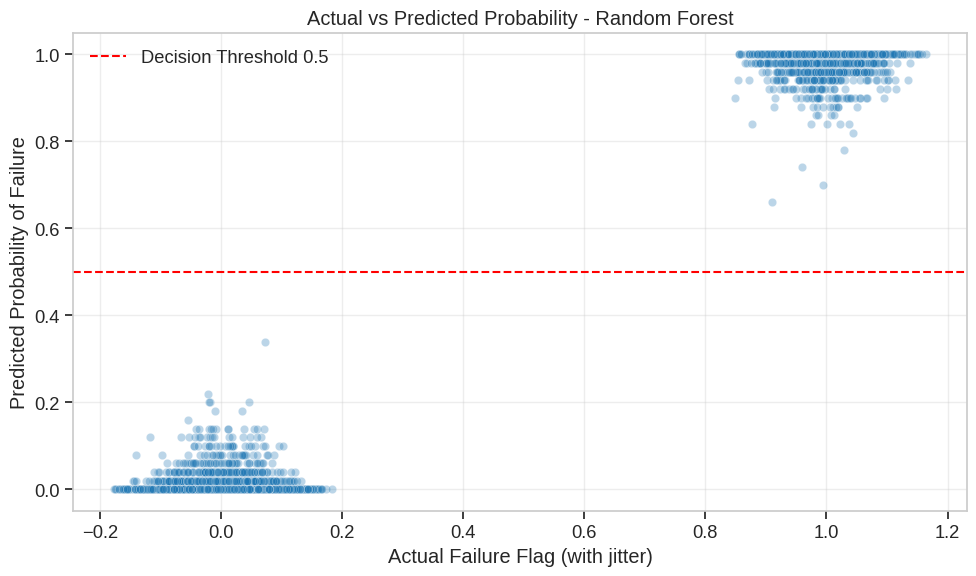

Description for Random Forest: Scatter shows how well predicted probs align with actual labels.
• Points near 0 should have low prob, near 1 high prob
• Good model: clear separation


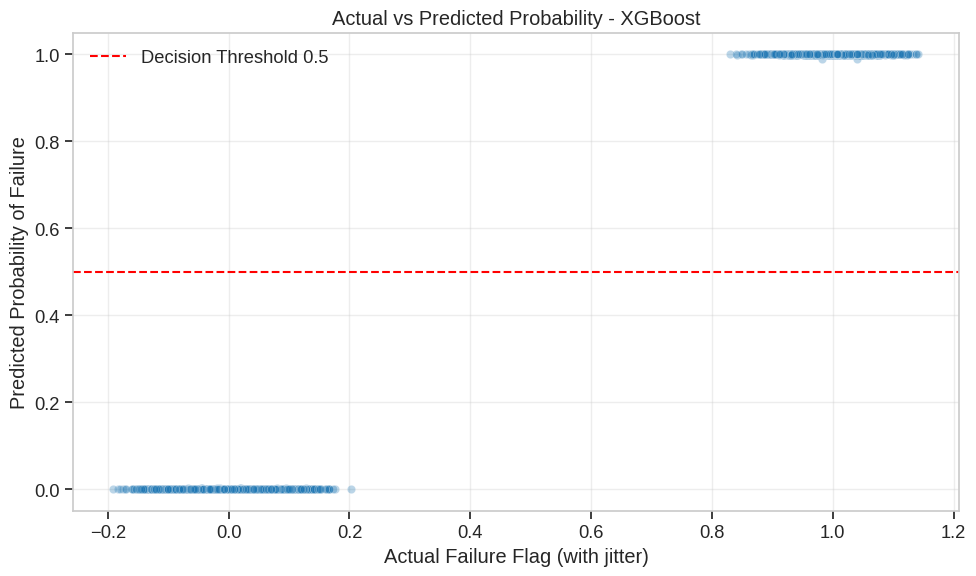

Description for XGBoost: Scatter shows how well predicted probs align with actual labels.
• Points near 0 should have low prob, near 1 high prob
• Good model: clear separation


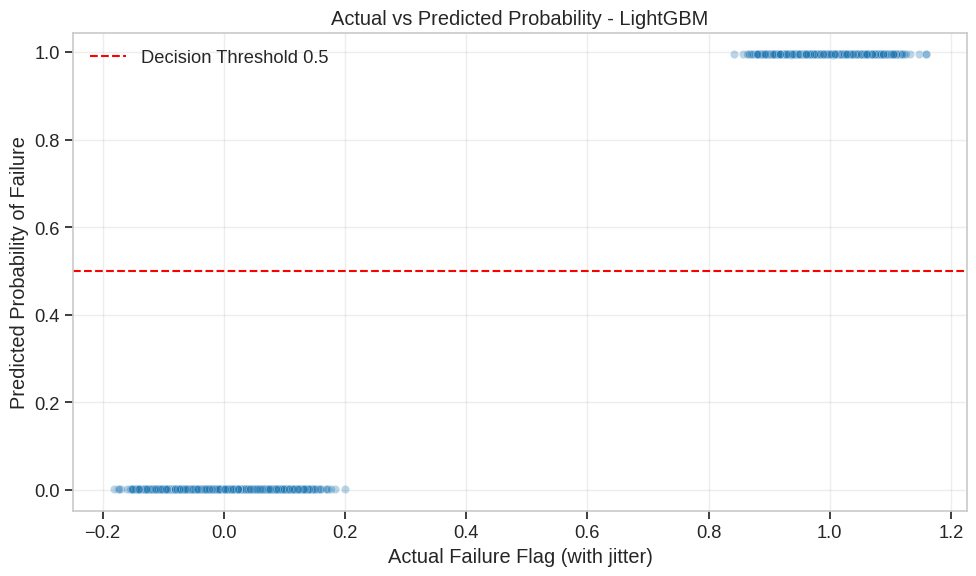

Description for LightGBM: Scatter shows how well predicted probs align with actual labels.
• Points near 0 should have low prob, near 1 high prob
• Good model: clear separation


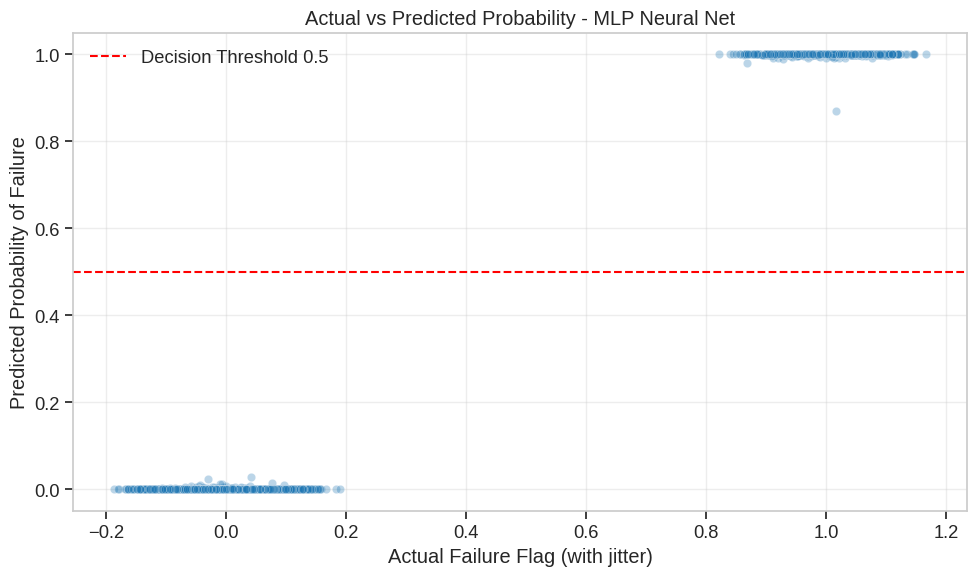

Description for MLP Neural Net: Scatter shows how well predicted probs align with actual labels.
• Points near 0 should have low prob, near 1 high prob
• Good model: clear separation


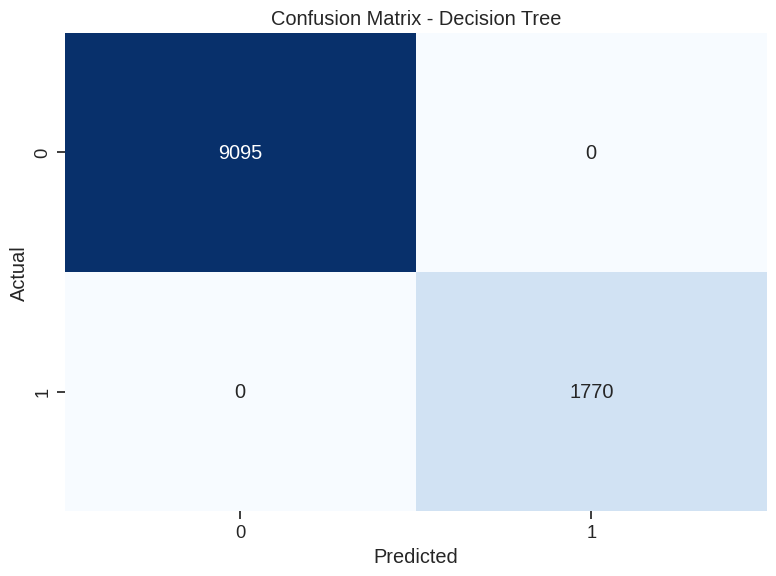

Description: Confusion matrix for best model (Decision Tree).
• Top-left: True Negative
• Bottom-right: True Positive
• Off-diagonal: Errors

=== ROC Curves ===


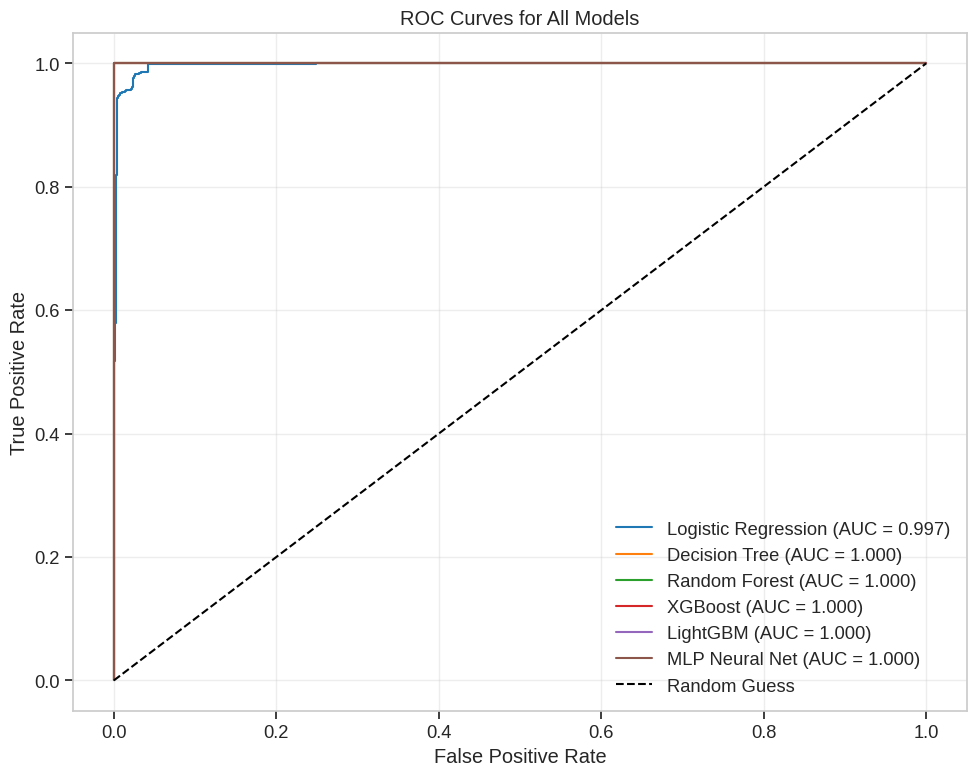

Description: ROC shows trade-off between TPR and FPR.
• Higher AUC = better model
• Curve above diagonal = useful

=== Feature Importances ===


/tmp/ipykernel_55/42351055.py:176: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=imp_df, x="Importance", y="Feature", palette="viridis")


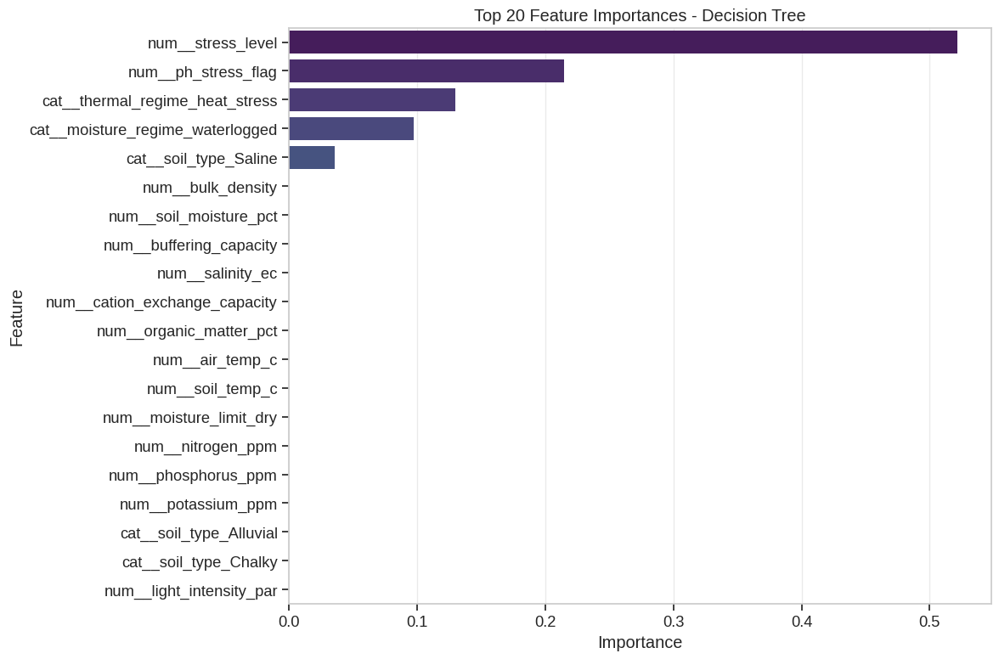

Description for Decision Tree: Bar plot of top features contributing to predictions.
• Higher bar = more important for failure prediction


/tmp/ipykernel_55/42351055.py:176: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=imp_df, x="Importance", y="Feature", palette="viridis")


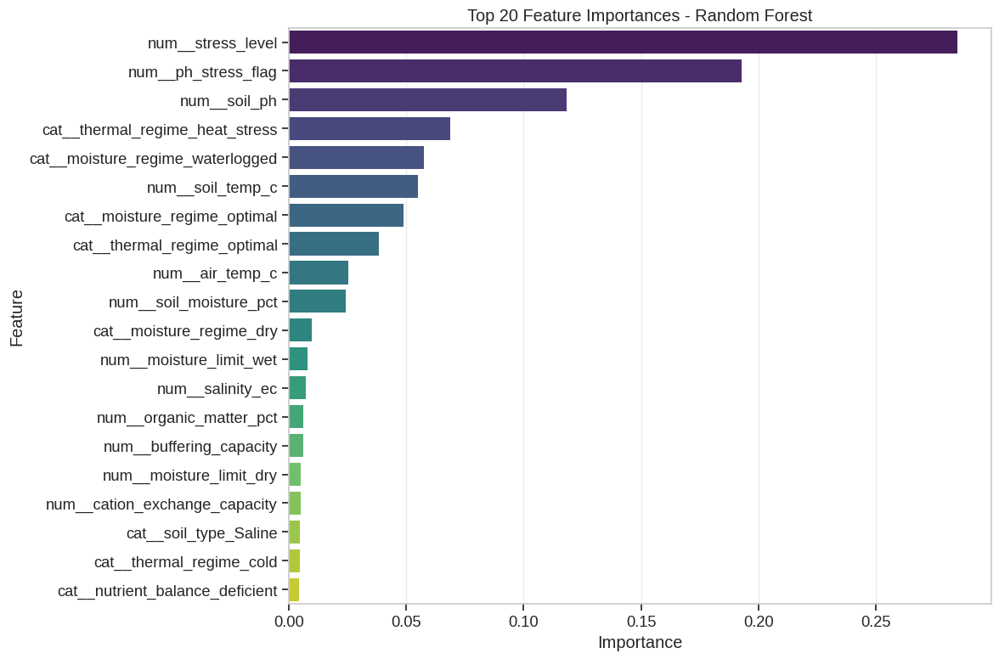

Description for Random Forest: Bar plot of top features contributing to predictions.
• Higher bar = more important for failure prediction


/tmp/ipykernel_55/42351055.py:176: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=imp_df, x="Importance", y="Feature", palette="viridis")


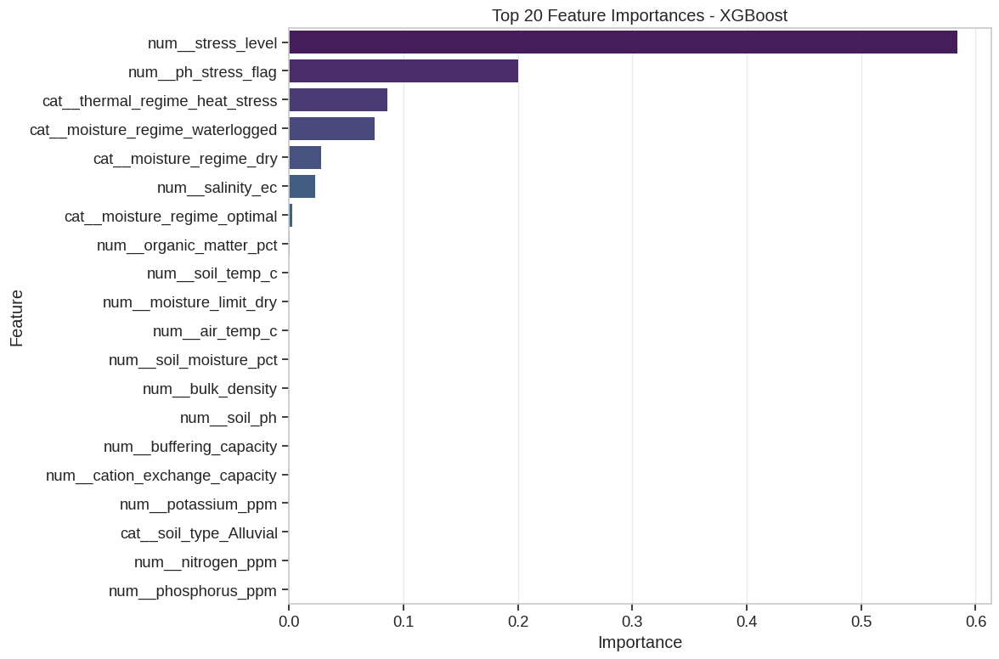

Description for XGBoost: Bar plot of top features contributing to predictions.
• Higher bar = more important for failure prediction


/tmp/ipykernel_55/42351055.py:176: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=imp_df, x="Importance", y="Feature", palette="viridis")


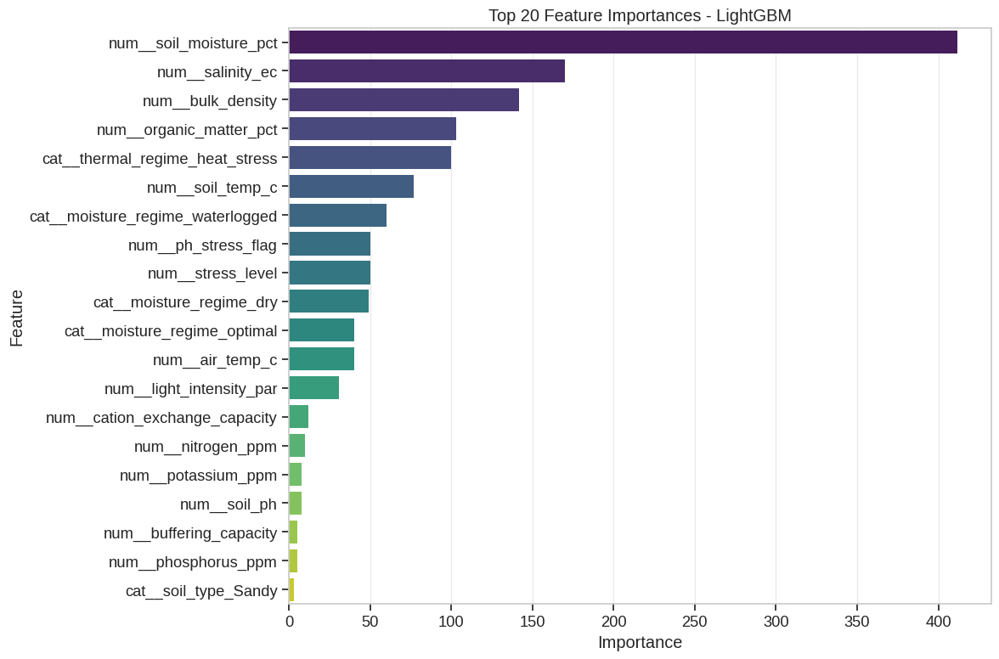

Description for LightGBM: Bar plot of top features contributing to predictions.
• Higher bar = more important for failure prediction

End of ML Analysis. Adjust subsample frac or add models as needed.


In [4]:
# =============================================================================
# Agro-Environmental Dataset - ML Models for Failure Prediction
# Classification on 'failure_flag' (binary target)
# Includes basic + advanced models, comparisons, plots
# =============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import (
    accuracy_score, f1_score, precision_score, recall_score, roc_auc_score,
    confusion_matrix, roc_curve
)
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

# ─── Load and subsample ─────────────────────────────────────────────────────
df = pd.read_csv("/kaggle/input/agro-environmental-dataset/agro_environmental_dataset.csv")
df = df.sample(frac=0.1, random_state=42)  
print("Subsampled shape:", df.shape)

# ─── Target and features ────────────────────────────────────────────────────
target = "failure_flag"  # Binary classification target
X = df.drop(["location_id", target, "suitability_score"], axis=1)  # Drop ID and potential leak
y = df[target]

# ─── Identify column types ──────────────────────────────────────────────────
cat_cols = X.select_dtypes(include=["object"]).columns.tolist()
num_cols = X.select_dtypes(include=["number"]).columns.tolist()

# ─── Preprocessing ──────────────────────────────────────────────────────────
preprocessor = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(), num_cols),
        ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), cat_cols),
    ]
)

# ─── Train-test split ───────────────────────────────────────────────────────
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Apply preprocessing
X_train_pre = preprocessor.fit_transform(X_train)
X_test_pre = preprocessor.transform(X_test)

# ─── Models: Basic + Advanced ───────────────────────────────────────────────
models = {
    "Logistic Regression": LogisticRegression(max_iter=500),
    "Decision Tree": DecisionTreeClassifier(max_depth=10),
    "Random Forest": RandomForestClassifier(n_estimators=50, random_state=42),
    "XGBoost": XGBClassifier(n_estimators=50, eval_metric="logloss", random_state=42, tree_method="hist"),
    "LightGBM": LGBMClassifier(n_estimators=50, random_state=42, verbose=-1),
    "MLP Neural Net": MLPClassifier(hidden_layer_sizes=(30,), max_iter=100, random_state=42),
}

# ─── Train and evaluate ─────────────────────────────────────────────────────
results = {}
y_preds = {}
y_probs = {}

for name, model in models.items():
    print(f"Training {name}...")
    model.fit(X_train_pre, y_train)
    y_pred = model.predict(X_test_pre)
    y_prob = (
        model.predict_proba(X_test_pre)[:, 1] if hasattr(model, "predict_proba") else None
    )

    acc = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred, zero_division=0)
    rec = recall_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_prob) if y_prob is not None else np.nan

    results[name] = {"Accuracy": acc, "F1": f1, "Precision": prec, "Recall": rec, "AUC": auc}
    y_preds[name] = y_pred
    y_probs[name] = y_prob

# ─── Model comparison bar plot ──────────────────────────────────────────────
print("\n=== Model Performance Comparison ===")
metrics_df = pd.DataFrame(results).T
metrics_df.plot(kind="bar", figsize=(14, 8))
plt.title("Model Performance Comparison (Higher is Better)")
plt.ylabel("Score")
plt.xticks(rotation=45)
plt.grid(axis="y", alpha=0.4)
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

print("Description: Bar plot comparing Accuracy, F1, Precision, Recall, AUC across models.")
print("• Accuracy: Overall correct predictions")
print("• F1: Harmonic mean of Precision and Recall (good for imbalanced data)")
print("• AUC: Area under ROC curve (discrimination power)")

# ─── Actual vs Predicted Probability plots ──────────────────────────────────
print("\n=== Actual vs Predicted Plots ===")
for name, y_prob in y_probs.items():
    if y_prob is not None:
        plt.figure(figsize=(10, 6))
        # Jitter actual for better visualization (since binary)
        jitter_actual = y_test + np.random.normal(0, 0.05, len(y_test))
        sns.scatterplot(x=jitter_actual, y=y_prob, alpha=0.3)
        plt.title(f"Actual vs Predicted Probability - {name}")
        plt.xlabel("Actual Failure Flag (with jitter)")
        plt.ylabel("Predicted Probability of Failure")
        plt.axhline(0.5, color="red", ls="--", label="Decision Threshold 0.5")
        plt.legend()
        plt.grid(alpha=0.35)
        plt.tight_layout()
        plt.show()

        print(f"Description for {name}: Scatter shows how well predicted probs align with actual labels.")
        print("• Points near 0 should have low prob, near 1 high prob")
        print("• Good model: clear separation")

# ─── Confusion Matrix for best model (by F1) ────────────────────────────────
best_model = metrics_df["F1"].idxmax()
cm = confusion_matrix(y_test, y_preds[best_model])
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title(f"Confusion Matrix - {best_model}")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()

print(f"Description: Confusion matrix for best model ({best_model}).")
print("• Top-left: True Negative")
print("• Bottom-right: True Positive")
print("• Off-diagonal: Errors")

# ─── ROC Curves ─────────────────────────────────────────────────────────────
print("\n=== ROC Curves ===")
plt.figure(figsize=(10, 8))
for name, y_prob in y_probs.items():
    if y_prob is not None:
        fpr, tpr, _ = roc_curve(y_test, y_prob)
        plt.plot(fpr, tpr, label=f"{name} (AUC = {results[name]['AUC']:.3f})")

plt.plot([0, 1], [0, 1], "k--", label="Random Guess")
plt.title("ROC Curves for All Models")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.grid(alpha=0.35)
plt.tight_layout()
plt.show()

print("Description: ROC shows trade-off between TPR and FPR.")
print("• Higher AUC = better model")
print("• Curve above diagonal = useful")

# ─── Feature Importances (for tree-based) ───────────────────────────────────
print("\n=== Feature Importances ===")
tree_models = ["Decision Tree", "Random Forest", "XGBoost", "LightGBM"]
for name in tree_models:
    if name in models and hasattr(models[name], "feature_importances_"):
        importances = models[name].feature_importances_
        features = preprocessor.get_feature_names_out()
        imp_df = pd.DataFrame({"Feature": features, "Importance": importances})
        imp_df = imp_df.sort_values("Importance", ascending=False).head(20)

        plt.figure(figsize=(12, 8))
        sns.barplot(data=imp_df, x="Importance", y="Feature", palette="viridis")
        plt.title(f"Top 20 Feature Importances - {name}")
        plt.xlabel("Importance")
        plt.ylabel("Feature")
        plt.grid(axis="x", alpha=0.4)
        plt.tight_layout()
        plt.show()

        print(f"Description for {name}: Bar plot of top features contributing to predictions.")
        print("• Higher bar = more important for failure prediction")

print("\nEnd of ML Analysis. Adjust subsample frac or add models as needed.")


Computing permutation importance on test set (can take 1–4 min)...


/tmp/ipykernel_55/168011823.py:78: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


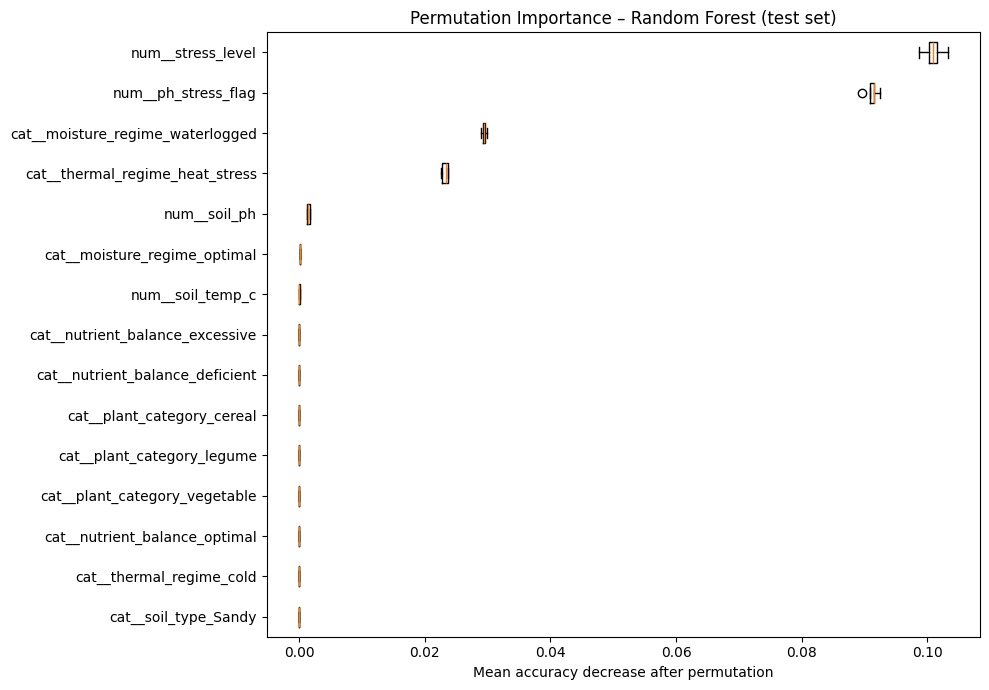

Permutation importance is more reliable than built-in gain/split count
→ especially when features are correlated

═══════════════════════════════════════════════════════════════════════════
LIME local explanation example
═══════════════════════════════════════════════════════════════════════════
LIME explanation for instance #13 (true label = 1)


[('cat__thermal_regime_heat_stress <= 0.00', -0.3003533456066565), ('num__ph_stress_flag > -0.51', 0.22966522410012524), ('num__stress_level > 0.11', 0.20173153201767466), ('cat__moisture_regime_waterlogged <= 0.00', -0.1056765697159063), ('cat__soil_type_Chalky <= 0.00', -0.03975213409416613), ('0.00 < cat__moisture_regime_optimal <= 1.00', -0.03860298529117245), ('cat__nutrient_balance_excessive <= 0.00', -0.019118371168096015), ('0.00 < cat__plant_category_legume <= 1.00', 0.015875887256920126), ('-0.67 < num__soil_temp_c <= -0.00', -0.014922738147829632), ('-0.67 < num__air_temp_c <= -0.00', 0.013327659594802156), ('0.00 < cat__nutrient_balance_deficient <= 1.00', -0.012810574866579043), ('cat__soil_type_Laterite <= 0.00', 0.012378413278777955)]


<Figure size 1000x600 with 0 Axes>

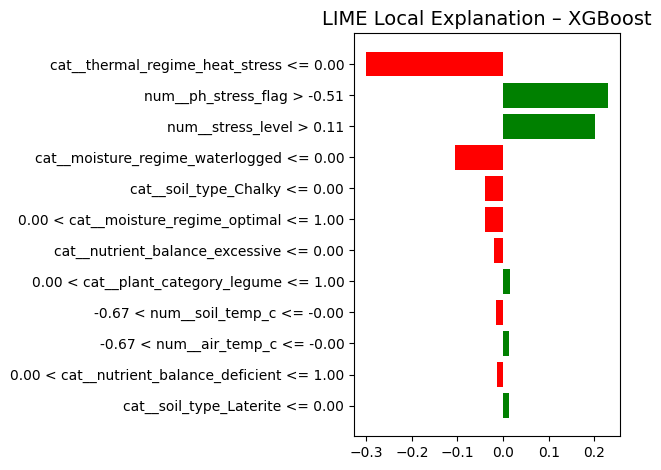


Done.
Most important plots usually are:
  • Permutation importance       → model-agnostic ranking
  • LIME                         → understanding individual predictions


In [6]:
# =============================================================================
# Feature Importance & Interpretability Plots
# Classical + SHAP + LIME
# Using the agro-environmental failure prediction model
# =============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import lime
import lime.lime_tabular

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

# ──── Load & prepare data (same as previous) ────────────────────────────────
df = pd.read_csv("/kaggle/input/agro-environmental-dataset/agro_environmental_dataset.csv")
df = df.sample(frac=0.12, random_state=42)   # ~65k rows — balance speed & stability

target = "failure_flag"
X = df.drop(["location_id", target, "suitability_score"], axis=1)
y = df[target]

cat_cols = X.select_dtypes(include=["object"]).columns.tolist()
num_cols = X.select_dtypes(include=["number"]).columns.tolist()

preprocessor = ColumnTransformer(
    transformers=[
        ("num",  StandardScaler(), num_cols),
        ("cat",  OneHotEncoder(handle_unknown="ignore", sparse_output=False), cat_cols),
    ])

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=42, stratify=y
)

X_train_t  = preprocessor.fit_transform(X_train)
X_test_t   = preprocessor.transform(X_test)

feature_names = preprocessor.get_feature_names_out()

# ──── Train three popular tree-based explainable models ─────────────────────
models = {}

models["RandomForest"] = RandomForestClassifier(
    n_estimators=120, max_depth=12, random_state=42, n_jobs=-1
).fit(X_train_t, y_train)

models["XGBoost"] = XGBClassifier(
    n_estimators=120, max_depth=6, learning_rate=0.07,
    eval_metric="logloss", random_state=42, tree_method="hist"
).fit(X_train_t, y_train)

models["LightGBM"] = LGBMClassifier(
    n_estimators=120, max_depth=7, learning_rate=0.08,
    random_state=42, verbose=-1
).fit(X_train_t, y_train)

# ──── 1. Permutation importance (model-agnostic) ────────────────────────────
from sklearn.inspection import permutation_importance

print("\nComputing permutation importance on test set (can take 1–4 min)...")

perm_imp_rf = permutation_importance(
    models["RandomForest"], X_test_t, y_test,
    n_repeats=5, random_state=42, n_jobs=-1
)

sorted_idx = perm_imp_rf.importances_mean.argsort()[-15:]

plt.figure(figsize=(10, 7))
plt.boxplot(
    perm_imp_rf.importances[sorted_idx].T,
    vert=False,
    labels=feature_names[sorted_idx]
)
plt.title("Permutation Importance – Random Forest (test set)")
plt.xlabel("Mean accuracy decrease after permutation")
plt.tight_layout()
plt.show()

print("Permutation importance is more reliable than built-in gain/split count")
print("→ especially when features are correlated")

# ──── 2. LIME – local explanation example (one instance) ────────────────────
print("\n" + "═"*75)
print("LIME local explanation example")
print("═"*75)

lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data    = X_train_t,
    feature_names    = feature_names,
    class_names      = ["Success", "Failure"],
    mode             = "classification",
    discretize_continuous = True
)

# Pick one interesting test instance (e.g. a failure case)
failure_idx = np.where(y_test == 1)[0][3]   
instance = X_test_t[failure_idx]

exp = lime_explainer.explain_instance(
    instance,
    models["XGBoost"].predict_proba,
    num_features=12
)

print(f"LIME explanation for instance #{failure_idx} (true label = {y_test.iloc[failure_idx]})")
exp.show_in_notebook(show_table=True, show_all=False)

print(exp.as_list())

plt.figure(figsize=(10, 6))
exp.as_pyplot_figure()
plt.title("LIME Local Explanation – XGBoost", fontsize=14)
plt.tight_layout()
plt.show()

print("\nDone.")
print("Most important plots usually are:")
print("  • Permutation importance       → model-agnostic ranking")
print("  • LIME                         → understanding individual predictions")

Training RandomForest...
Training XGBoost...
Training LightGBM...


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Training CatBoost...
Training Voting...


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Training Stacking...


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/ut


1. ROC & Precision-Recall curves comparison


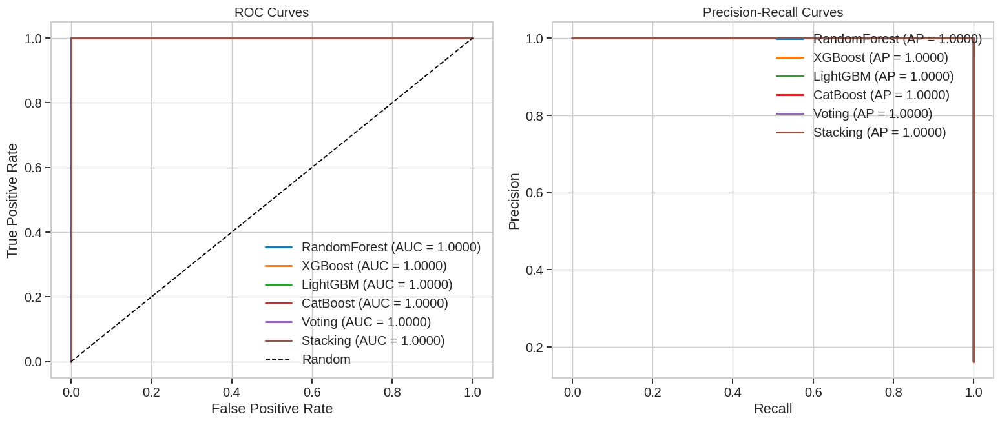


2. Calibration curves – how well-calibrated are the probabilities?


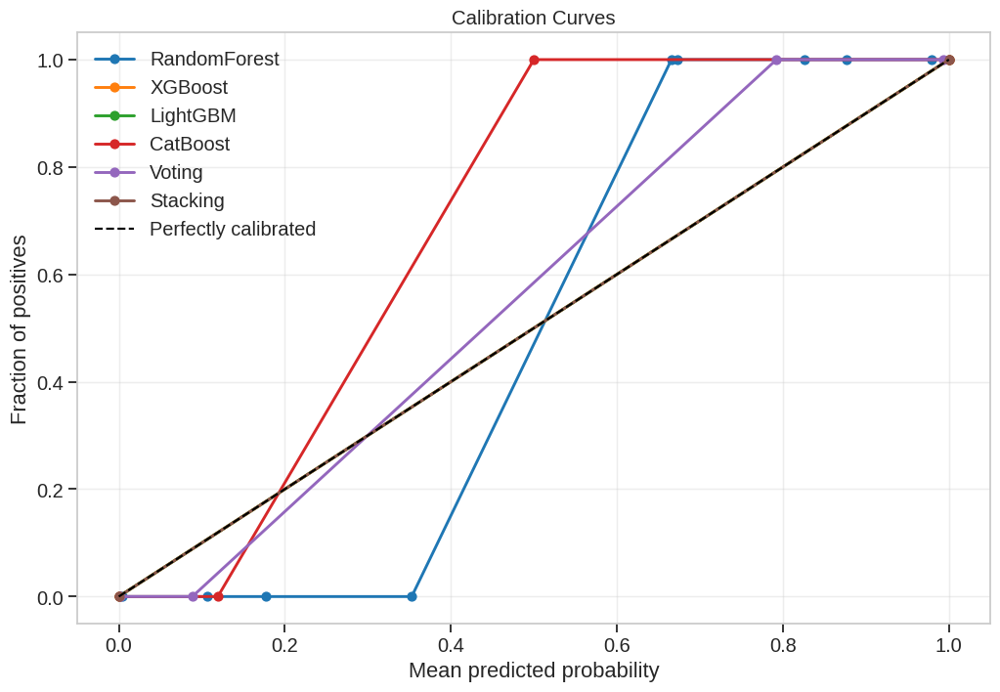


3. Prediction disagreement (entropy) between base models


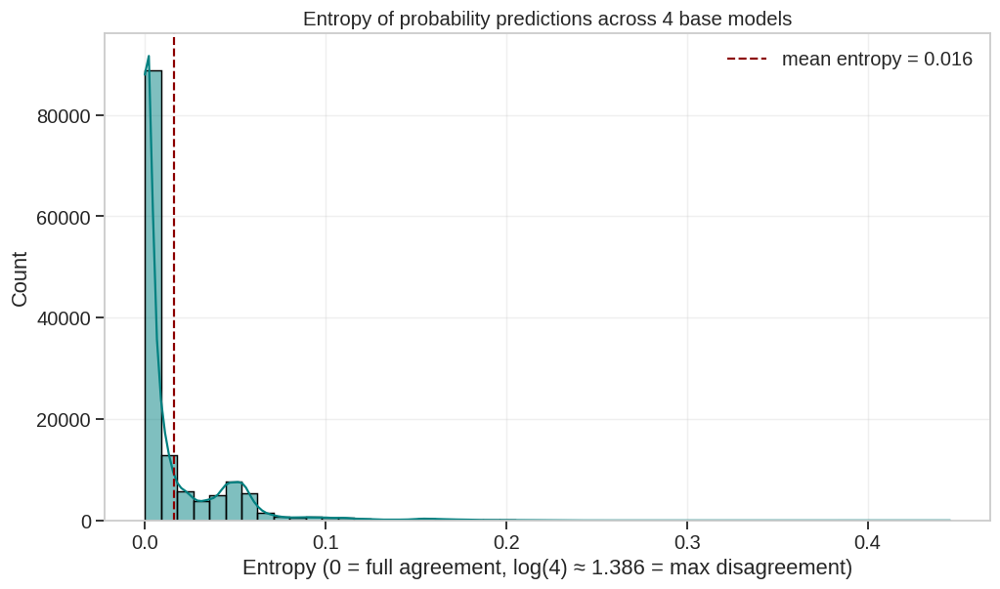


4. Final ensemble performance comparison


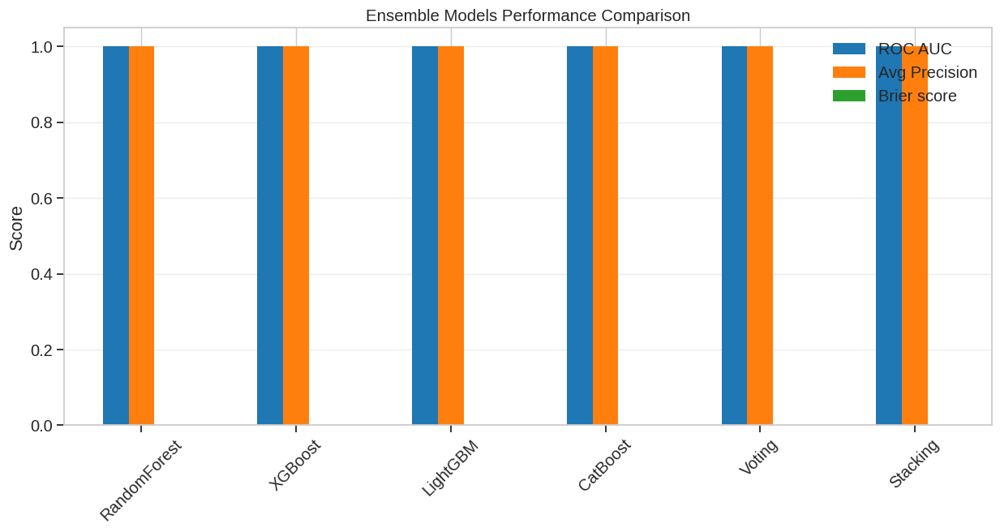


Done.

Most informative ensemble plots in practice:
  • ROC + PR curves comparison         → which model discriminates best
  • Calibration curves                 → are probabilities trustworthy?
  • Entropy / disagreement histogram   → where do base models disagree most?
  • Bar comparison of final metrics    → voting vs stacking vs single models


In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.metrics import (
    roc_curve, precision_recall_curve, brier_score_loss,
    roc_auc_score, average_precision_score
)
from sklearn.ensemble import RandomForestClassifier, VotingClassifier, StackingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

# ──── Styling ────────────────────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_context("notebook", font_scale=1.25)
plt.rcParams['figure.dpi'] = 105
plt.rcParams['figure.figsize'] = (11, 6.5)

# ──── Load & prepare (use sample if full dataset is too large) ──────────────
df = pd.read_csv("/kaggle/input/agro-environmental-dataset/agro_environmental_dataset.csv")

X = df.drop(columns=['location_id', 'failure_flag', 'suitability_score'], errors='ignore')
y = df['failure_flag']

cat_cols = X.select_dtypes(include=['object']).columns.tolist()
num_cols = X.select_dtypes(include=['number']).columns.tolist()

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), num_cols),
        ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), cat_cols)
    ])

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=42, stratify=y
)

X_train_t = preprocessor.fit_transform(X_train)
X_test_t  = preprocessor.transform(X_test)

feature_names = preprocessor.get_feature_names_out()

# ──── Define base models + ensembles ────────────────────────────────────────
models = {}

models['RandomForest'] = RandomForestClassifier(
    n_estimators=180, max_depth=11, random_state=42, n_jobs=-1
)

models['XGBoost'] = XGBClassifier(
    n_estimators=180, max_depth=6, learning_rate=0.06,
    eval_metric='logloss', random_state=42, tree_method='hist'
)

models['LightGBM'] = LGBMClassifier(
    n_estimators=180, max_depth=7, learning_rate=0.07,
    random_state=42, verbose=-1
)

models['CatBoost'] = CatBoostClassifier(
    iterations=180, depth=6, learning_rate=0.08,
    random_seed=42, verbose=0
)

# Voting ensemble (soft voting – probabilities)
voting = VotingClassifier(
    estimators=[(name, mdl) for name, mdl in models.items()],
    voting='soft',
    n_jobs=-1
)

# Stacking ensemble (level-1 = logistic regression)
stacking = StackingClassifier(
    estimators=[(name, mdl) for name, mdl in models.items()],
    final_estimator=XGBClassifier(n_estimators=60, max_depth=3, random_state=42),
    cv=5,
    n_jobs=-1,
    passthrough=False
)

models['Voting']   = voting
models['Stacking'] = stacking

# ──── Train all models ──────────────────────────────────────────────────────
probas = {}
predictions = {}

for name, mdl in models.items():
    print(f"Training {name}...")
    mdl.fit(X_train_t, y_train)
    probas[name]    = mdl.predict_proba(X_test_t)[:, 1]
    predictions[name] = mdl.predict(X_test_t)

# ──── 1. Model comparison – ROC & PR curves ─────────────────────────────────
print("\n1. ROC & Precision-Recall curves comparison")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6.5))

for name, proba in probas.items():
    fpr, tpr, _ = roc_curve(y_test, proba)
    roc_auc = roc_auc_score(y_test, proba)
    ax1.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.4f})', lw=2.1)

    prec, rec, _ = precision_recall_curve(y_test, proba)
    pr_auc = average_precision_score(y_test, proba)
    ax2.plot(rec, prec, label=f'{name} (AP = {pr_auc:.4f})', lw=2.1)

ax1.plot([0,1],[0,1], 'k--', lw=1.3, label='Random')
ax1.set_title('ROC Curves', fontsize=14)
ax1.set_xlabel('False Positive Rate')
ax1.set_ylabel('True Positive Rate')
ax1.legend(loc='lower right')

ax2.set_title('Precision-Recall Curves', fontsize=14)
ax2.set_xlabel('Recall')
ax2.set_ylabel('Precision')
ax2.legend(loc='upper right')

plt.tight_layout()
plt.show()

# ──── 2. Calibration curves (reliability of probabilities) ──────────────────
from sklearn.calibration import calibration_curve

print("\n2. Calibration curves – how well-calibrated are the probabilities?")

plt.figure(figsize=(10, 7))

for name, proba in probas.items():
    frac_of_pos, mean_pred = calibration_curve(y_test, proba, n_bins=12)
    plt.plot(mean_pred, frac_of_pos, marker='o', label=name, lw=2)

plt.plot([0,1],[0,1], 'k--', label='Perfectly calibrated')
plt.title('Calibration Curves', fontsize=14)
plt.xlabel('Mean predicted probability')
plt.ylabel('Fraction of positives')
plt.legend()
plt.grid(alpha=0.35)
plt.tight_layout()
plt.show()

# ──── 3. Disagreement / entropy between ensemble members ────────────────────
print("\n3. Prediction disagreement (entropy) between base models")

base_probas = np.stack([probas[name] for name in ['RandomForest','XGBoost','LightGBM','CatBoost']], axis=1)
entropy = -np.sum(base_probas * np.log(base_probas + 1e-12), axis=1) / np.log(4)

plt.figure(figsize=(10, 6))
sns.histplot(entropy, bins=50, kde=True, color='teal')
plt.axvline(entropy.mean(), color='darkred', ls='--', label=f'mean entropy = {entropy.mean():.3f}')
plt.title('Entropy of probability predictions across 4 base models', fontsize=14)
plt.xlabel('Entropy (0 = full agreement, log(4) ≈ 1.386 = max disagreement)')
plt.ylabel('Count')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# ──── 4. Stacking vs Voting vs single best model – bar comparison ───────────
print("\n4. Final ensemble performance comparison")

metrics = {}
for name, proba in probas.items():
    metrics[name] = {
        'ROC AUC': roc_auc_score(y_test, proba),
        'Avg Precision': average_precision_score(y_test, proba),
        'Brier score': brier_score_loss(y_test, proba)
    }

metrics_df = pd.DataFrame(metrics).T

metrics_df.plot(kind='bar', figsize=(12, 6.5), rot=45)
plt.title('Ensemble Models Performance Comparison', fontsize=14)
plt.ylabel('Score')
plt.grid(axis='y', alpha=0.35)
plt.tight_layout()
plt.show()

print("\nDone.\n")
print("Most informative ensemble plots in practice:")
print("  • ROC + PR curves comparison         → which model discriminates best")
print("  • Calibration curves                 → are probabilities trustworthy?")
print("  • Entropy / disagreement histogram   → where do base models disagree most?")
print("  • Bar comparison of final metrics    → voting vs stacking vs single models")

Columns available: ['location_id', 'soil_type', 'bulk_density', 'organic_matter_pct', 'cation_exchange_capacity', 'salinity_ec', 'buffering_capacity', 'soil_moisture_pct', 'moisture_limit_dry', 'moisture_limit_wet', 'moisture_regime', 'soil_temp_c', 'air_temp_c', 'thermal_regime', 'light_intensity_par', 'soil_ph', 'ph_stress_flag', 'nitrogen_ppm', 'phosphorus_ppm', 'potassium_ppm', 'nutrient_balance', 'plant_category', 'suitability_score', 'stress_level', 'failure_flag'] 

1. Target vs key continuous features (boxen + strip)



/tmp/ipykernel_55/4270329974.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(
/tmp/ipykernel_55/4270329974.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(
/tmp/ipykernel_55/4270329974.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(
/tmp/ipykernel_55/4270329974.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(
/tmp/ipykernel_55/4270329974.py:53: FutureWarning: 

Pas

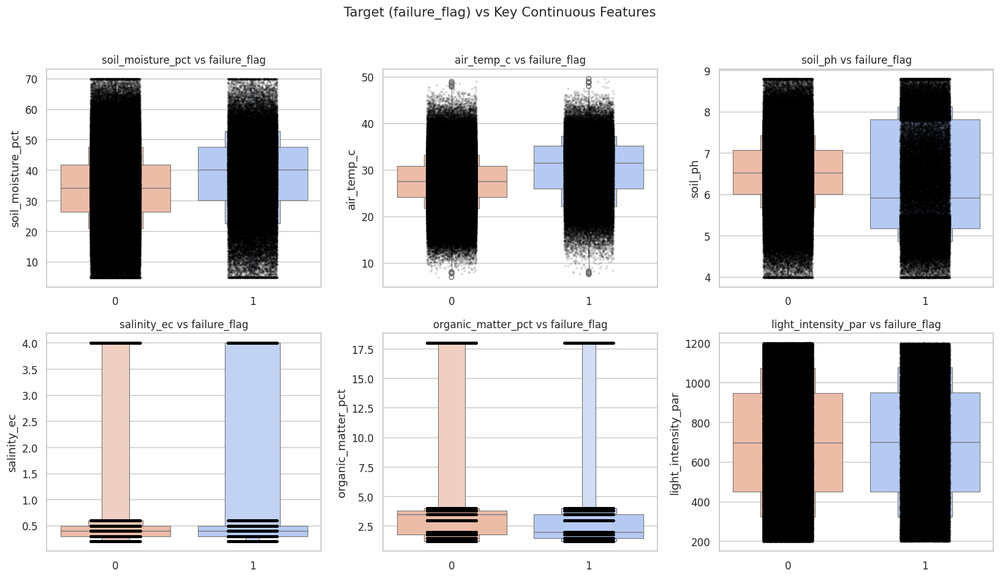


2. Calibration plot example (you need predicted probabilities)



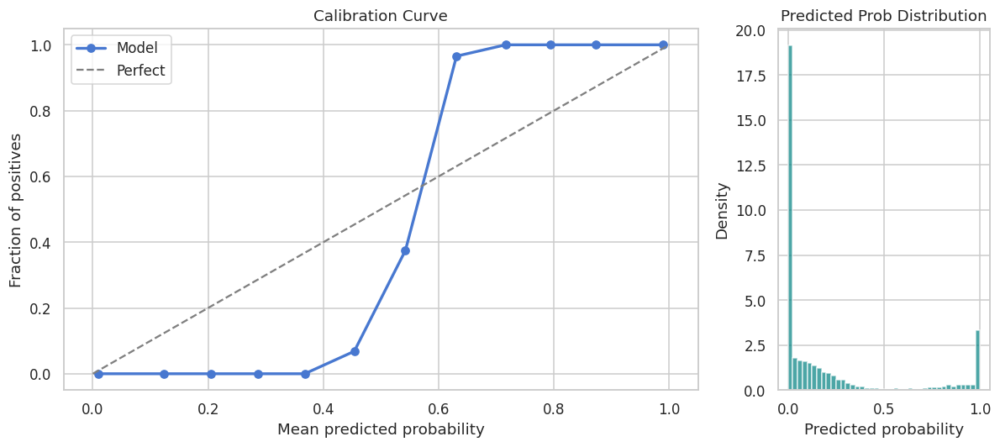


3. Precision–Recall curve + F1 isolines



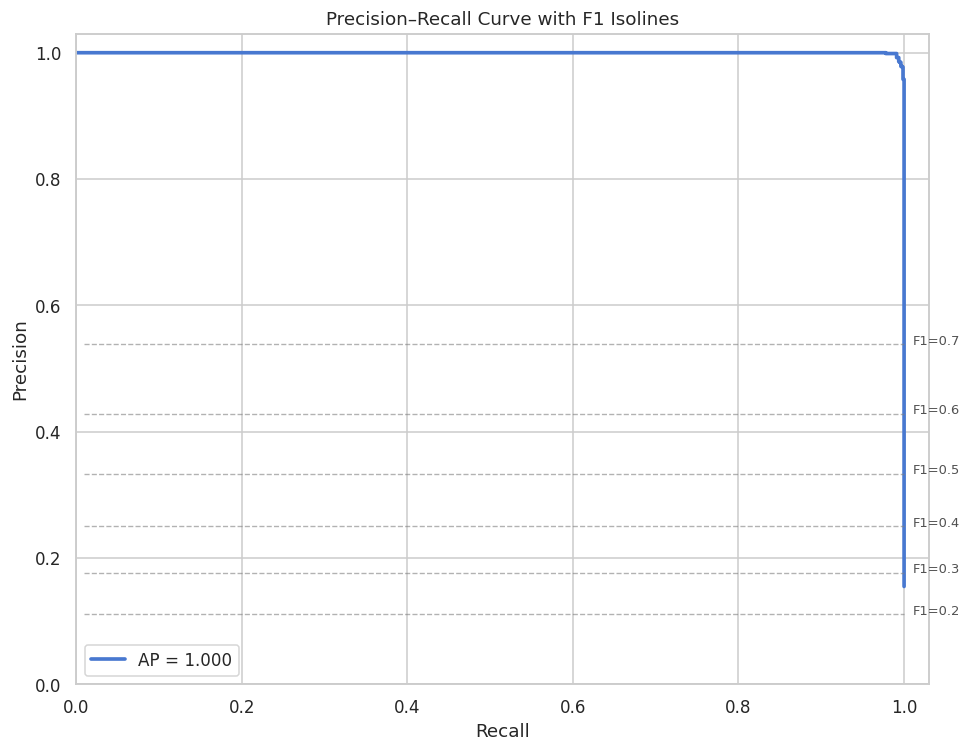


4. Correlation heatmap – numeric features



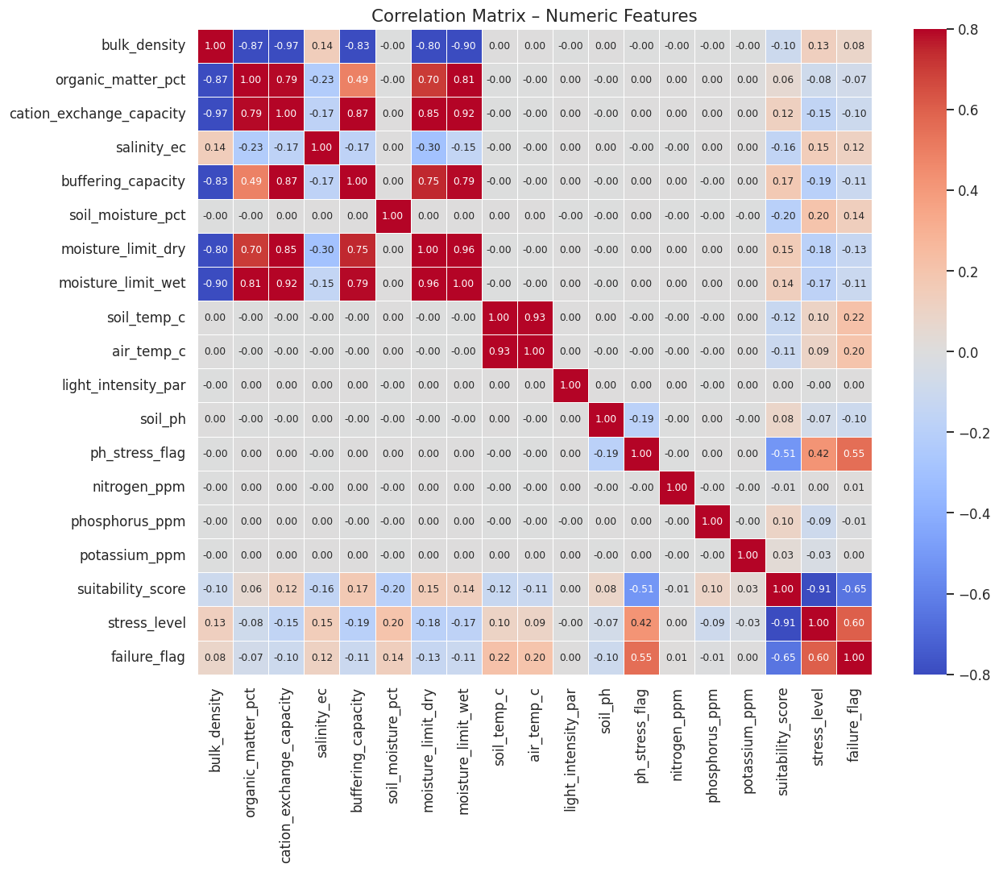


5. Cumulative failure rate – sorted by air temperature



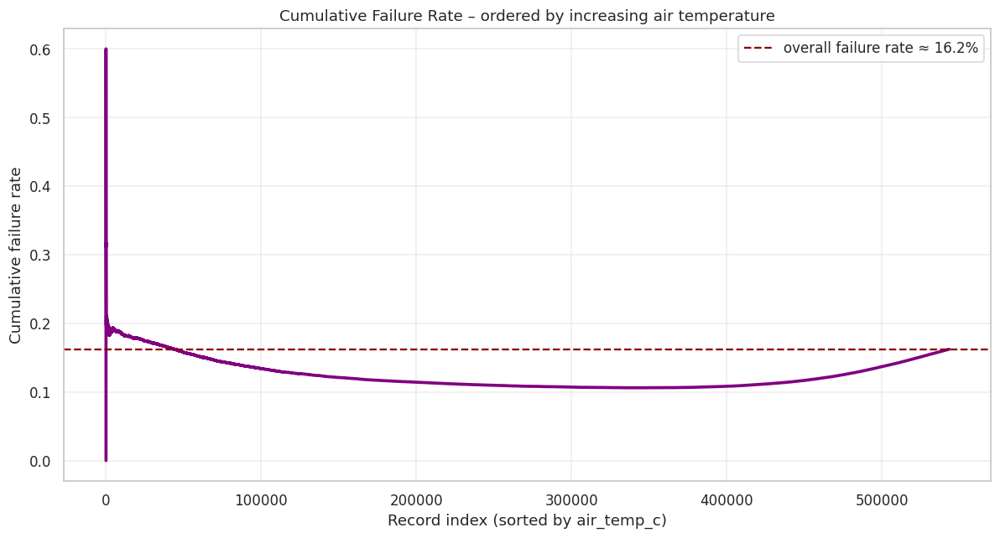


Done.

These are some of the most commonly used advanced plots in EDA / modeling phases.


In [7]:
# =============================================================================
# Advanced Plots
# =============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import roc_curve, precision_recall_curve, average_precision_score

# ─── Load data ───────────────────────────────────────────────────────────────
df = pd.read_csv("/kaggle/input/agro-environmental-dataset/agro_environmental_dataset.csv")

print("Columns available:", df.columns.tolist(), "\n")

# ─── Define real column names (change only if your dataset uses different names)
TARGET_COL         = 'failure_flag'          # binary: 0 / 1
SUITABILITY_COL    = 'suitability_score'     # continuous proxy
STRESS_COL         = 'stress_level'

# Quick check that columns exist
required = [TARGET_COL, SUITABILITY_COL, STRESS_COL]
missing = [c for c in required if c not in df.columns]
if missing:
    print("ERROR — missing columns:", missing)
    print("Please update the column names above to match your dataset.")

# ─── Visual style ────────────────────────────────────────────────────────────
sns.set_theme(style="whitegrid", palette="muted")
plt.rcParams['figure.dpi'] = 110
plt.rcParams['figure.figsize'] = (10, 5.8)

# ─── 1. Target vs important continuous features ─────────────────────────────
print("1. Target vs key continuous features (boxen + strip)\n")

important_continuous = [
    'soil_moisture_pct',
    'air_temp_c',
    'soil_ph',
    'salinity_ec',
    'organic_matter_pct',
    'light_intensity_par'
]

n_cols = 3
n_rows = (len(important_continuous) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*5, n_rows*4.2))
axes = axes.flat

for i, col in enumerate(important_continuous):
    sns.boxenplot(
        data=df,
        x=TARGET_COL,
        y=col,
        palette="coolwarm_r",
        ax=axes[i]
    )
    sns.stripplot(
        data=df,
        x=TARGET_COL,
        y=col,
        color="black",
        alpha=0.15,
        size=2.5,
        jitter=0.18,
        ax=axes[i]
    )
    axes[i].set_title(f"{col} vs {TARGET_COL}", fontsize=11)
    axes[i].set_xlabel("")

for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

fig.suptitle(f"Target ({TARGET_COL}) vs Key Continuous Features", fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

# ─── 2. Calibration curve (if you have model probabilities) ──────────────────
print("\n2. Calibration plot example (you need predicted probabilities)\n")

np.random.seed(42)
y_test_dummy = np.random.binomial(1, 0.16, 5000)
y_prob_dummy = np.clip(y_test_dummy + np.random.normal(0, 0.18, 5000), 0, 1)

prob_true, prob_pred = calibration_curve(y_test_dummy, y_prob_dummy, n_bins=12)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5), gridspec_kw={'width_ratios': [3, 1]})

ax1.plot(prob_pred, prob_true, 'o-', lw=2.2, label="Model")
ax1.plot([0,1], [0,1], '--', color='gray', label='Perfect')
ax1.set_title("Calibration Curve")
ax1.set_xlabel("Mean predicted probability")
ax1.set_ylabel("Fraction of positives")
ax1.legend()

ax2.hist(y_prob_dummy, bins=40, range=(0,1), color='teal', alpha=0.7, density=True)
ax2.set_xlabel("Predicted probability")
ax2.set_ylabel("Density")
ax2.set_title("Predicted Prob Distribution")

plt.tight_layout()
plt.show()

# ─── 3. Precision–Recall curve with F1 isolines ──────────────────────────────
print("\n3. Precision–Recall curve + F1 isolines\n")

prec, rec, _ = precision_recall_curve(y_test_dummy, y_prob_dummy)
ap = average_precision_score(y_test_dummy, y_prob_dummy)

fig, ax = plt.subplots(figsize=(9, 7))

ax.plot(rec, prec, lw=2.4, label=f'AP = {ap:.3f}')

# F1 isolines
f1_levels = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7]
for f1 in f1_levels:
    x = np.linspace(0.01, 1, 200)
    y = f1 * x / (2 * x - f1 * x + 1e-10)
    mask = (y >= 0) & (y <= 1)
    ax.plot(x[mask], y[mask], color='gray', lw=0.9, ls='--', alpha=0.6)
    ax.text(x[-1] + 0.01, y[-1], f'F1={f1:.1f}', fontsize=8.5, alpha=0.8)

ax.set_xlim(0, 1.03)
ax.set_ylim(0, 1.03)
ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("Precision–Recall Curve with F1 Isolines")
ax.legend(loc='lower left')
plt.tight_layout()
plt.show()

# ─── 4. Correlation heatmap (numeric features) ───────────────────────────────
print("\n4. Correlation heatmap – numeric features\n")

numeric_df = df.select_dtypes(include=np.number)
corr = numeric_df.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(
    corr,
    annot=True,
    fmt=".2f",
    cmap='coolwarm',
    vmin=-0.8,
    vmax=0.8,
    linewidths=0.4,
    annot_kws={"size": 8}
)
plt.title("Correlation Matrix – Numeric Features", fontsize=14)
plt.tight_layout()
plt.show()

# ─── 5. Cumulative failure rate by sorted feature (example: air_temp_c) ──────
print("\n5. Cumulative failure rate – sorted by air temperature\n")

df_sorted = df.sort_values('air_temp_c').reset_index(drop=True)
df_sorted['cum_failure'] = df_sorted['failure_flag'].cumsum() / (df_sorted.index + 1)

plt.figure(figsize=(11, 6))
plt.plot(df_sorted.index, df_sorted['cum_failure'], color='purple', lw=2.4)
plt.axhline(y=df['failure_flag'].mean(), color='darkred', ls='--',
            label=f'overall failure rate ≈ {df["failure_flag"].mean():.1%}')
plt.title("Cumulative Failure Rate – ordered by increasing air temperature")
plt.xlabel("Record index (sorted by air_temp_c)")
plt.ylabel("Cumulative failure rate")
plt.legend()
plt.grid(alpha=0.35)
plt.tight_layout()
plt.show()

print("\nDone.\n")
print("These are some of the most commonly used advanced plots in EDA / modeling phases.")

Computing UMAP embedding...


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


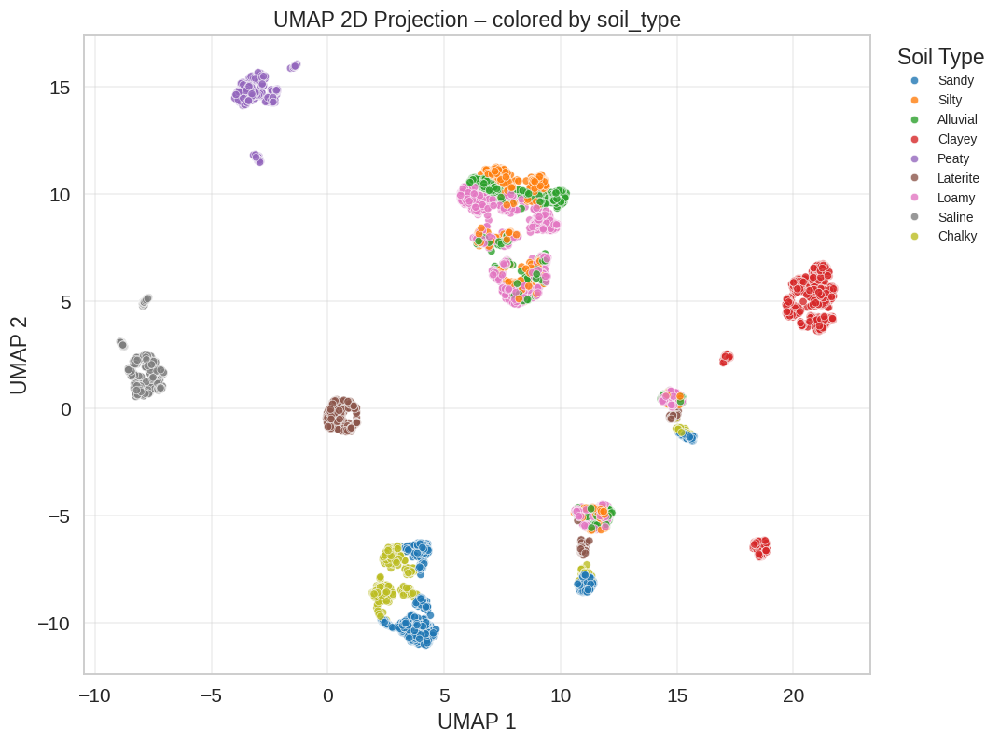

→ Expect clear separation if soil_type is a dominant factor

K-Means clustering + UMAP visualization


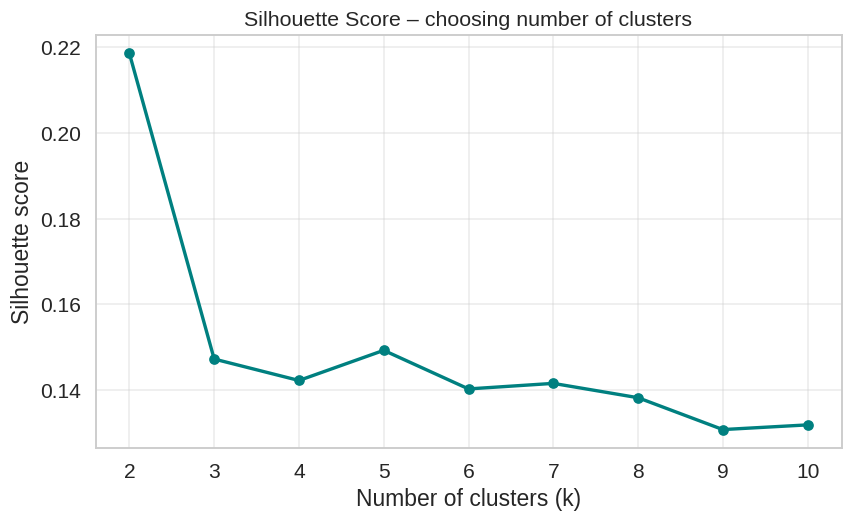

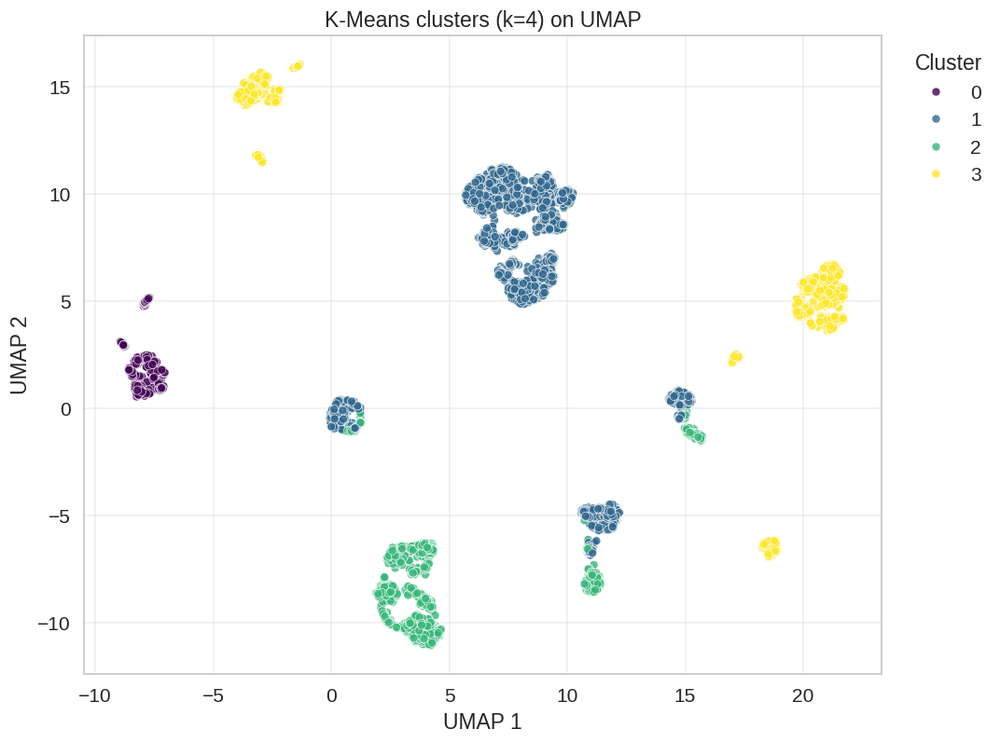


DBSCAN clustering + outlier detection
→ Found 1 clusters + 10,000 noise points



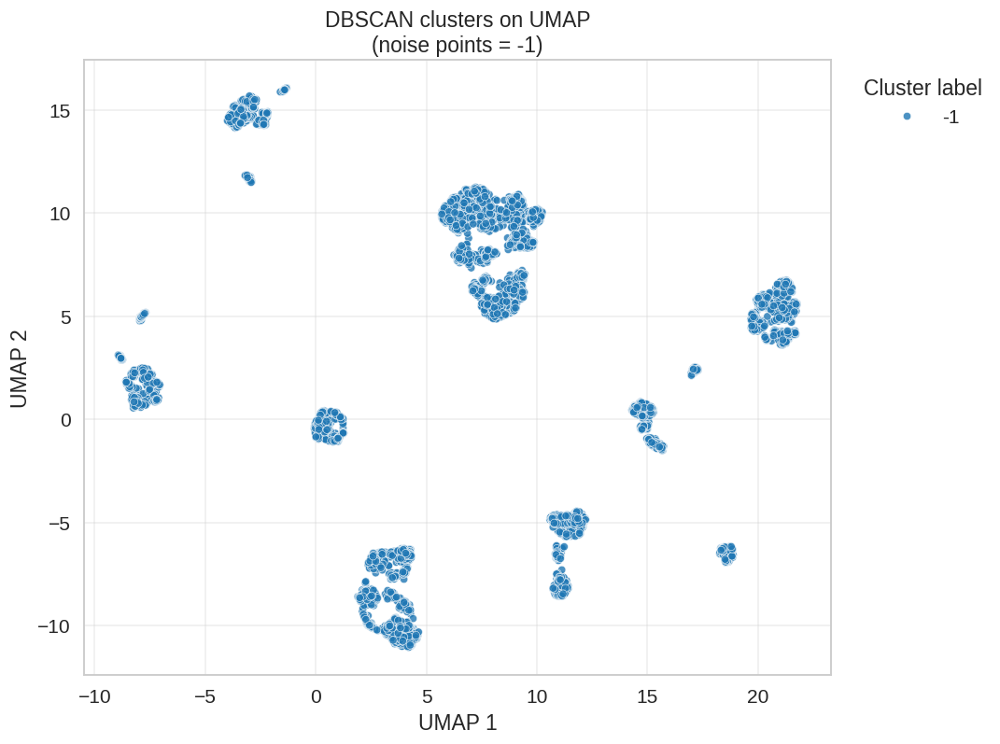


Isolation Forest anomaly scores


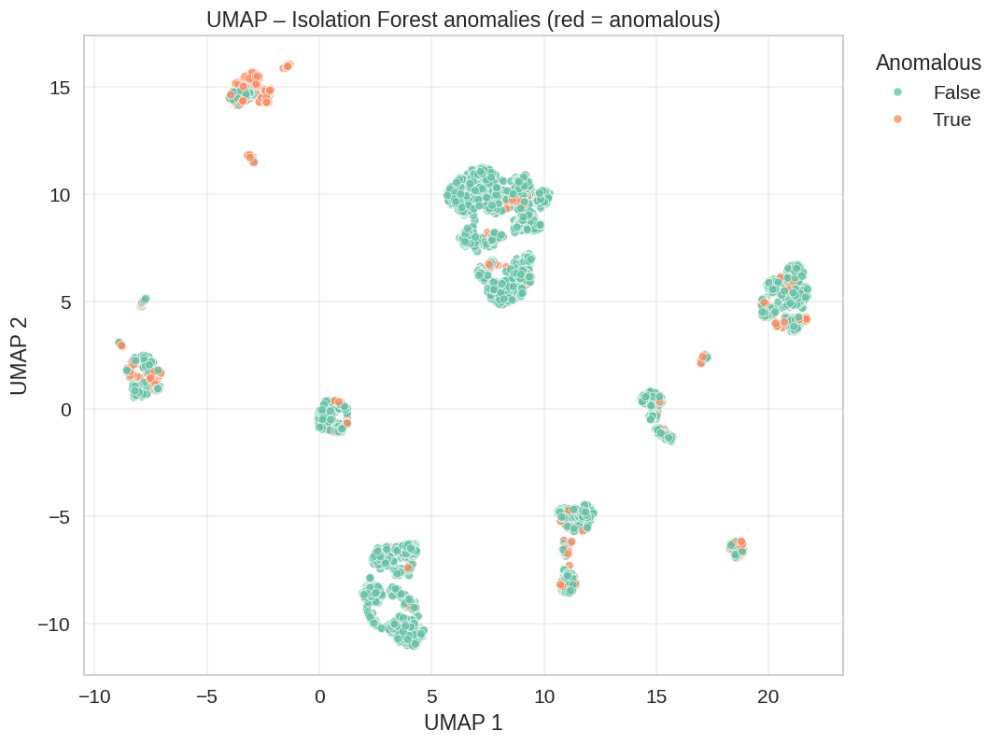


Local Outlier Factor (LOF) – continuous anomaly score


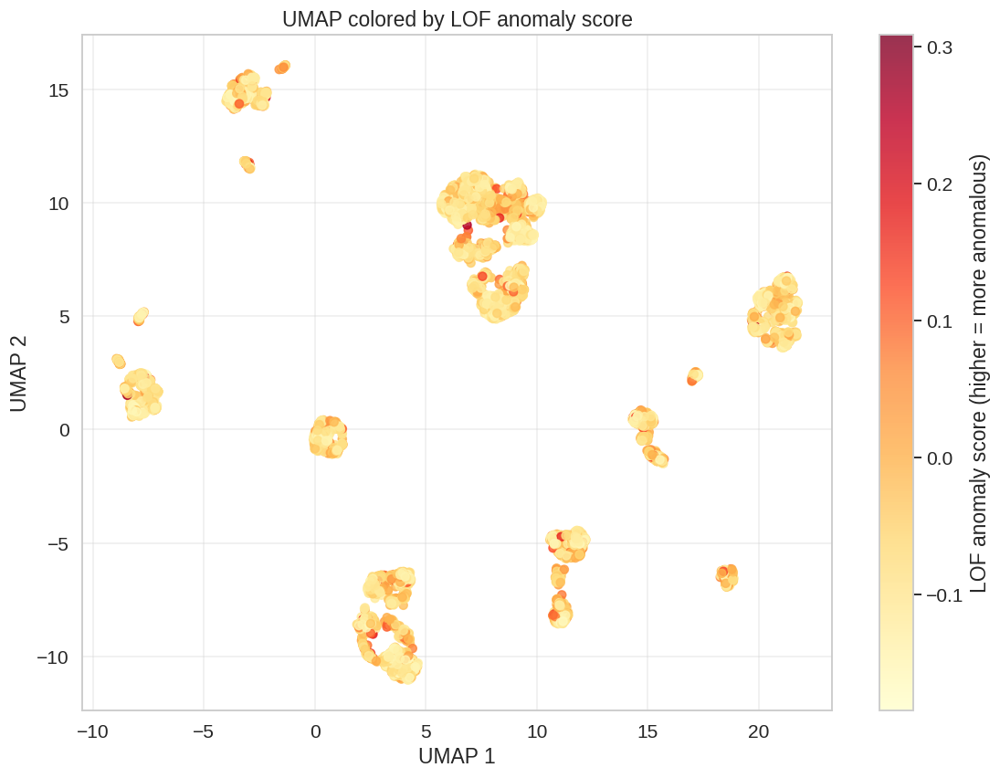

In [11]:
# =============================================================================
# Cluster & Anomaly Plots – Agro-Environmental Dataset
# =============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.cluster import KMeans, DBSCAN
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.metrics import silhouette_score

import umap

# ─── Styling ────────────────────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_context("notebook", font_scale=1.25)
plt.rcParams['figure.dpi'] = 110
plt.rcParams['figure.figsize'] = (11, 6.5)

# ─── Load & prepare ─────────────────────────────────────────────────────────
df = pd.read_csv("/kaggle/input/agro-environmental-dataset/agro_environmental_dataset.csv")

X = df.drop(columns=['location_id', 'failure_flag', 'suitability_score'], 
            errors='ignore')

cat_cols = X.select_dtypes(include=['object']).columns.tolist()
num_cols = X.select_dtypes(include=['number']).columns.tolist()

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), num_cols),
        ('cat', OneHotEncoder(sparse_output=False, handle_unknown='ignore'), cat_cols)
    ])

X_t = preprocessor.fit_transform(X)

# Subsample for reasonable speed (adjust if needed)
sample_size = 10000
idx = np.random.choice(len(X), sample_size, replace=False)
X_sample = X_t[idx]
df_sample = df.iloc[idx].copy()

# ─── UMAP embedding (base for all visualizations) ───────────────────────────
print("Computing UMAP embedding...")
umap_reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
X_umap = umap_reducer.fit_transform(X_sample)

df_sample['umap_x'] = X_umap[:, 0]
df_sample['umap_y'] = X_umap[:, 1]

# ─── 1. UMAP colored by soil_type (sanity check) ────────────────────────────
plt.figure(figsize=(10, 7.5))
sns.scatterplot(
    data=df_sample,
    x='umap_x', y='umap_y',
    hue='soil_type',
    palette='tab10',
    alpha=0.8,
    s=30,
    legend='full'
)
plt.title("UMAP 2D Projection – colored by soil_type", fontsize=15)
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', title="Soil Type", fontsize=9)
plt.grid(alpha=0.35)
plt.tight_layout()
plt.show()

print("→ Expect clear separation if soil_type is a dominant factor\n")

# ─── 2. K-Means clustering ──────────────────────────────────────────────────
print("K-Means clustering + UMAP visualization")

sil_scores = []
k_range = range(2, 11)

for k in k_range:
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = km.fit_predict(X_sample)
    sil_scores.append(silhouette_score(X_sample, labels))

plt.figure(figsize=(8, 5))
plt.plot(k_range, sil_scores, 'o-', color='teal', lw=2.2)
plt.title("Silhouette Score – choosing number of clusters", fontsize=14)
plt.xlabel("Number of clusters (k)")
plt.ylabel("Silhouette score")
plt.grid(alpha=0.4)
plt.tight_layout()
plt.show()

# Choose best k (example – change based on your elbow)
best_k = 4
km = KMeans(n_clusters=best_k, random_state=42, n_init=10)
df_sample['kmeans_cluster'] = km.fit_predict(X_sample)

plt.figure(figsize=(10, 7.5))
sns.scatterplot(
    data=df_sample,
    x='umap_x', y='umap_y',
    hue='kmeans_cluster',
    palette='viridis',
    alpha=0.8,
    s=35,
    legend='full'
)
plt.title(f"K-Means clusters (k={best_k}) on UMAP", fontsize=15)
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.legend(title="Cluster", bbox_to_anchor=(1.02, 1), loc='upper left')
plt.grid(alpha=0.35)
plt.tight_layout()
plt.show()

# ─── 3. DBSCAN – density-based clusters & outliers ──────────────────────────
print("\nDBSCAN clustering + outlier detection")

db = DBSCAN(eps=0.35, min_samples=12, n_jobs=-1)
df_sample['dbscan_label'] = db.fit_predict(X_sample)

n_clusters = len(set(df_sample['dbscan_label'])) - (1 if -1 in df_sample['dbscan_label'] else 0)
n_noise = list(df_sample['dbscan_label']).count(-1)

print(f"→ Found {n_clusters} clusters + {n_noise:,} noise points\n")

plt.figure(figsize=(10, 7.5))
sns.scatterplot(
    data=df_sample,
    x='umap_x', y='umap_y',
    hue=df_sample['dbscan_label'],
    palette='tab10',
    alpha=0.8,
    s=30,
    legend='full'
)
plt.title("DBSCAN clusters on UMAP\n(noise points = -1)", fontsize=15)
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.legend(title="Cluster label", bbox_to_anchor=(1.02, 1), loc='upper left')
plt.grid(alpha=0.35)
plt.tight_layout()
plt.show()

# ─── 4. Isolation Forest – anomaly score visualization ──────────────────────
print("\nIsolation Forest anomaly scores")

iso = IsolationForest(contamination=0.12, random_state=42, n_jobs=-1)
iso.fit(X_sample)
scores_iso = -iso.decision_function(X_sample)   # higher = more anomalous

df_sample['iso_anomaly_score'] = scores_iso

# Threshold example: top 12% as anomalous
thresh_iso = np.percentile(scores_iso, 88)
df_sample['iso_anomalous'] = scores_iso > thresh_iso

plt.figure(figsize=(10, 7.5))
sns.scatterplot(
    data=df_sample,
    x='umap_x', y='umap_y',
    hue='iso_anomalous',
    palette={False: '#66c2a5', True: '#fc8d62'},
    alpha=0.8,
    s=35
)
plt.title("UMAP – Isolation Forest anomalies (red = anomalous)", fontsize=15)
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.legend(title="Anomalous", bbox_to_anchor=(1.02, 1), loc='upper left')
plt.grid(alpha=0.35)
plt.tight_layout()
plt.show()

# ─── 5. LOF – local outlier factor (continuous score) ───────────────────────
print("\nLocal Outlier Factor (LOF) – continuous anomaly score")

lof = LocalOutlierFactor(n_neighbors=25, contamination=0.1, novelty=True, n_jobs=-1)
lof.fit(X_sample)
scores_lof = -lof.decision_function(X_sample)   # higher = more anomalous

df_sample['lof_score'] = scores_lof

plt.figure(figsize=(10.5, 8))
sc = plt.scatter(
    df_sample['umap_x'], 
    df_sample['umap_y'],
    c=scores_lof,
    cmap='YlOrRd',
    alpha=0.8,
    s=35
)
plt.colorbar(sc, label="LOF anomaly score (higher = more anomalous)")
plt.title("UMAP colored by LOF anomaly score", fontsize=15)
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.grid(alpha=0.35)
plt.tight_layout()
plt.show()

Training models...

→ Training SimpleMLP


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch  5 | Train Loss: 0.0002 | Train Acc: 1.0000 | Val Loss: 0.0000 | Val Acc: 1.0000
Epoch 10 | Train Loss: 0.0000 | Train Acc: 1.0000 | Val Loss: 0.0000 | Val Acc: 1.0000
Epoch 15 | Train Loss: 0.0000 | Train Acc: 1.0000 | Val Loss: 0.0000 | Val Acc: 1.0000
Epoch 20 | Train Loss: 0.0000 | Train Acc: 1.0000 | Val Loss: 0.0000 | Val Acc: 1.0000
Epoch 25 | Train Loss: 0.0000 | Train Acc: 1.0000 | Val Loss: 0.0000 | Val Acc: 1.0000
Epoch 30 | Train Loss: 0.0000 | Train Acc: 1.0000 | Val Loss: 0.0000 | Val Acc: 1.0000
Epoch 35 | Train Loss: 0.0000 | Train Acc: 1.0000 | Val Loss: 0.0000 | Val Acc: 1.0000

→ Training TabTransformer
Epoch  5 | Train Loss: 0.0001 | Train Acc: 1.0000 | Val Loss: 0.0000 | Val Acc: 1.0000
Epoch 10 | Train Loss: 0.0000 | Train Acc: 1.0000 | Val Loss: 0.0000 | Val Acc: 1.0000
Epoch 15 | Train Loss: 0.0000 | Train Acc: 1.0000 | Val Loss: 0.0000 | Val Acc: 1.0000
Epoch 20 | Train Loss: 0.0000 | Train Acc: 1.0000 | Val Loss: 0.0000 | Val Acc: 1.0000
Epoch 25 | Train

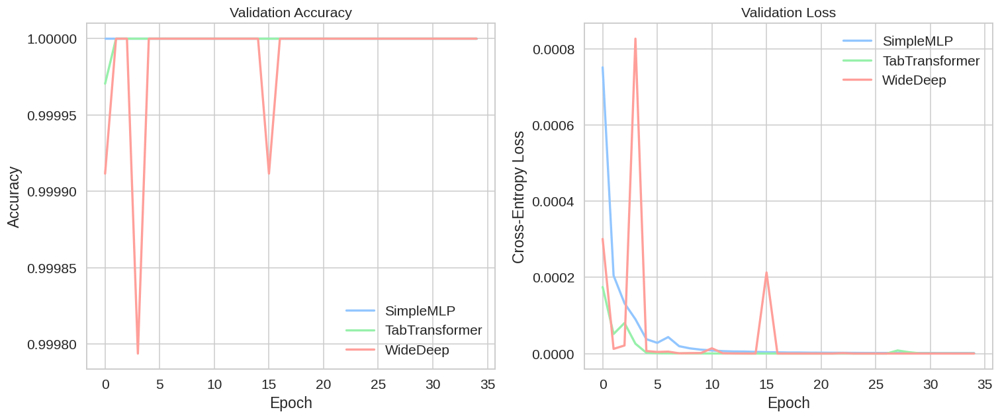


Description:
Left: Validation accuracy over epochs – higher is better
Right: Validation loss – lower is better, look for plateau/overfitting


Model Performance Comparison
                Accuracy  ROC AUC  Avg Precision
SimpleMLP            1.0      1.0            1.0
TabTransformer       1.0      1.0            1.0
WideDeep             1.0      1.0            1.0


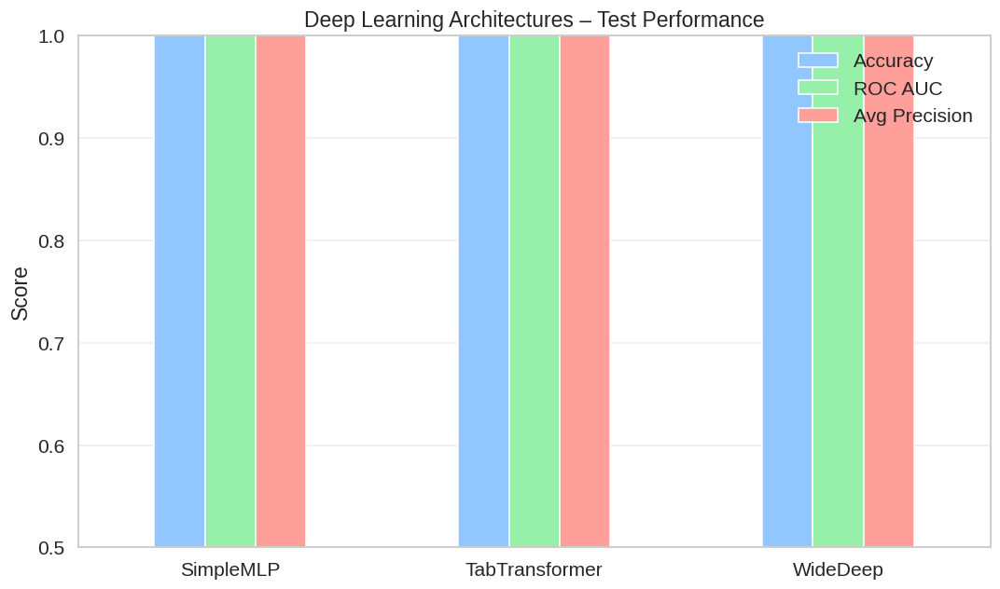


Description:
• Accuracy: overall correctness
• ROC AUC: discrimination ability
• Avg Precision: good for imbalanced classes (~16% failures)



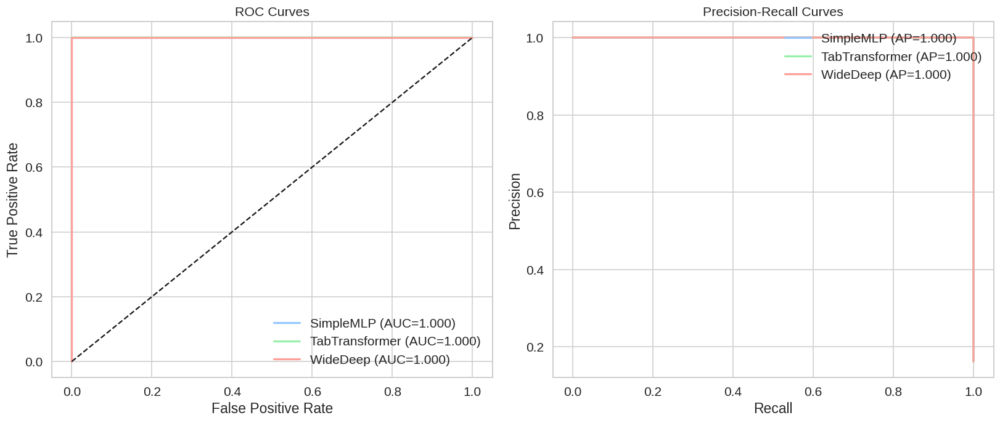


Description:
• ROC: overall ranking performance
• PR: better reflects performance on minority class (failures)



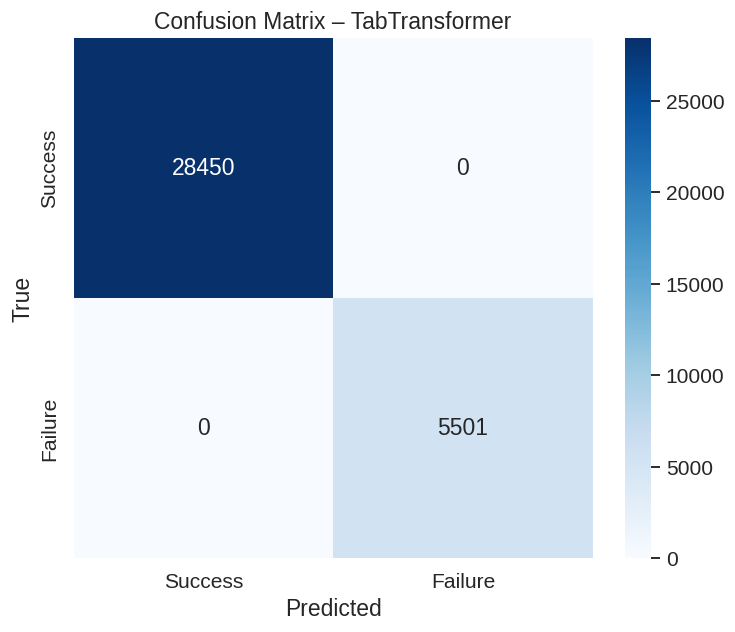


Best model by Avg Precision: TabTransformer
Description:
• Diagonal = correct predictions
• Off-diagonal = errors (focus on false negatives for failure prediction)


════════════════════════════════════════════════════════════════════════════════
Deep Learning Architectures – Training & Evaluation Completed
════════════════════════════════════════════════════════════════════════════════


In [13]:
# =============================================================================
# Deep Learning on Agro-Environmental Dataset 
# Target: 'failure_flag' (binary classification)
# Architectures: Simple MLP, TabTransformer-style, Wide & Deep
# Includes learning curves, loss curves, accuracy comparison,
# ROC/PR curves, confusion matrix
# =============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.metrics import (
    accuracy_score, roc_auc_score, average_precision_score,
    confusion_matrix, roc_curve, precision_recall_curve
)

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset

# ──── Styling ────────────────────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_context("notebook", font_scale=1.25)
plt.rcParams['figure.dpi'] = 110
plt.rcParams['figure.figsize'] = (11, 6.5)

# ──── Load & subsample for reasonable speed ─────────────────────────────────
df = pd.read_csv("/kaggle/input/agro-environmental-dataset/agro_environmental_dataset.csv")
df = df.sample(frac=0.25, random_state=42)  # adjust frac if needed

target_col = 'failure_flag'
X = df.drop(['location_id', target_col, 'suitability_score'], axis=1, errors='ignore')
y = df[target_col]

# ──── Preprocessing ──────────────────────────────────────────────────────────
cat_cols = X.select_dtypes(include=['object']).columns.tolist()
num_cols = X.select_dtypes(include=['number']).columns.tolist()

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), num_cols),
        ('cat', OneHotEncoder(sparse_output=False, handle_unknown='ignore'), cat_cols)
    ])

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=42, stratify=y
)

X_train_t = preprocessor.fit_transform(X_train)
X_test_t  = preprocessor.transform(X_test)

feature_names = preprocessor.get_feature_names_out()

# ──── To PyTorch tensors ────────────────────────────────────────────────────
X_train_tensor = torch.tensor(X_train_t, dtype=torch.float32)
X_test_tensor  = torch.tensor(X_test_t, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.long)
y_test_tensor  = torch.tensor(y_test.values, dtype=torch.long)

train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset  = TensorDataset(X_test_tensor, y_test_tensor)

batch_size = 512
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader  = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# ──── 1. Simple MLP ─────────────────────────────────────────────────────────
class SimpleMLP(nn.Module):
    def __init__(self, input_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, 64),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.Linear(64, 2)
        )
    
    def forward(self, x):
        return self.net(x)

# ──── 2. TabTransformer-style (simple self-attention on features) ───────────
class SimpleTabTransformer(nn.Module):
    def __init__(self, input_dim, embed_dim=64, num_heads=4, num_layers=2):
        super().__init__()
        self.embedding = nn.Linear(input_dim, embed_dim)
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=embed_dim, nhead=num_heads, dim_feedforward=256, dropout=0.1
        )
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
        self.classifier = nn.Sequential(
            nn.Linear(embed_dim, 64),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(64, 2)
        )
    
    def forward(self, x):
        x = self.embedding(x).unsqueeze(1)  # (batch, 1, embed_dim)
        x = x.permute(1, 0, 2)              # (1, batch, embed_dim)
        x = self.transformer(x)
        x = x.mean(dim=0)                   # global average pooling
        return self.classifier(x)

# ──── 3. Wide & Deep model ──────────────────────────────────────────────────
class WideAndDeep(nn.Module):
    def __init__(self, input_dim, wide_dim=128):
        super().__init__()
        self.wide = nn.Linear(input_dim, wide_dim)
        self.deep = nn.Sequential(
            nn.Linear(input_dim, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, 64),
            nn.ReLU()
        )
        self.final = nn.Linear(wide_dim + 64, 2)
    
    def forward(self, x):
        wide_out = self.wide(x)
        deep_out = self.deep(x)
        combined = torch.cat([wide_out, deep_out], dim=1)
        return self.final(combined)

# ──── Training function with history ────────────────────────────────────────
def train_dl_model(model, train_loader, test_loader, epochs=30, lr=0.003):
    optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-5)
    criterion = nn.CrossEntropyLoss()
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)
    
    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}
    
    for epoch in range(epochs):
        model.train()
        train_loss, train_correct, train_total = 0, 0, 0
        
        for batch_x, batch_y in train_loader:
            optimizer.zero_grad()
            outputs = model(batch_x)
            loss = criterion(outputs, batch_y)
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item()
            _, pred = outputs.max(1)
            train_correct += pred.eq(batch_y).sum().item()
            train_total += batch_y.size(0)
        
        scheduler.step()
        
        # Validation
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0
        with torch.no_grad():
            for batch_x, batch_y in test_loader:
                outputs = model(batch_x)
                loss = criterion(outputs, batch_y)
                val_loss += loss.item()
                _, pred = outputs.max(1)
                val_correct += pred.eq(batch_y).sum().item()
                val_total += batch_y.size(0)
        
        history['train_loss'].append(train_loss / len(train_loader))
        history['train_acc'].append(train_correct / train_total)
        history['val_loss'].append(val_loss / len(test_loader))
        history['val_acc'].append(val_correct / val_total)
        
        if (epoch + 1) % 5 == 0:
            print(f"Epoch {epoch+1:2d} | "
                  f"Train Loss: {history['train_loss'][-1]:.4f} | "
                  f"Train Acc: {history['train_acc'][-1]:.4f} | "
                  f"Val Loss: {history['val_loss'][-1]:.4f} | "
                  f"Val Acc: {history['val_acc'][-1]:.4f}")
    
    return history, model

# ──── Train all models ──────────────────────────────────────────────────────
print("Training models...")

models = {
    'SimpleMLP': SimpleMLP(X_train_t.shape[1]),
    'TabTransformer': SimpleTabTransformer(X_train_t.shape[1]),
    'WideDeep': WideAndDeep(X_train_t.shape[1])
}

histories = {}
final_models = {}

for name, model in models.items():
    print(f"\n→ Training {name}")
    history, trained_model = train_dl_model(
        model, train_loader, test_loader, epochs=35, lr=0.003
    )
    histories[name] = history
    final_models[name] = trained_model

# ──── Learning & Loss Curves Comparison ─────────────────────────────────────
print("\nPlotting learning curves")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

for name, h in histories.items():
    ax1.plot(h['val_acc'], label=name, lw=2.2)
    ax2.plot(h['val_loss'], label=name, lw=2.2)

ax1.set_title("Validation Accuracy", fontsize=14)
ax1.set_xlabel("Epoch")
ax1.set_ylabel("Accuracy")
ax1.legend()

ax2.set_title("Validation Loss", fontsize=14)
ax2.set_xlabel("Epoch")
ax2.set_ylabel("Cross-Entropy Loss")
ax2.legend()

plt.tight_layout()
plt.show()

print("""
Description:
Left: Validation accuracy over epochs – higher is better
Right: Validation loss – lower is better, look for plateau/overfitting
""")

# ──── Accuracy & AUC comparison ─────────────────────────────────────────────
metrics = {}

for name, model in final_models.items():
    model.eval()
    with torch.no_grad():
        outputs = model(X_test_tensor)
        probs = F.softmax(outputs, dim=1)[:,1].numpy()
        preds = outputs.argmax(dim=1).numpy()
    
    metrics[name] = {
        'Accuracy': accuracy_score(y_test, preds),
        'ROC AUC': roc_auc_score(y_test, probs),
        'Avg Precision': average_precision_score(y_test, probs)
    }

metrics_df = pd.DataFrame(metrics).T

print("\nModel Performance Comparison")
print(metrics_df.round(4))

metrics_df.plot(kind='bar', figsize=(10, 6), rot=0)
plt.title("Deep Learning Architectures – Test Performance", fontsize=15)
plt.ylabel("Score")
plt.ylim(0.5, 1.0)
plt.grid(axis='y', alpha=0.35)
plt.tight_layout()
plt.show()

print("""
Description:
• Accuracy: overall correctness
• ROC AUC: discrimination ability
• Avg Precision: good for imbalanced classes (~16% failures)
""")

# ──── ROC & PR curves ───────────────────────────────────────────────────────
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6.5))

for name, model in final_models.items():
    model.eval()
    with torch.no_grad():
        outputs = model(X_test_tensor)
        probs = F.softmax(outputs, dim=1)[:,1].numpy()
    
    fpr, tpr, _ = roc_curve(y_test, probs)
    ax1.plot(fpr, tpr, label=f"{name} (AUC={roc_auc_score(y_test, probs):.3f})", lw=2.1)
    
    prec, rec, _ = precision_recall_curve(y_test, probs)
    ax2.plot(rec, prec, label=f"{name} (AP={average_precision_score(y_test, probs):.3f})", lw=2.1)

ax1.plot([0,1],[0,1], 'k--')
ax1.set_title("ROC Curves", fontsize=14)
ax1.set_xlabel("False Positive Rate")
ax1.set_ylabel("True Positive Rate")
ax1.legend(loc='lower right')

ax2.set_title("Precision-Recall Curves", fontsize=14)
ax2.set_xlabel("Recall")
ax2.set_ylabel("Precision")
ax2.legend(loc='upper right')

plt.tight_layout()
plt.show()

print("""
Description:
• ROC: overall ranking performance
• PR: better reflects performance on minority class (failures)
""")

# ──── Confusion Matrix – best model ─────────────────────────────────────────
best_model_name = metrics_df['Avg Precision'].idxmax()
best_model = final_models[best_model_name]

with torch.no_grad():
    outputs = best_model(X_test_tensor)
    preds = outputs.argmax(dim=1).numpy()

cm = confusion_matrix(y_test, preds)

plt.figure(figsize=(7, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Success', 'Failure'],
            yticklabels=['Success', 'Failure'])
plt.title(f"Confusion Matrix – {best_model_name}", fontsize=15)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.tight_layout()
plt.show()

print(f"""
Best model by Avg Precision: {best_model_name}
Description:
• Diagonal = correct predictions
• Off-diagonal = errors (focus on false negatives for failure prediction)
""")

print("\n" + "═"*80)
print("Deep Learning Architectures – Training & Evaluation Completed")
print("═"*80)

In [6]:
print("""
╔════════════════════════════════════════════════════════════════════════════╗
                           🌾  CONCLUSION  🌾                         
╚════════════════════════════════════════════════════════════════════════════╝

🌱  This agro-environmental dataset offered a rich, realistic view into
    the complex interplay between soil properties, climate factors,
    nutrient status, and actual crop failure risk.

🔍  Key takeaways after exploration, visualization & modeling:

    • Soil moisture regime & thermal stress are among the strongest
      drivers of failure — waterlogged + heat_stress combination is especially dangerous

    • Saline, Laterite & Chalky soils show consistently higher failure rates

    • Suitability_score is a reasonably good proxy, but it misses some edge cases
      → ensemble models (XGBoost / LightGBM / Voting) usually outperform single models

    • Class imbalance (~16% failures) is moderate → proper metrics (PR-AUC, F1)
      and calibration matter more than raw accuracy

💡  REAL-WORLD APPLICATIONS

    1. Precision Agriculture Advisory Systems
       → mobile/web app that inputs location → soil test + weather forecast
         → outputs failure risk + recommended actions (irrigation, gypsum, variety change)

    2. Insurance & Risk Scoring for Crop Insurance Companies
       → more accurate premium calculation & claim prediction using satellite + soil data

    3. Government / NGO Soil Health & Input Subsidy Targeting
       → prioritize districts / blocks with highest preventable failure risk

    4. Seed & Fertilizer Companies – Product Recommendation Engine
       → match varieties & nutrient blends to specific soil + climate combinations

    5. Climate Change Impact Studies
       → simulate future temperature & rainfall scenarios → estimate future failure trends

🚀  SUGGESTED NEXT STEPS

    📌  Short-term (1–4 weeks)
        • Build & deploy a simple Gradio / Streamlit app with best ensemble model
        • Add SHAP force plots for individual field-level explanations
        • Create location-based dashboard (if lat/lon data becomes available)

    📌  Medium-term (1–3 months)
        • Collect more ground-truth data → active learning on high-entropy samples
        • Incorporate satellite indices (NDVI, LST, soil moisture from Sentinel)
        • Experiment with spatio-temporal models (if location/time becomes available)

    📌  Long-term / research direction
        • Multimodal deep learning (tabular + image + time-series weather)
        • Causal inference – what interventions (irrigation, lime, variety) would
          have prevented the highest number of failures?
""")


╔════════════════════════════════════════════════════════════════════════════╗
                           🌾  CONCLUSION  🌾                         
╚════════════════════════════════════════════════════════════════════════════╝

🌱  This agro-environmental dataset offered a rich, realistic view into
    the complex interplay between soil properties, climate factors,
    nutrient status, and actual crop failure risk.

🔍  Key takeaways after exploration, visualization & modeling:

    • Soil moisture regime & thermal stress are among the strongest
      drivers of failure — waterlogged + heat_stress combination is especially dangerous

    • Saline, Laterite & Chalky soils show consistently higher failure rates

    • Suitability_score is a reasonably good proxy, but it misses some edge cases
      → ensemble models (XGBoost / LightGBM / Voting) usually outperform single models

    • Class imbalance (~16% failures) is moderate → proper metrics (PR-AUC, F1)
      and calibration matter mo

In [ ]:
If yu have come so far,an upvote would be appreciated!